In [1]:
import os, sys

import numpy as np
import pandas as pd

import anndata
import scanpy as sc
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)

import warnings
warnings.filterwarnings("ignore")

import seaborn as sns
import matplotlib as mpl
from matplotlib import rcParams
import matplotlib.pyplot as plt

In [60]:
def plot_scatter(all_stats2, x_col='children', y_col='adults', ct='cells', 
                 figsize=[5.4, 3.6], genes=['genes'], hue='DEG',
                 hue_order=['upregulated_both', 'downregulated_both', 'upregulated_either', 'no', 'downregulated_either', 'reverse', ],
                 palette=['orange', 'orange', 'gray', 'gray', 'gray', 'orange']
                ):
    import textalloc as ta
    from adjustText import adjust_text
    from matplotlib.patches import Ellipse
    
    df = all_stats2.reset_index().set_index(['gene'])
    df['size'] = [10 if x == 'no' else 30 for x in df.DEG]
    if ct != 'cells': df = df[df.cell_type.isin([ct])]
    #df=df.reset_index().set_index(['gene'])
    
    if hue =='genes':
        df['genes'] = 'no'
        df['genes'].loc[genes] = 'reverse'
    title = 'Severe dengue vs Dengue'
    fig, ax = plt.subplots(figsize=figsize)
    sns.scatterplot(data=df, x=x_col, y=y_col, ax=ax, 
                    hue=hue, hue_order=hue_order,
                #style = 'cell_type', 
                    markers= 'o', size = 50,
                palette=palette, 
                edgecolor='none', s=3)
    sns.kdeplot(data=df, x=x_col, y=y_col, ax=ax, 
                #cmap='Blues', levels=10, 
                #thresh=1,
               levels=[0.03, 0.05, 0.1, 0.2, 0.5, 0.9], cmap=sns.color_palette("Blues", as_cmap=True))
##levels=10, thresh=0.05,
   
    h, l = ax.get_legend_handles_labels()
    ax.legend(h[-5:], l[-5:], bbox_to_anchor=(1, 1))
    
    if genes == ['genes']: genes = df[df.DEG.isin(['upregulated_both', 'downregulated_both',
                                                  'upregulated_either', 'downregulated_either',])].index
    ta.allocate(ax,df[x_col][genes],df[y_col][genes], genes,
            x_scatter=df[x_col], y_scatter=df[y_col], textsize=10, linecolor='orange')

    ax.grid(True)
    ax.set_xlabel(f'log2 fold change (SDp vs D)\n in {x_col}')
    ax.set_ylabel(f'log2 fold change (SDp vs D)\n in {y_col}')
    
    xmin, xmax = ax.get_xlim()
    ymin, ymax = ax.get_ylim()
    lim = max(abs(xmin), abs(xmax), abs(ymin), abs(ymax))

    ax.set_xlim(-1*lim, lim)
    ax.set_xticks(range(-1*int(lim),int(lim)+1,1))
    ax.set_ylim(-1*lim, lim)
    ax.set_yticks(range(-1*int(lim),int(lim)+1,1))
    
    ax.axhline(y = 1, xmin=0, xmax=(lim-1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axhline(y = -1, xmin=0, xmax=(lim-1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axhline(y = 1, xmin=(lim+1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axhline(y = -1, xmin=(lim+1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axvline(x = 1, ymin=0, ymax=(lim-1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axvline(x = -1, ymax=(lim-1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axvline(x = 1, ymin=(lim+1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)
    ax.axvline(x = -1, ymin=(lim+1.1)/(lim*2), linestyle = '--', color='black', linewidth=1)

    ax.set_title(ct)
    ax.get_legend().remove()
    fig.tight_layout()
#    plt.savefig(save_figures + f'adults_vs_children_scatterplots_{ct}.svg')
    plt.show()
    return(fig, ax)
  

def boxplots_from_log2FC(log2FCs, log2FCs2, title='all_cell_types', xlim=3, 
                         cbar_label= 'log2 fold change \n(SDp vs D)', 
                         height=5, aspect = 0.5, vmin=-1.5, vmax = 1.5,
                        cmap = sns.diverging_palette(245, 5, as_cmap=True)):
    fig, axs = plt.subplots(1, 2, sharey=True,  figsize=[height*aspect, height],)
    #cmap = sns.diverging_palette(245, 5, as_cmap=True)
    #cmap = 'bwr' # sns.diverging_palette(245, 5, as_cmap=True) #"coolwarm", "vlag"
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    df=pd.concat([log2FCs, log2FCs2])
    palette = [cmap(norm(x)) for x in np.clip(log2FCs.median(axis=0), vmin, vmax)]    
    sns.boxplot(data=log2FCs, orient="h", ax=axs[0], palette=palette)
    axs[0].set_xlim(xlim*-1, xlim)
    axs[0].tick_params(labelsize=12)
    for x in [-1, 0, 1]:
        axs[0].axvline(x, c='black', ls='-.', lw=0.5, zorder=0.5)
    axs[0].set_title('adults')
    
    palette = [cmap(norm(x)) for x in np.clip(log2FCs2.median(axis=0), vmin, vmax)]    
    sns.boxplot(data=log2FCs2, orient="h", ax=axs[1], palette=palette)
    axs[1].set_xlim(xlim*-1, xlim)
    axs[1].tick_params(labelsize=12)
    for x in [-1, 0, 1]:
        axs[1].axvline(x, c='black', ls='-.', lw=0.5, zorder=0.5)
    axs[1].set_title('children')
    
    ax_cb = fig.add_axes([0.25, 0.02, 0.5, 0.02])
    cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks(list(range(vmin, vmax+1, 1)))
    cbar.set_ticklabels([str(x) for x in list(range(vmin, vmax+1, 1))])
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label(cbar_label)
    
    #fig.suptitle(title)

    plt.subplots_adjust(wspace=0.3, hspace=0)
    
    return fig, axs

def heatmaps_from_log2FC(all_stats2, selected_genes=['gene'], cols = ['adults', 'children'],
                         cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts', 'pDCs'],
                         cbar_label = f'log2 fold change\nSDp vs D', cbar_loc = [0.4, 0.02, 0.2, 0.02],
                         vmin=-2, vmax = 2, figsize=[1.7*len(cts), len(selected_genes)*0.2],
                         short_label=False, cmap = sns.diverging_palette(245, 5, as_cmap=True)):
    fig, axs = plt.subplots(1,len(cts),figsize=figsize)
    #cmap = 'bwr' # sns.diverging_palette(245, 5, as_cmap=True) #"coolwarm", "vlag"
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    for i, ct in enumerate(cts):
        df_ct = all_stats2.loc[ct]
        df_ct = df_ct.loc[selected_genes]
        sns.heatmap(df_ct[cols], cmap=cmap, center=0, 
                yticklabels= i==0, vmin=vmin, vmax=vmax, ax = axs[i],
                     cbar= False #i==2, cbar_kws={'label': f'log2 fold change\nSDp vs D', 'shrink': .3}
               )
        axs[i].set_ylabel(None)
        axs[i].set_xticklabels(cols)
        axs[i].xaxis.tick_top() # x axis on top
        if short_label: axs[i].set_xlabel('\n'.join(ct.split()))
        else: axs[i].set_xlabel(ct)
        axs[i].xaxis.set_label_position('bottom')

    ax_cb = fig.add_axes(cbar_loc)
    cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks(list(range(vmin, vmax+1, 1)))
    cbar.set_ticklabels([str(x) for x in list(range(vmin, vmax+1, 1))])
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label(cbar_label)
    plt.subplots_adjust(wspace=0.3, hspace=0)
    return fig, axs

def heatmaps_from_log2FC_2(all_stats2, selected_genes=['gene'], cols = ['adults', 'children'],
                         cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts', 'pDCs'],
                         cbar_label = f'log2 fold change\nSDp vs D', cbar_loc = [0.4, 0.02, 0.2, 0.02],
                         vmin=-2, vmax = 2, figsize=[1.7*len(cts), len(selected_genes)*0.2],
                           short_label=False, cmap = sns.diverging_palette(245, 5, as_cmap=True)):
    fig, axs = plt.subplots(1,len(cts),figsize=figsize)
    #cmap = 'bwr' # sns.diverging_palette(245, 5, as_cmap=True) #"coolwarm", "vlag"
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    for i, ct in enumerate(cts):
        df_ct = all_stats2.loc[ct]
        df_ct = df_ct.loc[selected_genes]
        sns.heatmap(df_ct[cols], cmap=cmap, center=0, 
                yticklabels= i==0, vmin=vmin, vmax=vmax, ax = axs[i],
                     cbar= False #i==2, cbar_kws={'label': f'log2 fold change\nSDp vs D', 'shrink': .3}
               )
        
        pval = df_ct[cols]
        first = True
        for i,col in enumerate(pval.columns):
            for j,gene in enumerate(pval.index):
                val = pval[col][gene]
                if abs(val) > 1:
                    axs[i].add_patch(
                        mpl.patches.Rectangle(
                            (i+0.07, j+0.07),0.87, 0.87,
                            edgecolor='black',fill=False,lw=2
                        ) )


        axs[i].set_ylabel(None)
        axs[i].set_xticklabels(cols)
        axs[i].xaxis.tick_top() # x axis on top
        if short_label: axs[i].set_xlabel('\n'.join(ct.split()))
        else: axs[i].set_xlabel(ct)
        axs[i].xaxis.set_label_position('bottom')

    ax_cb = fig.add_axes(cbar_loc)
    cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks(list(range(vmin, vmax+1, 1)))
    cbar.set_ticklabels([str(x) for x in list(range(vmin, vmax+1, 1))])
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label(cbar_label)
    plt.subplots_adjust(wspace=0.3, hspace=0)
    return fig, axs

In [10]:
def read_log2fcs_from_file(df_kid_path='DEGs_SD_vs_D_medpair_children_031325.csv', 
                           df_adult_path='DEGs_SD_vs_D_medpair_adults_031325.csv',
                          index_col=['cell_type', 'SD', 'D'], groupby=['cell_type']):
#    if cell_subtype: 
#        index_col=['ct', 'cell_type', 'SD', 'D']
#        groupby=['ct', 'cell_type']
    
    df_kid = pd.read_csv(df_kid_path, sep='\t', index_col=index_col)
    #df_kid = df_kid.groupby(['cell_type']).median()
    #df_kid = df_kid[df_kid.columns[2:]]
    df_adult = pd.read_csv(df_adult_path, sep='\t', index_col=index_col)
    #df_adult = df_adult.groupby(['cell_type']).median()
    #df_adult = df_adult[df_adult.columns[2:]]
    
    x_col='children'
    y_col='adults'
    df_kid1 = df_kid.groupby(groupby).median()
    df_adult1 = df_adult.groupby(groupby).median()

    cols = [x for x in df_kid1.columns if x in df_adult1]
    df_kid1 = df_kid1[cols]
    df_kid1 = df_kid1.reset_index().melt(id_vars=groupby).set_index(groupby)
    df_kid1.columns = ['gene', x_col]
    df_kid1 = df_kid1.reset_index().set_index([*groupby, 'gene'])

    df_adult1 = df_adult1[cols]
    df_adult1 = df_adult1.reset_index().melt(id_vars=groupby).set_index(groupby)
    df_adult1.columns = ['gene', y_col]
    df_adult1 = df_adult1.reset_index().set_index([*groupby, 'gene'])

    all_stats2 = pd.concat([df_kid1, df_adult1], axis=1)
    all_stats2['DEG'] = 'no'
    all_stats2.loc[all_stats2[(all_stats2[x_col] > 1) | (all_stats2[y_col] > 1)].index, 'DEG'] = 'upregulated_either'
    all_stats2.loc[all_stats2[(all_stats2[x_col] > 1) & (all_stats2[y_col] > 1)].index, 'DEG'] = 'upregulated_both'
    all_stats2.loc[all_stats2[(all_stats2[x_col] < -1) | (all_stats2[y_col] < -1)].index, 'DEG'] = 'downregulated_either'
    all_stats2.loc[all_stats2[(all_stats2[x_col] < -1) & (all_stats2[y_col] < -1)].index, 'DEG'] = 'downregulated_both'
    all_stats2.loc[all_stats2[(all_stats2[x_col] < -1) & (all_stats2[y_col] > 1)].index, 'DEG'] = 'reverse'
    all_stats2.loc[all_stats2[(all_stats2[x_col] > 1) & (all_stats2[y_col] < -1)].index, 'DEG'] = 'reverse'

    all_stats2['r'] = (all_stats2[y_col]**2 + all_stats2[x_col]**2)**0.5
    all_stats2['r2'] = all_stats2[y_col]**2 + all_stats2[x_col]**2
    all_stats2['distance'] = abs(all_stats2[y_col] - all_stats2[x_col]) / (2**0.5)
    all_stats2 = all_stats2.sort_values(by=['DEG', y_col], ascending=False)

    ## remove sex genes
    #annot = sc.queries.biomart_annotations("hsapiens", ["ensembl_gene_id", "external_gene_name", "start_position", "end_position", "chromosome_name"] ).set_index("external_gene_name")
    #sex_genes = annot[annot.chromosome_name.isin(['X', 'Y'])].index.dropna().to_list()
    #sex_genes = pd.read_csv(f'{save_tables}Sexgenes.tsv')['0'].to_list()
    sex_genes = ["PPP2R3B"]
    #sex_genes = ["PPP2R3B", "RPL14P5", "IL3RA", "P2RY8", "SLC25A6", "DHRSX-IT1", "DHRSX", "ASMTL", "LINC00685", "PLCXD1", "ZBED1", "MIR6089", "LINC00102", "CD99", "Metazoa_SRP", "FABP5P13", "KRT18P53", "SHOX", "MIR3690", "RNA5SP498", "CD99P1", "CRLF2", "AKAP17A", "ASMT", "CSF2RA", "ASMTL-AS1", "LINC00106", "LINC02968", "CD99P1", "LINC03112", "GTPBP6", "AMD1P2", "DPH3P2", "VAMP7", "ELOCP24", "TRPC6P1", "DDX11L16", "WASH6P", "WASIR1", "IL9R", "TSPY24P", "ZNF92P1Y", "SERBP1P2", "TSPY12P", "DUX4L19", "OFD1P3Y", "RBMY2HP", "ELOCP35", "SLC9B1P1", "USP12PY", "KDM5DP1", "DUX4L17", "PRY", "ZNF736P6Y", "TUSC2P1", "PUDPP1", "CDRT15P10", "USP9Y", "PRY2", "OFD1P8Y", "RNF19BPY", "TSPY23P", "TUBB1P2", "ACTR3BP1", "RPS24P1", "RCC2P2", "ZNF736P8Y", "EIF1AY", "BPY2", "MTND1P12", "CTBP2P1", "MTND6P1", "PABPC1P5", "TSPY22P", "RCC2P1", "SHROOM2P1", "DUX4L18", "ZNF736P11Y", "OFD1P9Y", "BPY2DP", "CHEK2P1", "RBMY2UP", "ZNF886P", "ELOCP8", "OFD1P16Y", "TTTY25P", "ASS1P6", "SNX18P1Y", "MED14P1", "ZNF885P", "ARSFP1", "ZNF736P7Y", "SURF6P1", "ANKRD20A6P", "RBMY2KP", "TSPY21P", "TTTY19", "TTTY4", "MXRA5Y", "DUX4L16", "MTCYBP1", "USP9YP17", "TTTY17A", "AGPAT5P1", "FAM41AY1", "ELOCP15", "TRIM60P3Y", "MTND1P1", "PRRC2CP1", "ZNF736P10Y", "CDY12P", "MTND2P3", "CDY13P", "RBMY1KP", "ARSDP1", "TTTY5", "CDY4P", "RBMY1D", "USP9YP24", "UBE2V1P3", "FAM8A4P", "TRIM60P8Y", "MED13P1", "CYCSP46", "RNU6-303P", "RN7SL702P", "RNA5SP520", "RNA5SP521", "RNU6-109P", "RNU6-184P", "HSFY2", "GPM6BP2", "USP9YP2", "ELOCP14", "PRYP6", "XKRYP2", "USP9YP10", "RNU1-41P", "OFD1P7Y", "MTCYBP2", "ZNF839P1", "CD24P4", "RNU6-255P", "GAPDHP19", "CLUHP1", "TAF9P1", "CDY5P", "ELOCP36", "ACTG1P2", "USP9YP23", "USP9YP27", "RNU1-128P", "TRAPPC2P3", "ELOCP6", "CDY6P", "USP9YP7", "USP9YP6", "CDY7P", "USP9YP34", "USP9YP32", "CDY8P", "ELOCP12", "TRAPPC2P8", "USP9YP15", "RNU1-95P", "USP9YP16", "ACTG1P11", "ELOCP26", "CDY9P", "TAF9P2", "CLUHP2", "RNA5SP522", "RNA5SP523", "TUBB1P1", "ELOCP13", "OFD1P4Y", "RNU1-48P", "USP9YP5", "XKRYP1", "PRYP5", "ELOCP7", "USP9YP1", "GPM6BP1", "RAB9AP4", "TRAPPC2P7", "KDM5D", "HSFY1", "TGIF2LY", "RBMY1F", "CDY2A", "ZNF736P3Y", "TRIM60P9Y", "RN7SKP282", "Y_RNA", "RNU6-941P", "RNU6-521P", "SRIP3", "GOT2P5", "ATP5PFP1", "TRIM60P10Y", "ZNF736P2Y", "TRIM60P11Y", "ZNF736P1Y", "ZNF736P5Y", "BPY2C", "TTTY4C", "DAZ4", "CDY2B", "RNU6-1334P", "SRY", "TOMM22P2", "RPS4Y1", "NAP1L1P2", "ZFY", "EEF1A1P41", "PSMA6P1", "SFPQP1", "DPPA2P1", "DDX3Y", "CASKP1", "UTY", "TMSB4Y", "VCY", "DAZ3", "DAZ1", "SNORA70", "AMELY", "TBL1Y", "DAZ2", "AGKP1", "NLGN4Y-AS1", "RBMY1E", "NLGN4Y", "CDY22P", "ELOCP17", "OFD1P18Y", "TRAPPC2P4", "RAB9AP3", "USP9YP20", "RNU1-40P", "USP9YP21", "XKRYP6", "PRYP4", "ELOCP11", "CDY23P", "USP9YP26", "HSFY8P", "SNORA70", "RNU6-1314P", "CYCSP48", "VCY1B", "PNPLA4P1", "TBL1YP1", "RPS4Y2", "HSFY4P", "GAPDHP17", "TMEM167AP1", "TOMM22P1", "NEFLP1", "PRORY", "TSPY14P", "RBMY1HP", "TTTY13", "ELOCP5", "CDY10P", "USP9YP3", "USP9YP8", "CDY11P", "HSFY6P", "USP9YP18", "CDY14P", "ELOCP16", "XKRYP3", "USP9YP25", "USP9YP29", "RNU1-97P", "RAB9AP1", "TRAPPC2P9", "OFD1P11Y", "PRYP3", "RNU2-57P", "VDAC1P6", "EIF4A1P2", "KRT18P10", "SNX3P1Y", "RPL26P37", "PCDH11Y", "ELOCP9", "CDY15P", "XKRYP4", "USP9YP13", "USP9YP11", "TTTY3B", "USP9YP12", "RNU1-86P", "RAB9AP5", "TRAPPC2P10", "OFD1P12Y", "ELOCP10", "CDY1B", "CDY17P", "USP9YP35", "USP9YP31", "CDY18P", "RN7SL818P", "UBE2Q2P4Y", "LINC00265-2P", "CICP2", "RBMY2XP", "TTTY17B", "TRIM60P5Y", "ZNF736P12Y", "TTTY4B", "BPY2B", "ZNF736P4Y", "RBMY2YP", "CICP1", "LINC00265-3P", "UBE2Q2P5Y", "GOLGA2P3Y", "RN7SL725P", "CDY19P", "USP9YP36", "USP9YP33", "CDY20P", "ELOCP34", "OFD1P13Y", "TRAPPC2P5", "RAB9AP2", "USP9YP30", "RNU1-107P", "TTTY3", "USP9YP9", "USP9YP19", "XKRYP5", "CYCSP49", "SLC25A15P1", "PARP4P1", "CCNQP2", "CDY1", "RBMY1J", "RBMY1B", "RBMY1A1", "RFTN1P1", "RBMY2FP", "RBMY2BP", "TTTY11", "ARSLP1", "OFD1P6Y", "TTTY9A", "XKRY", "XKRY", "XKRYP7", "HSFY3P", "TAB3P1", "ANOS2P", "RBMY2EP", "GOLGA2P2Y", "GOLGA2P2Y", "TXLNGY", "GYG2P1", "CDY3P", "USP9YP22", "USP9YP4", "ELOCP4", "TTTY20", "TSPY4", "FAM197Y7", "FAM197Y6", "TSPY8", "TSPY3", "RBMY2CP", "RBMY2DP", "ZNF736P9Y", "FAM197Y8", "PRKY", "XKRYP7", "BCORP1", "FAM197Y8", "FAM197Y5", "FAM197Y5", "TSPY1", "FAM197Y4", "FAM197Y4", "TSPY9", "FAM197Y3", "FAM197Y3", "FAM197Y2", "TSPY10", "FAM197Y1", "TSPY25P", "TSPY16P", "TTTY22", "TSPY18P", "RBMY2OP", "RBMY2QP", "TSPY20P", "TSPY5P", "RNA5SP518", "RNA5SP519", "DUX4L31", "PCMTD1P1", "CDC27P2", "RNA5-8SP6", "DLGAP5P1", "TTTY23B", "TSPY2", "FAM197Y9", "FAM197Y9", "TSPY19P", "LINC00280", "TSPY17P", "RBMY2FP", "TTTY23", "FAM224B", "TTTY2B", "TTTY1B", "TTTY7", "TTTY8B", "TTTY10", "TTTY16", "TTTY12", "TTTY2", "TTTY7B", "ZFY-AS1", "TTTY6", "TTTY17C", "TTTY6B", "SEPTIN14P23", "FAM224A", "TXLNGY", "FAM41AY2", "LINC00278", "TTTY1", "TTTY11", "BCORP1", "LINC00279", "TTTY18", "TTTY8", "PRKY", "HSFY7P", "RBMY2AP", "STSP1", "RBMY2JP", "HSFY5P", "XGY1", "RBMY2WP", "USP9YP28", "TTTY14", "PRYP1", "OFD1P1Y", "PRYP2", "USP9YP14", "RNASEH2CP1", "XGY2", "PPP1R12BP2", "REREP1Y", "GPR143YP", "OFD1P15Y", "REREP2Y", "PPP1R12BP1", "ANKRD36P1", "OFD1P2Y", "OFD1P5Y", "TTTY9B", "RBMY2TP", "OFD1P10Y", "GOLGA6L11P", "DNM1P24", "CSPG4P2Y", "CSPG4P3Y", "SEPTIN14P22", "CSPG4P4Y", "CSPG4P1Y", "DNM1P48", "GOLGA6L16P", "TPTE2P4", "RBMY1A3P", "TSPY7P", "TSPY6P", "TSPY15P", "RBMY3AP", "RBMY2NP", "TSPY13P", "TSPY11P", "RBMY2GP", "PPP2R3B", "RPL14P5", "MTND6P12", "HADHBP1", "PRKX-AS1", "PRKX", "DRAXINP1", "VCX2", "ANAPC15P1", "GS1-600G8.3", "NOLC1P1", "IL3RA", "P2RY8", "RPS5P8", "MTCYBP12", "RPS27AP20", "RPL6P30", "SLC25A6", "AMELX", "DHRSX-IT1", "DHRSX", "SHROOM2", "RARRES2P3", "ANOS1", "ASMTL", "FAM9CP1", "RPL24P9", "FAM9B", "HCCS", "HIKESHIP1", "NLGN4X", "GOT2P7", "FAM9A", "SRPX", "LINC00685", "GRPR", "TMSB10P2", "BEND2", "RPL35AP37", "CLDN7P1", "TMEM47", "UBE2E4P", "MDM4P1", "BRK1P1", "SRSF2P1", "KLHL34", "SMPX", "CNKSR2", "SYTL5", "LINC01283", "METTL1P1", "SC4MOP", "PLLPP1", "RPS15AP40", "HMGB1P16", "GAPDHP65", "PGAM1P7", "ADGRG2", "RAI2", "RBM39P1", "CTPS2", "TNIP2P1", "GAPDHP1", "S100G", "MKI67P1", "H2AP", "RP2", "MBTPS2", "MOB1AP2", "SIAH1P1", "MAGEB17", "RPP40P1", "FAM47B", "SCML2", "CTNNBL1P1", "YBX1P8", "PYY3", "NANOGP10", "NFYCP1", "EFHC2", "MED14", "CHST7", "CHTF8P1", "CCNYL5", "CLCN5", "CHMP5P1", "MAGEB10", "ITIH6", "PTCHD1", "SYAP1", "MTMR8", "ZFRP1", "CDKL5", "CFAP47", "SSBL2P", "FAM236B", "NDP", "YY2", "ETF1P3", "YWHAZP7", "DYNLT3", "AKAP4", "MAOB", "YWHAZP8", "KPNA4P1", "VSIG4", "RPL19P20", "JADE3", "FOXR2", "SLC9A7", "HNRNPDP1", "RBMXP5", "PHKA1-AS1", "MAGEH1", "SMIM15P1", "DGKK", "NDP-AS1", "SPIN4-AS1", "PIR", "RPL23AP83", "PSMA5P1", "EDA2R", "CYSLTR1", "ATP6AP2", "SLC16A2", "TERF1P7", "LDHBP2", "MTND1P31", "TOMM20P4", "KRT8P27", "MAGED2", "KLF8", "SFR1P2", "HNRNPH3P1", "THAP12P1", "PSMA1P1", "PCNPP4", "XAGE2", "TPMTP4", "SAR1AP4", "FGF16", "P2RY10BP", "CPXCR1", "HMGN1P34", "HDAC8", "UPRT", "TUBB4BP8", "SETP4", "MTND2P25", "HDX", "CTDSPL2P1", "CALM1P1", "CORO1CP1", "EIF3MP1", "UBE2V1P7", "CYCSP43", "UBE2V1P9", "PABPC5", "PABPC1L2A", "SRIP2", "ARL13A", "EEF1A1P15", "BRWD3", "COPS8P1", "RPSAP15", "EIF4A1P10", "SHC1P1", "EDA", "CHM", "STAU2P1", "HNRNPA1P25", "PPATP2", "HNRNPDLP3", "FCF1P9", "RPS29P28", "TEX101P1", "STIP1P3", "KAT7P1", "B3GNT2P1", "POF1B", "KLHL4", "CAPZA1P3", "VDAC1P1", "RPL6P29", "WBP11P3", "IGBP1-AS2", "USP37P1", "RPS7P14", "FOXN3P2", "MAGEE1", "ATG4AP1", "BUD31P2", "PAICSP7", "RPSAP8", "MRPS22P1", "RNF19BPX", "RTL3", "POMPP1", "BRAFP1", "SERBP1P4", "USP12PX", "PDK1P2", "TBX22", "TGIF2LX", "ST13P18", "ACTR3P2", "KRT18P11", "NBDY", "DLGAP5P2", "KIF4CP", "OOEPP1", "HMGB1P32", "SH3BGRL", "GTF3C6P1", "TRAPPC13P1", "CSGALNACT2P1", "HK2P1", "ATP5MC2P4", "TRMT2B", "BRDTP1", "LRRFIP2P1", "NDUFA5P7", "TEX13B", "HNRNPDLP1", "C3orf49P1", "VDAC1P3", "XRCC6P5", "MAGEE2", "TERF1P4", "SERBP1P1", "CCNB1IP1P3", "NT5DC1P1", "SLC6A14", "XK", "SERPINA7P1", "RPL34P36", "RANBP1P1", "NLRP2B", "AP2B1P1", "ARHGAP6", "MYCLP2", "TATDN2P1", "ATG4A", "AWAT2", "PSMD10", "TUSC2P2", "LRCH2", "TUBAP6", "FUNDC1", "CCNB3", "ACTRT1P1", "POU3F4", "EIF3JP1", "SNX3P1X", "FAM236C", "P2RY10", "TPT1P13", "KRT8P17", "KRBOX4", "EFNB1", "MDH1P1", "MTCYBP31", "PPP1R2C", "CYLC1", "VEZTP1", "RIPPLY1", "MTND4P31", "PGAM4P1", "FDPSP5", "DPRXP6", "MTND6P13", "CXorf38", "RPL36P18", "EEF1A1P29", "TMEM230P1", "TMEM184CP1", "RPL7AP72", "NLRP7P1", "IMPDH1P4", "DCAF8L1", "RPL22P22", "RPL31P63", "SPIN4", "RRM2P3", "PCNAP3", "RPL7P55", "MTCO1P53", "PRPF4BP1", "DCAF12L2", "COX6CP12", "OTUD6A", "UBE2V1P16", "THOC2", "PNPLA10P", "SPRYD7P1", "GEMIN8P3", "ITM2A", "CAPZA1P1", "RPS7P13", "CBLL1P1", "LUZP4", "SPANXB1", "HSPA8P1", "RPL26P36", "MAGEC2", "VKORC1P1", "SUMO2P21", "DUTP4", "SLITRK4", "NAP1L2", "FERP1", "PHF5AP4", "HTATSF1", "OR11Q1P", "BTG3P1", "CYCSP44", "H2BP8", "TFDP3", "SNURFL", "MTND4LP1", "OR5BH1P", "YAP1P2", "IGBP1", "SPANXN3", "CT47A12", "KRT18P44", "LINC00850", "HAX1P1", "CNOT7P1", "OR7L1P", "TUBB4AP1", "ORC1P1", "SKP2P1", "WDR44", "PWWP3B", "STK24P1", "LINC01282", "SRD5A1P1", "CTDSPL2P2", "PLS3-AS1", "RAC1P4", "BRS3", "ASB12", "CT47A11", "UFM1P1", "PA2G4P1", "AMER1", "ZIC3", "RPL32P35", "RPL3P12", "SPANXC", "RPL7L1P11", "SPANXN1", "PNMA6B", "MAGEC3", "TMEM185AP1", "TRMT1P1", "MTND4P24", "OR11N1P", "HSFX1", "CMC4", "AFF2-IT1", "M6PRP1", "PGBD4P6", "ZFYVE9P1", "MAGEA8", "IDS", "CT47A7", "HNRNPH1P2", "LDOC1", "MTCP1", "MTND1P33", "RBMX2P2", "MAGEA11", "GPR50", "FAM226B", "PASD1", "IGSF1", "MTCYBP38", "MAGEA7P", "PNMA6F", "EOLA2", "FUNDC2", "NDUFB3P5", "EOLA1-DT", "RPL36AP52", "EOLA1", "SPANXD", "MTND2P39", "RRM2P4", "RNF128", "ELL2P4", "VGLL1", "ANKRD11P2", "IDSP1", "MAGEC1", "LHFPL1", "F8", "NAB1P1", "HNRNPCP10", "HDGFP1", "PRR32", "TCERG1P1", "CXorf51B", "AFF2", "HMGN5", "HMGB3P30", "MAP7D3", "RPA4", "DCAF12L1", "SETP8", "CBX1P1", "OR1AA1P", "GLUD2", "TJAP1P1", "EEF1GP5", "TBC1D8B", "RUVBL2P1", "NDUFB5P2", "MORC4", "CSGALNACT2P2", "VBP1", "IL13RA2", "PHKA1", "ZDHHC15", "CD84P1", "MATR3P1", "ADGRG4", "PKMP2", "HMGN2P48", "RPL21P134", "RAB39B", "SLIRPP1", "NAP1L3", "SLC6A14P2", "SLC6A14P1", "ACTBP1", 
    #             "OR5AW1P", "RADX", "CT83", "OR13K1P", "SPANXA2", "RNU6-114P", "MIR651", "SNORA48B", "Y_RNA", "Y_RNA", "MIR4770", "MIR548AX", "RNU6-146P", "RN7SL658P", "Y_RNA", "MIR548AM", "RNA5SP499", "RN7SKP183", "RNU6-133P", "Y_RNA", "RNU6-641P", "RNU6-591P", "RNU6-49P", "MIR548AJ2", "RNU6-1087P", "RN7SL732P", "MIR3937", "RNU7-164P", "RNU6-1124P", "RNU6-630P", "RNU6-50P", "Metazoa_SRP", "Metazoa_SRP", "Y_RNA", "Y_RNA", "SNORA11", "MIR532", "MIR188", "MIR500A", "MIR362", "MIR501", "MIR500B", "MIR660", "MIR502", "RN7SL799P", "MIR223", "U3", "MIR8088", "MIR4536-2", "MIR676", "RNU6-562P", "MIR4536-1", "RNA5SP509", "5S_rRNA", "U3", "MIR4328", "RN7SL790P", "MIR1321", "Y_RNA", "RNU2-26P", "RNU6-332P", "U6", "RNA5SP510", "MIR548M", "MIR384", "MIR325", "RNU1-112P", "RNA5SP508", "MIR361", "Y_RNA", "Y_RNA", "RNU6-974P", "RNU6-995P", "RNU6-345P", "RNU6-493P", "RNU6-394P", "RN7SKP194", "Y_RNA", "RNU6-309P", "Y_RNA", "Metazoa_SRP", "RNU6-648P", "RN7SL74P", "SNORA35B", "Y_RNA", "RNU6-555P", "Y_RNA", "RN7SL379P", "RNU6-1323P", "MIR548AN", "RNU6-154P", "MIR3672", "U3", "RNU6-1015P", "RN7SKP31", "MIR934", "RNU6-3P", "RN7SKP149", "RNA5SP517", "RNA5SP516", "MIR514A2", "MIR514A1", "RN7SKP81", "MIR320D2", "RN7SL325P", "MIR892C", "MIR514A3", "MIR890", "RNU6-985P", "MIR888", "MIR892A", "MIR892B", "MIR891B", "RNU1-115P", "MIR510", "MIR891A", "Y_RNA", "MIR4330", "Metazoa_SRP", "RN7SKP267", "RN7SKP189", "MIR513C", "MIR513B", "MIR513A1", "MIR513A2", "MIR506", "MIR507", "MIR508", "MIR514B", "MIR509-2", "MIR509-3", "MIR509-1", "RNU6-382P", "NICN2P", "RN7SL785P", "SNORA11C", "NPM1P49", "Metazoa_SRP", "LINC01560", "SYN1", "MIR4769", "SMSP1", "WASF4P", "RPL7P57", "TIMP1", "ZMYM3", "ITGB1BP2", "ZCRB1P1", "Metazoa_SRP", "PABPN1P1", "Y_RNA", "SOCS6P1", "CXCR3", "CLIC2", "TWF1P2", "PHF10P1", "SRD5A2P1", "MIR1184-2", "MIR1184-3", "H2AB3", "TMLHE", "AMD1P2", "DPH3P2", "VAMP7", "ELOCP24", "TRPC6P1", "DDX11L16", "OPN1LW", "OPN1MW", "TEX28P1", "TEX28P3", "SNORA70", "FAM50A", "MIR6858", "PLXNA3", "UBL4A", "SLC10A3", "RN7SL697P", "ATF4P2", "FMN2P1", "RPL7P58", "HMGA1P1", "RNU1-142P", "ZNF711", "BMI1P1", "RAB9B", "RNA5SP511", "H2BP9", "ELF2P1", "TMSB15B", "SLC25A53P1", "DPPA3P1", "MSL3-DT", "LIMK2P1", "MSL3", "Y_RNA", "Y_RNA", "FRMPD4-AS1", "RPL17P49", "RN7SKP290", "PSMA6P2", "MRPL35P4", "TLR7", "TLR8-AS1", "RBM22P6", "XAGE1A", "RBM22P7", "SSX14P", "SSX11P", "SSX7", "RNA5SP504", "SSX15P", "S100A11P10", "S100A11P8", "SSX21P", "SPANXN5", "EIF4A2P4", "PPIHP2", "QTRT1P1", "U3", "RNU1-57P", "RN7SL93P", "SNORD30", "MIR766", "CBX1P4", "MIR4768", "NHS-AS1", "CHP1P3", "SCML1", "FAM136GP", "F8A3", "PABPC1L2B", "RBMXL3", "SSX2B", "FAM236A", "HSFX4", "ZNF275", "ZNF157", "PUDP", "NALF2", "PNMA6A", "COL4A5", "RAB33A", "ZNF280C", "AIFM1", "RNA5SP502", "Y_RNA", "SHISA5P1", "RN7SL15P", "GEMIN7P1", "RNU6-1321P", "YWHAZP10", "RN7SL144P", "GPR82", "RPS15AP39", "RNU6-202P", "FABP5P15", "RNU6-854P", "RN7SL460P", "COX7B", "SSX19P", "S100A11P9", "SSX3", "SSX4", "FTSJ1", "EBP", "Metazoa_SRP", "Y_RNA", "RNU6-800P", "ASB9", "ASB11", "PIGA", "VEGFD", "CLCN4", "ACTG1P10", "MIR6895", "MIR6894", "KDM5C-IT1", "RPSAP62", "Y_RNA", "MPV17L2P1", "MIR6857", "RIBC1", "TIPINP1", "VTRNA3-1P", "EEDP1", "U7", "RPS17P17", "SOX3", "DUSP9", "RPL18AP16", "RN7SL687P", "PNCK", "BCAP31", "ABCD1", "PLXNB3", "SRPK3", "SSR4", "CYCSP45", "L1CAM", "RENBP", "HCFC1", "TMEM187", "MIR3202-1", "MIR3202-2", "MIR718", "RNU6-934P", "TIMM8A", "RPL36A", "RPL36A-HNRNPH2", "HNRNPH2", "CCNQ", "KRT18P48", "SLC6A8", "NUTF2P7", "RNU1-56P", "SNX12", "CXorf65", "GJB1", "MIR98", "MIRLET7F2", "RLIM", "PABPC1P3", "RNU6-330P", "NEXMIF", "RPSAP61", "RN7SL291P", "DUSP21", "DIPK2B", "CT45A11P", "GAPDHP67", "E2F6P4", "KRT18P49", "PRPS1", "GAGE2E", "GAGE12B", "VDAC1P2", "SALL1P1", "PAGE1", "MIR2114", "XRCC6P2", "RPL7P56", "RAB28P5", "RBMX", "RPL22P23", "SRRM1P3", "GPR101", "TCEAL3-AS1", "TCEAL1", "MORF4L2", "TMEM31", "SLC25A53", "PLP2", "PRICKLE3", "CACNA1F", "HSPB1P2", "CCDC22", "PPP1R3F", "ZNF182", "ZNF630", "ZNF630-AS1", "RNU6-707P", "SSX13P", "S100A11P5", "RNA5SP503", "SSX20P", "S100A11P7", "SATL1", "UBQLN2", "SLITRK2", "PRPS2", "ATRX", "RRAGB", "VSIG1", "CFP", "TNMD", "RAD21P1", "SPIN2P1", "RNU6-935P", "SPRING1P2", "ARHGAP36", "RN7SL191P", "NXF2", "TMSB15A", "CTHRC1P1", "BMX", "INE2", "AP1S2", "RNU5F-7P", "SETP15", "APEX2", "ALAS2", "HDGFL3P1", "PAGE2B", "PAGE2", "MTCO1P52", "MTND2P24", "MTND1P30", "FLNA", "CLTRN", "RPL10", "SMC1A", "SLC9A6", "MIR4329", "RN7SL266P", "ATF4P1", "OR3B1P", "PNKDP1", "RNA5SP514", "STK26", "AGKP2", "RAP2C", "PLP1", "TLE1P1", "AP1M2P1", "FRMD8P1", "NONO", "TASL", "CKS1BP6", "FTLP2", "GK-IT1", "GK-AS1", "TAB3-AS1", "TAB3-AS2", "PCYT1B", "H2BP7", "PCYT1B-AS1", "POLA1", "SCARNA23", "EEF1B2P3", "ARX", "PAFAH1B2P1", "RN7SL91P", "WASH6P", "ZFX-AS1", "RPS26P58", "ARHGEF9", "ARHGEF9-IT1", "BTF3P8", "MIR1468", "ZCCHC18", "PAGE5", "TAF7L", "ZFX", "SSX1", "ZNF81", "MID2", "TEX11", "GPR174", "SEPTIN6", "FHL1", "ABCB7", "RN7SL712P", "AKR1B1P8", "API5P1", "AGTR2", "ZDHHC9", "SALL4P2", "UTP14A", "BCORL1", "Y_RNA", "IRS4", "TCEAL3", "FAM199X", "ESX1", "PLCXD1", "CTAG1A", "APLN", "XPNPEP2", "SASH3", "Metazoa_SRP", "ARAF", "CHRDL1", "FCF1P4", "GLUD1P9", "CAPN6", "RNU6-496P", "HMGB1P12", "EIF4BP7", "SRPX2", "ATP1B4", "RNU7-37P", "MCTS1", "C1GALT1C1", "H3P46", "GLRX5P1", "CUL4B", "MGAT2P2", "CT45A3", "CT45A6", "CT45A2", "CT45A8", "CT45A9", "MIR505", "CXorf66", "HNRNPA3P3", "RN7SL727P", "MIR652", "MIR3978", "SNORD96B", "AMMECR1-IT1", "SOWAHD", "RPL39", "SNORA69", "RNF113A", "NDUFA1", "AKAP14", "NKAP", "MIR1587", "RPS11P7", "IMPDH1P2", "Y_RNA", "BCOR", "FTHL17", "RNU6-894P", "RNA5SP501", "NPM1P8", "MIR3915", "MIR548F5", "DMD-AS3", "TBCAP1", "RN7SL667P", "GSPT2", "RNU6-504P", "PGK1P1", "RNU6-1225P", "AKIRIN1P2", "Y_RNA", "YIPF6", "RNU6-245P", "OPHN1", "VMA21", "ATP6AP1", "SPIN2B", "SSX5", "CLDN2", "DRP2", "HSFX3", "ZXDA", "MAGEB18", "MAGEB6", "MAGEB5", "GK4P", "ATXN7L3P1", "EIF4BP9", "MTFR1P1", "MRRFP1", "GRIA3", "H3P47", "TBL1X", "GPR143", "EGFL6", "RPL30P15", "MIR6086", "RN7SKP20", "RAB9A", "OFD1", "RNU4-52P", "GPKOW", "RN7SL262P", "MAGEA9", "CT47A10", "CT47A9", "CT47A8", "CT47A6", "CT47A5", "CT47A4", "CT47A3", "CT47A2", "HSFX2", "RTL8B", "RTL8C", "RTL8A", "NCLP2", "SMIM10L2B", "ETDB", "CT55", "ETDA", "ETDC", "ZNF449", "SMIM10L2A", "RNA5SP515", "CROCCP1", "WDR4P1", "PRDX4", "ACOT9", "Y_RNA", "APOO", "RPL9P7", "CXorf58", "MPP1", "HMGN1P37", "H2AB1", "F8A1", "EEF1A1P31", "ZNF622P1", "FOXN3P1", "H3P45", "GPRASP1", "RNU6-589P", "BEND7P1", "ARMCX5-GPRASP2", "GPRASP3", "GAPDHP77", "GUCY2F", "NXT2", "MFN1P1", "KCNE5", "ACSL4", "Y_RNA", "RPS5P7", "H2AB2", "F8A2", "TREX2", "AKR7A2P2", "COBLP1", "GYG2-AS1", "ARSD", "ARSD-AS1", "ARSH", "ARSF", "RN7SL578P", "RPS24P21", "PGAM4", "TAF9B", "FNDC3CP", "ARSL", "MTND1P32", "MTND2P2", "MTCO1P19", "MTCO2P19", "MTATP6P19", "MTCO3P19", "MTND4P32", "MTND5P26", "MTND6P32", "MTCYBP32", "RNU6-1130P", "SLC25A14", "GPR119", "CYTH1P1", "METTL15P3", "RNU6-266P", "PHEX", "MAGEB2", "MAGEB4", "PLCE1P1", "GABRE", "MIR224", "MIR452", "EMD", "FRMPD3", "SEPHS1P4", "FXYD6P3", "SHISA5P2", "UHRF2P1", "DDX3P1", "DDX3P2", "MKRN5P", "TRAPPC2", "SDCBPP3", "RPL32P36", "RPS2P55", "CLIC4P3", "TRMT2B-AS1", "TMEM35A", "CENPI", "YWHAQP8", "HAUS7", "SAT1", "MAGEB1", "OR13H1", "SPACA5B", "STARD8", "MAGEB3", "CXorf49B", "GCNA", "OPN1MW2", "MAGEA9B", "FAM236D", "ACTRT1", "CXorf49", "CTAG1B", "CTAG2", "AMOT", "FAM156A", "PAGE3", "SSX4B", "CT47A1", "MPC1L", "DMRTC1B", "ZBED1", "MIR6089", "LINC00102", "CD99", "XG", "MAMLD1", "HSD17B10", "MRPL32P2", "ZFP92", "H2BW1", "CT45A10", "PDZD4", "PCDH11X", "ZNF41", "PNMA3", "ZNF674", "USP51", "DMRTC1", "FAM133A", "F9", "RNU6ATAC23P", "FATE1", "MAGEA4", "RPSAP60", "TPMTP3", "SNORA11E", "MAGED4", "SNORA11D", "GPC4", "RNU6-203P", "RPS24P19", "RPSAP63", "GPC3-AS1", "TIMM8BP2", "LARP1BP3", "FLICR", "GPR173", "TSPYL2", "FMR1-IT1", "FMR1NB", "RNA5SP524", "FTH1P8", "TAB3", "MAGEA10", "MED12", "FMR1", "XAGE3", "FRMD7", "GPRASP2", "MAOA", "MXRA5", "ASS1P4", "GAGE12C", "GAGE12D", "GAGE12F", "GAGE12E", "GAGE12G", "GAGE12H", "GAGE2A", "GAGE1", "GAGE10", "GAGE12J", "GAGE13", "MAGT1", "GABRQ", "MAGEA3", "MAGEA2B", "CSAG1", "MAGEA12", "MAGEA2", "MAGEA6-DT", "CETN2", "NSDHL", "PNMA5", "EIF2S3", "KLHL15", "MTM1", "PPIAP91", "NLGN3", "MORF4L1P5", "PRXL2CP1", "LAS1L", "NHS", "RPL7P54", "LPAR4", "NT5DC1P2", "PHF6", "HPRT1", "RPL36AP54", "MIR450B", "MIR450A1", "MIR450A2", "MIR542", "MIR503", "MIR424", "PLAC1", "RPL21P133", "RPS7P12", "RNU4-44P", "PABIR2", "MRPS18CP7", "RNA5SP505", "PHF8", "FAM120C", "RPL37P24", "RPL7AP71", "NYX", "TMEM185A", "RBMX2", "GPR34", "DACH2", "ELF4", "DIAPH2", "COL4A6", "ATXN3L", "VCX3B", "SLC38A5", "VCX3A", "TCEAL4", "BRCC3", "IDH3G", "FAM47A", "APOOL", "PLS3", "XIAP-AS1", "RNU6-122P", "PARD6BP1", "ZIK1P1", "HSPA8P20", "TEX13D", "NPM1P34", "GPC3", "AVPR2", "PRRG3", "CNGA2", "Metazoa_SRP", "FABP5P13", "KRT18P53", "SHOX", "SYP", "RPS27AP17", "STS", "MIR4767", "PNPLA4", "CHIC1", "CT47B1", "HAPSTR2", "FAM156B", "DCAF8L2", "MAGEA6", "MID1IP1", "MAGED4B", "SSX2", "VCX", "SERTM2", "RGN", "RNU6-1189P", "RNU12-2P", "RBM10", "ITPK1P1", "UBA1", "INE1", "NDUFB11", "NUP62CL", "GTF3C6P2", "Y_RNA", "MYCLP1", "DNAJA1P3", "DNAAF6", "ATP7A", "GJA6P", "RS1", "BLOC1S6P1", "HAUS1P2", "PHKA2-AS1", "PHKA2", "RN7SL48P", "SUPT20HL1", "SUV39H1", "RNU6-1056P", "GLOD5", "RNU6-29P", "ERAS", "PCSK1N", "PQBP1", "SLC35A2", "RNU6-722P", "SNORA11G", "TRO", "PPEF1", "SUPT20HL2", "SNRPEP9", "PDK3", "PRKCIP1", "ARMCX1", "ARMCX6", "ARMCX3", "ARMCX3-AS1", "RNU6-30P", "ARMCX2", "RNU6-587P", "ZRSR2", "ARMCX4", "EIF5P1", "HMGN1P33", "Y_RNA", "CLDN34", "WWC3-AS1", "TCEAL2", "BEX5", "TSC22D3", "NCBP2L", "NKRF", "FRMPD4", "GK", "RPS26P56", "RNA5SP513", "SMARCA1", "OCRL", "DNASE1L1", "ARMCX5", "GAB3", "SNORA36A", "MIR664B", "SNORA56", "SMIM9", "MIR1184-1", "SYTL4", "ARL5AP1", "KIAA1210", "XAGE1B", "CXorf51A", "HEPH", "SPACA5", "ZMAT1", "CT45A7", "LAGE3", "SPIN2A", "SHROOM4", "VCF2", "Y_RNA", "MAP7D2", "MIR23C", "EIF1AX", "EIF1AX-AS1", "RPS6KA3", "BCLAF3", "RNU6-98P", "HS6ST2-AS1", "NAA20P1", "USP26", "GNL3L", "TMSB15B-AS1", "HS6ST2", 
    #            "SPRY3", "H2AL1Q", "CCDC160", "IGBP1-AS1", "DGAT2L6", "RN7SL581P", "AWAT1", "RNA5SP507", "P2RY4", "ARR3", "RAB41", "KIF4A", "TRAPPC2LP1", "RNY4P23", "GDPD2", "RNU4-81P", "PDZD11", "BTK", "RNU6-320P", "CD40LG", "ARHGEF6", "RNU6-972P", "Y_RNA", "SNORD61", "TRPC5", "RTL4", "DPRXP7", "CCDC121P1", "Y_RNA", "FBLIM1P1", "TEX13C", "TIMM17B", "CYBB", "MIR3690", "RNA5SP498", "MOSPD2", "TPT1P14", "FANCB", "NPM1P9", "GRPEL2P2", "BLOC1S2P1", "ZC3H12B", "CCT4P2", "NANOGP9", "RTL9", "RBM3", "MRPL32P1", "WDR13", "TFDP1P2", "FAM47C", "FTH1P29", "HNRNPA1P28", "NUDT19P6", "PGRMC1", "LINC03098", "MRPS17P9", "SLC25A43", "RNU1-67P", "RN7SL118P", "RNY3P16", "SLC25A5", "UBE2A", "STEEP1", "PDHA1", "MAP3K15", "Y_RNA", "EIF5P2", "IKBKG", "G6PD", "SLC7A3", "RPS23P8", "IL2RG", "UPF3B", "MSN", "AMMECR1", "GNG5B", "DKC1", "MAGEA1", "PWWP4", "CDK16", "USP11", "FAM3A", "GDI1", "PORCN", "CT47C1", "SH2D1A", "TNPO3P1", "SSU72P1", "HTR2C", "RPL36AP53", "SNORA35", "MIR764", "MIR1912", "MIR1264", "MIR1298", "MIR1911", "HSPA8P7", "MIR448", "RPS26P57", "RN7SL190P", "Y_RNA", "TLR8", "TMSB4X", "FAM9C", "RNU7-69P", "CHCHD2P1", "XIAP", "CDR1", "CASK", "MBNL3", "WAS", "Y_RNA", "TUBB4BP3", "RPL12P43", "SAGE4P", "SAGE3P", "SAGE2P", "CT45A1", "MGAT2P1", "CT45A5", "ACE2", "TBC1D25", "TFE3", "HDAC6", "PFKFB1", "RPSAP59", "BEX4", "WWC3", "KANTR", "TCP11X1", "TCP11X2", "KLHL13", "CRIPTO3", "GATA1", "RPL18AP15", "RNA5SP512", "ALG13-AS1", "TRPC5OS", "OGT", "RPS6KA6", "MIR548I4", "SH3KBP1", "MCF2", "SPANXN4", "MAGEB16", "TENT5D", "OPN1MW3", "H2AL3", "MAGEB6B", "SPANXA1", "NXF2B", "TEX28", "SPANXN2", "TMSB15C", "MAGIX", "IRAK1", "NR0B1", "RNU7-56P", "TXLNG", "RPL12P49", "RBBP7", "RNU4-6P", "SLC35C2P1", "Y_RNA", "REPS2", "CBX1P2", "PABIR3", "MOSPD1", "RNU6-616P", "HMGB3P31", "SMIM10", "TCEAL8", "TCEAL5", "BEX2", "ARHGAP4", "NAA10", "RPGR", "MMGT1", "ZC4H2", "DMD", "FOXP3", "PGK1", "RHOXF1P3", "RHOXF2B", "RHOXF1", "RHOXF2", "SFR1P1", "ZBTB33", "TMEM255A", "RNU6-1078P", "RPS26P11", "TPT1P15", "PIN4", "RN7SL388P", "ERCC6L", "RPS4X", "Y_RNA", "CITED1", "HUWE1", "MTMR1", "RNU6-383P", "HMGB3", "RPL19P21", "USP9X", "GRIPAP1", "WDR45", "CXXC1P1", "TMLHEP1", "SSX8P", "SSX9P", "SSX6P", "FSIP2LP", "TCP11X3P", "CA5BP1", "NXF5", "NXF5", "NXF4", "CSAG4", "MAGEA5P", "ARMCX7P", "CD99P1", "TM9SF5P", "RHOXF1P1", "PNMA6E", "ATP2B3", "SNORD3E", "WASHC3P1", "DLG3", "SSX9P", "CSTF2", "NOX1", "HNRNPA1P26", "HNRNPA1P27", "NSA2P3", "XKRX", "BGN", "MAGEA13P", "KRT8P6", "H2AQ1P", "FGF13", "MIR504", "TPM2P1", "GLRA2", "LAMP2", "RTL5", "GPM6B", "PRAF2", "ZCCHC12", "SMS", "DCX", "RNU6-1044P", "CDX4", "MORF4L1P6", "RPL7P53", "FTX", "ATP5MKP1", "BMP2KL", "RAB11FIP1P1", "MIR421", "MIR374B", "MIR374C", "RN7SL648P", "MIR545", "MIR374A", "ZCCHC13", "RPS6P26", "TSIX", "LNX2BP", "H2BW2", "IL13RA1", "TMEM30BP1", "ATP11C", "IQSEC2", "PAK3", "ZNF185", "CXXC1P1", "TAFAZZIN", "MID1", "TCEANC", "ALG13", "TKTL1", "NHSL2", "MIR6134", "IL1RAPL1", "H3P43", "RNA5SP500", "MIR4666B", "PIGFP3", "PCDH19", "TSPAN6", "BEX1", "NXF3", "IL1RAPL2", "PHB1P10", "RPL18AP14", "TEX13A", "KCTD9P2", "RNU6-207P", "NRK", "SERPINA7", "GYG2", "UBE2NL", "PIM2", "NANOGNBP3", "RPL21P132", "PPIAP90", "GLA", "TCEAL6", "FAM223A", "FAM223B", "UXT", "CCDC120", "Y_RNA", "MIR363", "MIR92A2", "MIR19B2", "MIR20B", "MIR18B", "MIR106A", "CRLF2", "CA5B", "XAGE5", "SAGE1", "CD99L2", "RPL12P50", "RNA5SP525", "GABRA3", "RNU6-764P", "MIR105-1", "MIR767", "MIR105-2", "KRT8P8", "CSAG4", "AR", "KDM6A", "STAG2", "NAP1L6P", "NAP1L6P", "INGX", "MRFAP1P1", "DENND10P1", "VENTXP1", "VENTXP1", "C4orf46P2", "ACAA2P1", "NKAPP1", "MAP2K4P1", "PFN5P", "ECMXP", "GLRA4", "CHMP1B2P", "WNK3", "RNU6-434P", "TSR2", "FGD1", "INGX", "TENM1", "OTC", "CRIPTOP1", "BAG1P1", "FTLP16", "UBTFL11", "TSPAN7", "RNU7-7P", "MECP2", "RBM41", "ENOX2", "PAGE4", "USP27X", "CPSF1P2", "RNU6-421P", "NCKAP1P1", "KPNB1P1", "TAF1", "PJA1", "HMGN1P35", "DDX3X", "CASK-AS1", "MAGEA3-DT", "CSAG2", "CSAG3", "KRT8P14", "MFFP3", "MIR221", "MIR222", "SRSF6P1", "MED28P4", "KRT18P68", "DDX53", "PDCL2P1", "EEF1A1P40", "RNU2-68P", "ZNF75D", "SMIM10L2B-AS1", "INTS6L", "ETS2P1", "AMZ2P3", "Y_RNA", "PTP4A1P5", "PPP4R3C", "RDXP2", "RDXP3", "H3P44", "BMP15", "SPIN3", "PPP1R11P2", "FAAH2", "MTHFD1P1", "ZXDB", "RAB40AL", "NUDT19P2", "TCEAL7", "TCEAL9", "BEX3", "RAB40A", "AKAP17A", "ASMT", "MIR1277", "DOCK11", "Y_RNA", "RBBP8P1", "KDM5C", "CSF2RA", "ELK1", "UXT-AS1", "KCND1", "LONRF3", "CBLL2", "ARL5AP5", "PBDC1", "MMADHCP1", "RNU6-867P", "MED14OS", "LINC01203", "ATP6AP1-DT", "MAP2K4P1", "SAT1-DT", "CA5BP1", "LINC03099", "ASMTL-AS1", "NXF4", "ACE2-DT", "FGF13-AS1", "DIAPH2-AS1", "FMR1-AS1", "IRS4-AS1", "LINC00632", "CHMP1B2P", "MORF4L2-AS1", "LINC00106", "LINC01204", "LINC02243", "HCFC1-AS1", "PINCR", "LINC01281", "LINC01278", "LINC01284", "LINC03070", "STAG2-AS1", "LINC01545", "LINC00630", "MIR222HG", "LINC02601", "LINC00892", "MIR325HG", "LINC02927", "SPANXA2-OT1", "LINC02931", "LINC03077", "LINC03053", "DLG3-AS1", "USP27X-DT", "LINC00891", "MIR223HG", "LINC01546", "MIR106AHG", "LL0XNC01-250H12.3", "PORCN-DT", "RAP2C-AS1", "PABPC1L2B-AS1", "PABPC5-AS1", "MAGEA8-AS1", "L1CAM-AS1", "LINC01285", "MAGEB17-AS1", "SYP-AS1", "LINC00629", "MIR503HG", "XACT", "LINC03113", "LINC01201", "PLXNB3-AS1", "LINC01186", "LINC03114", "MID1IP1-AS1", "UBE2DNL", "LINC00269", "PPEF1-AS1", "PTCHD1-AS", "HCCS-DT", "LINC02968", "RHOXF1-AS1", "NKAPP1", "TMLHE-AS1", "GPR50-AS1", "MAGEA4-AS1", "FRMPD3-AS1", "DANT2", "DANT1", "SLC25A5-AS1", "ZNF674-AS1", "CD99P1", "EOLA2-DT", "LINC03112", "LINC02154", "XIST", "INTS6L-AS1", "LINC01456", "WASIR1", "IL9R", "FOXO4", "NUDT10", "EZHIP", "NUDT11", "LINC01496", "CENPVL3", "CENPVL2", "CENPVL1", "MAGED1", "IPO7P1", "UQCR10P1", "GTPBP6", "OTUD5", "FTH1P14", "GPX1P1", "GOT2P6", "TTC3P1", "UQCRBP1", "MKRN4P", "NLRP3P1", "OR2AF1P", "ASS1P5", "MCRIP2P1", "FIRRE", "NAP1L4P2", "NUS1P1", "RHOG2P", "TEX28P2", "SOCS5P4", "RANP4", "CNEP1R1P1", "S100A11P6", "SSX18P", "PPIAP89", "IKBKGP1", "RPSAP14", "AARSD1P1", "JPX", "VN1R110P", "FTHL18P", "FTHL18P", "AKAP17BP", "MEMO1P4", "RHOXF1P2", "EEF1A1P30", "H2BW3P", "FAM3C2P", "HMGB1P15", "TMEM164", "GEMIN8", "PRRG1", "FTH1P28", "FTH1P19", "FTH1P27", "FAM47DP", "LANCL3", "H2AL1MP"]
    mt_genes = [x for x in all_stats2.reset_index().gene.unique() if x[:3] in ['MT-']]
    rp_genes = [x for x in all_stats2.reset_index().gene.unique() if x[:3] in ['RPP', 'RPR', 'RPS', 'RPL']]

    #all_stats2 = all_stats2[all_stats2!=0].dropna(axis=0)
    all_stats2 = all_stats2.reset_index()
    all_stats2 = all_stats2[~all_stats2.gene.isin(sex_genes)]
    all_stats2 = all_stats2.set_index([*groupby, 'gene'])
    
    return(all_stats2)

In [4]:
path = '/Users/busracagirici/Documents/scrnaseq/citeseq/'
save_tables = '/Users/busracagirici/Documents/scrnaseq/citeseq/tables/'
save_figures = '/Users/busracagirici/Documents/scrnaseq/citeseq/figures/'

In [5]:
all_stats2 = read_log2fcs_from_file(df_kid_path=save_tables+'DEGs_SD_vs_D_medpair_children_031325_alternative_1e-3.csv', 
                           df_adult_path=save_tables+'DEGs_SD_vs_D_medpair_adults_031325_alternative_1e-3.csv',
                          index_col=['cell_type', 'SD', 'D'], groupby=['cell_type'])
all_stats2_cst = read_log2fcs_from_file(df_kid_path=save_tables+'DEGs_SD_vs_D_medpair_children_cst_031325_alternative_1e-3.csv', 
                           df_adult_path=save_tables+'DEGs_SD_vs_D_medpair_adults_cst_031325_alternative_1e-3.csv',
                          index_col=['ct', 'cell_type', 'SD', 'D'], groupby=['ct', 'cell_type'])

geneids=['IGKV', 'IGHV', 'IGLV', 'IGLC', 'IGLL', 'IGKC', 'IGHC', 'TRAV', 'TRBV', 'TRGV', 'TRDV']
genes = [x for x in all_stats2_cst.reset_index().gene.unique() if x[:4] in geneids].copy()

all_stats2 = all_stats2.reset_index()[~all_stats2.reset_index().gene.isin(genes)].set_index(['cell_type', 'gene'])
all_stats2_cst = all_stats2_cst.reset_index()[~all_stats2_cst.reset_index().gene.isin(genes)].set_index(['ct', 'cell_type', 'gene'])



In [6]:
all_stats2 = all_stats2.sort_values(by='children')
all_stats2_cst = all_stats2_cst.sort_values(by='children')


In [26]:
def heatmaps_from_log2FC_2(all_stats2, selected_genes=['gene'], cols = ['adults', 'children'],
                         cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts', 'pDCs'],
                         cbar_label = f'log2 fold change\nSDp vs D', cbar_loc = [0.4, 0.02, 0.2, 0.02],
                         vmin=-2, vmax = 2, short_label=False, cmap = sns.diverging_palette(245, 5, as_cmap=True)):
    fig, axs = plt.subplots(1,len(cts),figsize=[1.7*len(cts), len(selected_genes)*0.2])
    #cmap = 'bwr' # sns.diverging_palette(245, 5, as_cmap=True) #"coolwarm", "vlag"
    norm = mpl.colors.Normalize(vmin=vmin, vmax=vmax)

    for i, ct in enumerate(cts):
        df_ct = all_stats2.loc[ct]
        df_ct = df_ct.loc[selected_genes]
        sns.heatmap(df_ct[cols], cmap=cmap, center=0, 
                yticklabels= i==0, vmin=vmin, vmax=vmax, ax = axs[i],
                     cbar= False #i==2, cbar_kws={'label': f'log2 fold change\nSDp vs D', 'shrink': .3}
               )

        axs[i].set_ylabel(None)
        axs[i].set_xticklabels(cols)
        axs[i].xaxis.tick_top() # x axis on top
        if short_label: axs[i].set_xlabel('\n'.join(ct.split()))
        else: axs[i].set_xlabel(ct)
        axs[i].xaxis.set_label_position('bottom')
        
        pval = df_ct[cols]
        for e,col in enumerate(pval.columns):
            for j,gene in enumerate(pval.index):
                val = pval[col][gene]
                if abs(val) > 1:
                    axs[i].add_patch(
                        mpl.patches.Rectangle(
                            (e+0.07, j+0.07),0.87, 0.87,
                            edgecolor='black',fill=False,lw=2
                        ) )


    ax_cb = fig.add_axes(cbar_loc)
    cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
    cbar.set_ticks(list(range(vmin, vmax+1, 1)))
    cbar.set_ticklabels([str(x) for x in list(range(vmin, vmax+1, 1))])
    cbar.ax.tick_params(labelsize=12)
    cbar.set_label(cbar_label)
    plt.subplots_adjust(wspace=0.3, hspace=0)
    return fig, axs

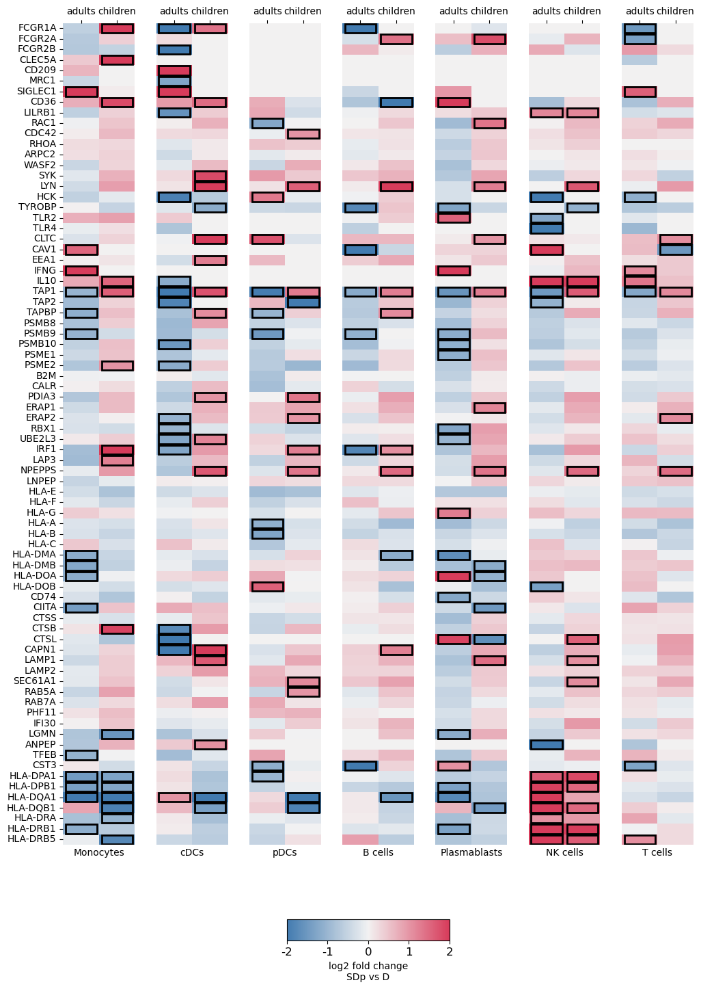

In [28]:
genes_up = [## Antigen uptake
    # Receptors for Endocytosis / Phagocytosis
    "FCGR1A", "FCGR2A", "FCGR2B", "CLEC5A", "CD209", "MRC1", "SIGLEC1",
    "CD36", 'LILRB1',   
    # Actin Cytoskeleton Regulators
    "RAC1", "CDC42", "RHOA", "ARPC2", "WASF2",
    # Adaptor & Signaling Proteins
    "SYK", "LYN", "HCK", "TYROBP", "TLR2", "TLR4",
    # Other / General Vesicular Transport
    "CLTC", "CAV1", "EEA1", #"RAB5A",
    'IFNG', 'IL10', 
    
    ## MHC Class I
    "TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", 
            "PSME1", "PSME2", "B2M",'CALR', "PDIA3", 
    "ERAP1", "ERAP2", 'RBX1', 'UBE2L3', 'IRF1', "LAP3",
    'NPEPPS', "LNPEP", "HLA-E", "HLA-F", "HLA-G",
            "HLA-A", "HLA-B", "HLA-C", 
    ## MHC Class II
            "HLA-DMA", "HLA-DMB", "HLA-DOA", "HLA-DOB", "CD74", 'CIITA',
    'CTSS', 'CTSB', 'CTSL', 'CAPN1', "LAMP1", "LAMP2", 'SEC61A1',
    'RAB5A', 'RAB7A', 'PHF11', "IFI30", "LGMN",
    "ANPEP", "TFEB", "CST3", 
            "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQB1", "HLA-DRA", "HLA-DRB1", "HLA-DRB5", 
           ]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

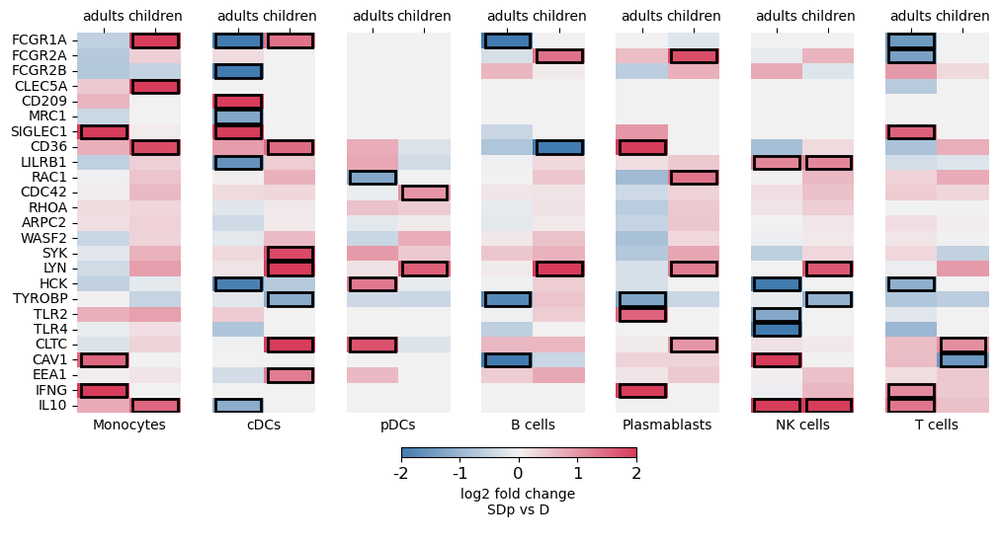

In [39]:
genes_up = [# Receptors for Endocytosis / Phagocytosis
    "FCGR1A", "FCGR2A", "FCGR2B", "CLEC5A", "CD209", "MRC1", "SIGLEC1",
    "CD36", 'LILRB1',
    
    # Actin Cytoskeleton Regulators
    "RAC1", "CDC42", "RHOA", "ARPC2", "WASF2",

    # Adaptor & Signaling Proteins
    "SYK", "LYN", "HCK", "TYROBP", "TLR2", "TLR4",

    # Other / General Vesicular Transport
    "CLTC", "CAV1", "EEA1", #"RAB5A",
    
    'IFNG', 'IL10', 
               ]
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].index.unique()
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

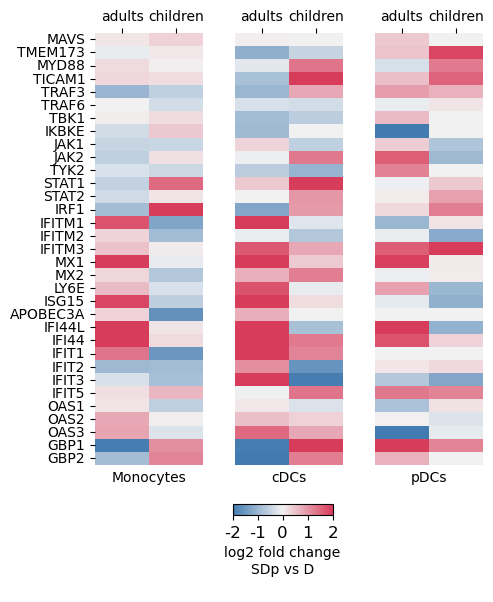

In [79]:
genes_up = [    ## signaling and adaptor molecules
    "MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", 
    "IKBKE", "JAK1", "JAK2", "TYK2", #"RIPK1", "RIPK2", 
    "STAT1", "STAT2", "IRF1", #"IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP",
    ## antiviral effectors
    "IFITM1", "IFITM2", "IFITM3", "MX1", "MX2", "LY6E", "ISG15", "APOBEC3A", #"APOBEC3D", "APOBEC3F", "APOBEC3G", 
    'IFI44L', 'IFI44', "IFIT1", "IFIT2", "IFIT3", "IFIT5", 'OAS1', 'OAS2', 'OAS3',
    #"ZC3HAV1", "SAMHD1", "TRIM5", "MOV10", "ADAR", "PARP12", "PARP14", 
    "GBP1", "GBP2", #"GBP4", "GBP5", "GBP7", "RNASEL", "SLFN11", "SLFN13", "SLFN14", "C19orf66", "RSAD2", "BST2", "HERC5", "HERC6", "TRIM22", "TRIM25", "TRIM34", "LGALS3BP",
]
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               figsize = [5,len(genes_up)*0.17],
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', #'B cells', 'Plasmablasts', 'NK cells', 'T cells',  
                                     ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



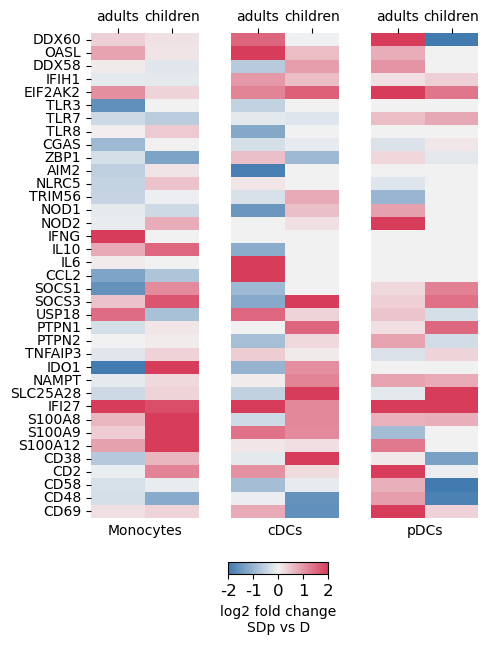

In [80]:
genes_up = [
    ## PRR
    "DDX60", "OASL", "DDX58", "IFIH1", "EIF2AK2", 
            "TLR3", "TLR7", "TLR8", 
            "CGAS", #"IFI16", 
            "ZBP1", "AIM2", 
            "NLRC5", "TRIM56", "NOD1", "NOD2", 
    ## cytokines
    'IFNG', 'IL10', 'IL6', 'CCL2',
    
    ## negative immunoregulators
    "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3",

    ## Metabolic regulators
    "IDO1", "NAMPT", "SLC25A28",
    
    ## stress response
    "IFI27", "S100A8", "S100A9", "S100A12", "CD38",
    ## co-stimulatory
    "CD2", "CD58", "CD48",  "CD69",
           
           ]
#genes_up = list(set(genes_up))
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               figsize = [5,len(genes_up)*0.17],
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', #'B cells', 'Plasmablasts', 'NK cells', 'T cells',  
                                     ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



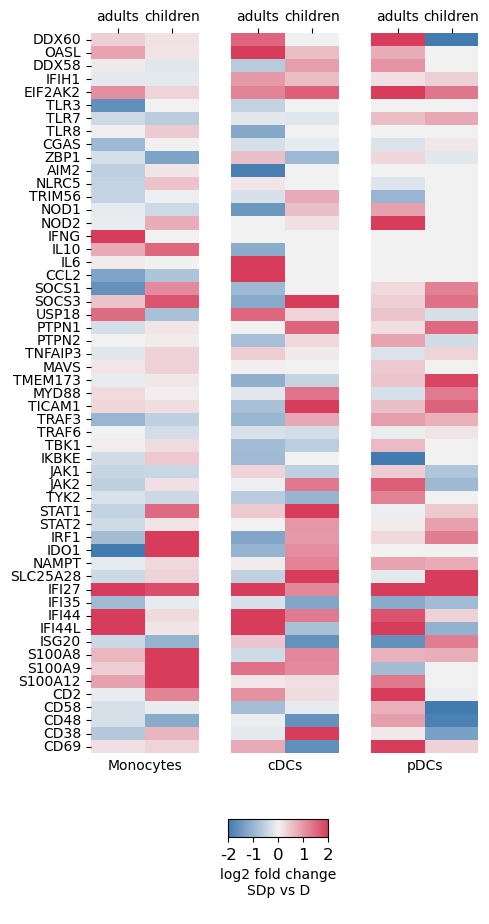

In [74]:
genes_up = [
    ## PRR
    "DDX60", "OASL", "DDX58", "IFIH1", "EIF2AK2", 
            "TLR3", "TLR7", "TLR8", 
            "CGAS", #"IFI16", 
            "ZBP1", "AIM2", 
            "NLRC5", "TRIM56", "NOD1", "NOD2", 
    ## cytokines
    'IFNG', 'IL10', 'IL6', 'CCL2',
    
    ## negative immunoregulators
    "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3",

    ## signaling and adaptor molecules
    "MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", 
    "IKBKE", "JAK1", "JAK2", "TYK2", #"RIPK1", "RIPK2", 
    "STAT1", "STAT2", "IRF1", #"IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP",
        
    ## Metabolic regulators
    "IDO1", "NAMPT", "SLC25A28",
    
    ## other
    "IFI27", "IFI35", "IFI44", "IFI44L", "ISG20", "S100A8", "S100A9", "S100A12", "CD2", "CD58", "CD48", "CD38", "CD69",
           
           ]
#genes_up = list(set(genes_up))
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               figsize = [5,len(genes_up)*0.17],
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', #'B cells', 'Plasmablasts', 'NK cells', 'T cells',  
                                     ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



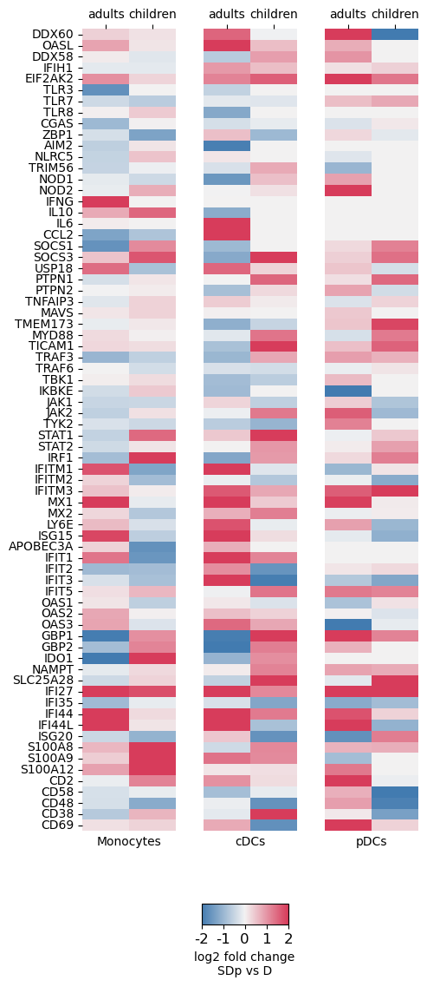

In [68]:
genes_up = [
    ## PRR
    "DDX60", "OASL", "DDX58", "IFIH1", "EIF2AK2", 
            "TLR3", "TLR7", "TLR8", 
            "CGAS", #"IFI16", 
            "ZBP1", "AIM2", 
            "NLRC5", "TRIM56", "NOD1", "NOD2", 
    ## cytokines
    'IFNG', 'IL10', 'IL6', 'CCL2',
    
    ## negative immunoregulators
    "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3",

    ## signaling and adaptor molecules
    "MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", 
    "IKBKE", "JAK1", "JAK2", "TYK2", #"RIPK1", "RIPK2", 
    "STAT1", "STAT2", "IRF1", #"IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP",
    
    ## antiviral effectors
    "IFITM1", "IFITM2", "IFITM3", "MX1", "MX2", "LY6E", "ISG15", "APOBEC3A", #"APOBEC3D", "APOBEC3F", "APOBEC3G", 
    "IFIT1", "IFIT2", "IFIT3", "IFIT5", 'OAS1', 'OAS2', 'OAS3',
    #"ZC3HAV1", "SAMHD1", "TRIM5", "MOV10", "ADAR", "PARP12", "PARP14", 
    "GBP1", "GBP2", #"GBP4", "GBP5", "GBP7", "RNASEL", "SLFN11", "SLFN13", "SLFN14", "C19orf66", "RSAD2", "BST2", "HERC5", "HERC6", "TRIM22", "TRIM25", "TRIM34", "LGALS3BP",
    
    ## Metabolic regulators
    "IDO1", "NAMPT", "SLC25A28",
    
    ## other
    "IFI27", "IFI35", "IFI44", "IFI44L", "ISG20", "S100A8", "S100A9", "S100A12", "CD2", "CD58", "CD48", "CD38", "CD69",
           
           ]
#genes_up = list(set(genes_up))
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               figsize = [5,12],
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', #'B cells', 'Plasmablasts', 'NK cells', 'T cells',  
                                     ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



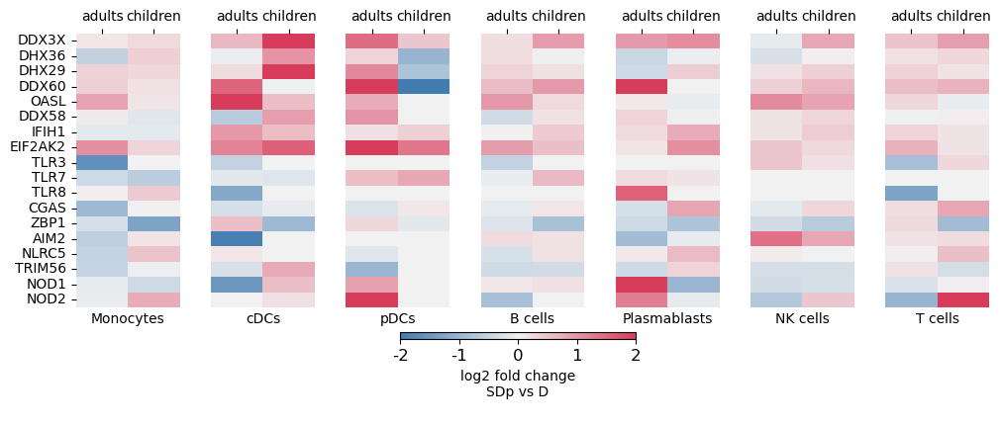

In [53]:
genes_up = ['DDX3X', 'DHX36', 'DHX29', "DDX60", "OASL", "DDX58", "IFIH1", "EIF2AK2", "TLR3", "TLR7", "TLR8", 
            "CGAS", "IFI16", "ZBP1", "AIM2", 
            "NLRC5", "NOD1", "NOD2", "TRIM56"]
#genes_up = list(set(genes_up))
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



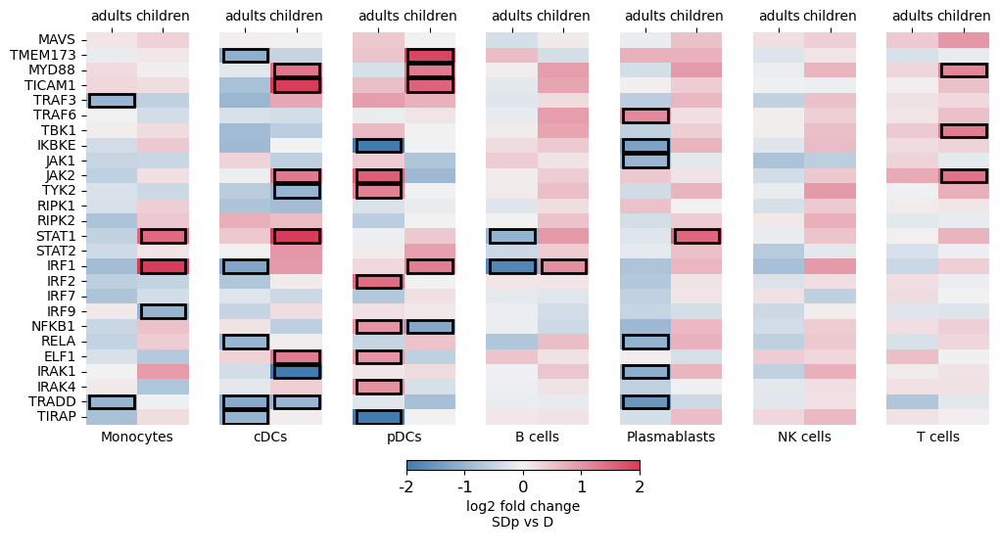

In [43]:
genes_up = ["MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", "IKBKE", "JAK1", "JAK2", "TYK2", "RIPK1", "RIPK2", "STAT1", "STAT2", "IRF1", "IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP"]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))


In [50]:
genes_up = ['DDX3X', 'DHX36', 'DHX29', "DDX60", "OASL", "DDX58", "IFIH1", "EIF2AK2", "TLR3", "TLR7", "TLR8", 
            "CGAS", "IFI16", "ZBP1", "AIM2", 
            "NLRC5", "NOD1", "NOD2", "TRIM56",
            "MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", "IKBKE", "JAK1", "JAK2", "TYK2", "RIPK1", "RIPK2", "STAT1", "STAT2", "IRF1", "IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP",
            "TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", "PSME1", "PSME2", "B2M", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HLA-G", "CIITA", "HLA-DMB", "HLA-DOB", "CD74", "CTSS",
    "CXCL9", "CXCL10", "CXCL11", "CCL2", "CCL3", "CCL5", "IL15", "IL15RA", "IL18", "IL6", "FAS", "FASLG", "TNFSF10", "CASP1", "CASP4", "CASP5", "CASP8", "BAK1", "BAX", "XAF1", "GSDMD",
            "CD274", "CD80", "CD86", "CD40", "CEACAM1", "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3",
    "IFITM1", "IFITM2", "IFITM3", "MX1", "MX2", "CH25H", "LY6E", "ADGRG5", "APOBEC3A", "APOBEC3D", "APOBEC3F", "APOBEC3G", "IFIT1", "IFIT2", "IFIT3", "IFIT5", "ZC3HAV1", "SAMHD1", "TRIM5", "MOV10", "ADAR", "PARP12", "PARP14", "ISG15", "GBP1", "GBP2", "GBP4", "GBP5", "GBP7", "RNASEL", "SLFN11", "SLFN13", "SLFN14", "C19orf66", "RSAD2", "BST2", "HERC5", "HERC6", "TRIM22", "TRIM25", "TRIM34", "LGALS3BP",
    "IDO1", "NAMPT", "ACADM", "PML", "SAT1", "PLSCR1", "SLC25A28", "SLC2A1", "CHMP5", "TRIB3",
           "IFI27", "IFI35", "IFI44", "IFI44L", "ISG20", "S100A8", "S100A9", "S100A12", "CD2", "CD58", "CD48", "CD38", "CD69",
           ]
all_stats2.reset_index().set_index('gene').loc[genes_up][['cell_type', 'children', 'adults']].to_csv(save_tables+'selected_genes_table.csv')

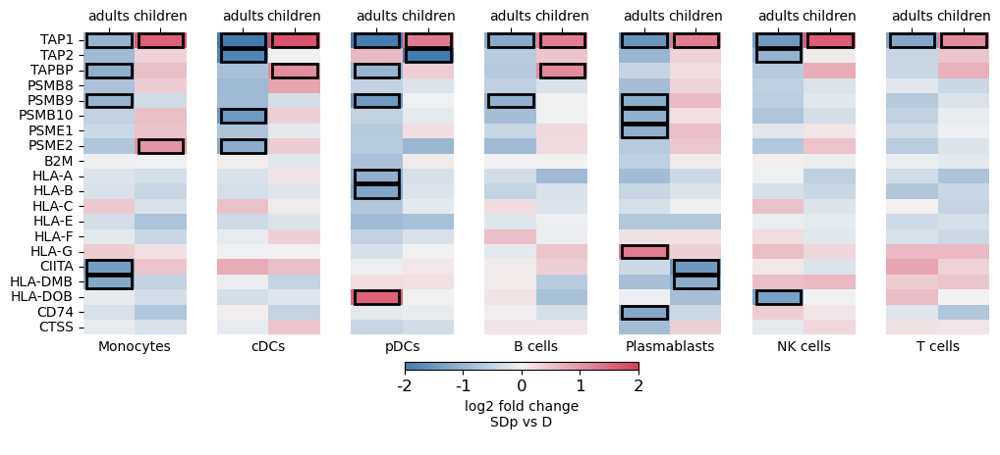

In [33]:
genes_up = ["TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", "PSME1", "PSME2", "B2M", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HLA-G", "CIITA", "HLA-DMB", "HLA-DOB", "CD74", "CTSS",]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



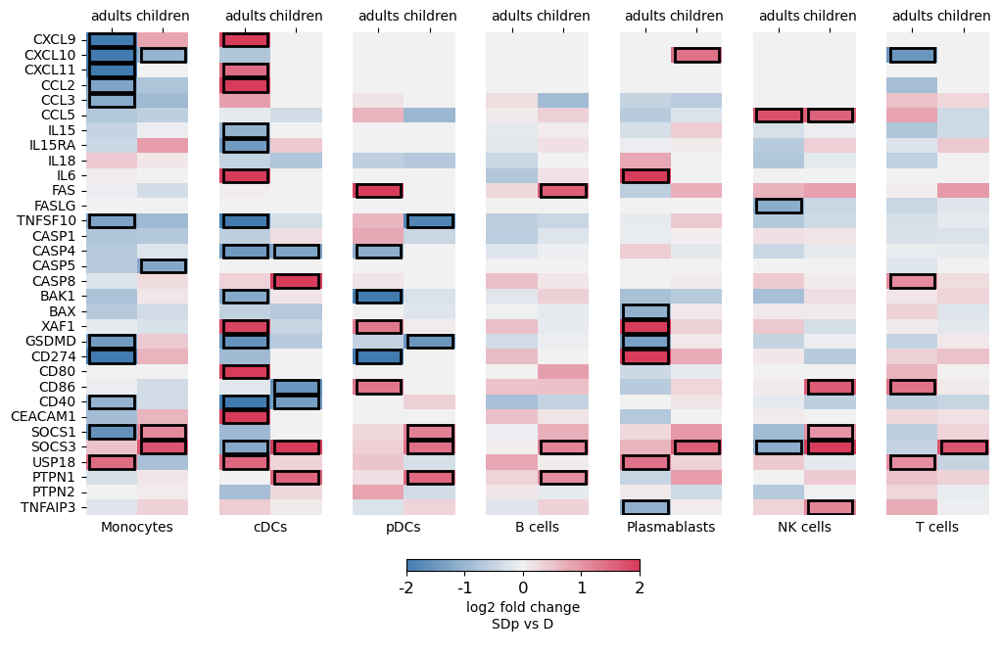

In [34]:
genes_up = ["CXCL9", "CXCL10", "CXCL11", "CCL2", "CCL3", "CCL5", "IL15", "IL15RA", "IL18", "IL6", "FAS", "FASLG", "TNFSF10", "CASP1", "CASP4", "CASP5", "CASP8", "BAK1", "BAX", "XAF1", "GSDMD",
            "CD274", "CD80", "CD86", "CD40", "CEACAM1", "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3"]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



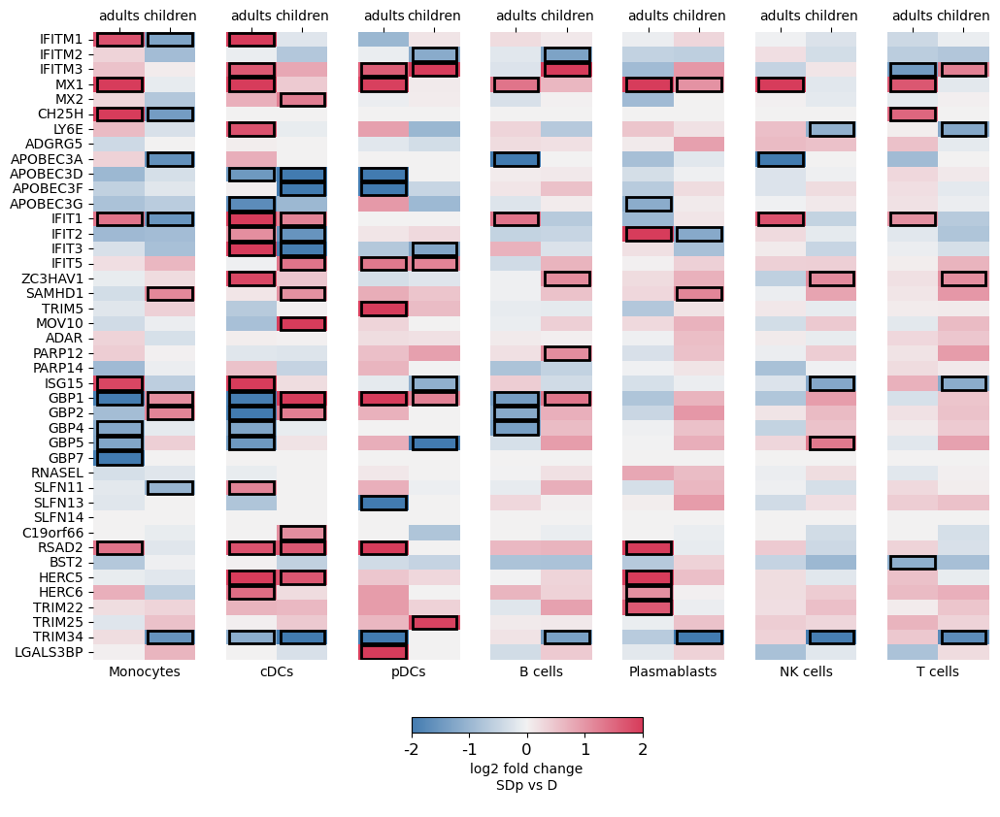

In [35]:
genes_up = ["IFITM1", "IFITM2", "IFITM3", "MX1", "MX2", "CH25H", "LY6E", "ADGRG5", "APOBEC3A", "APOBEC3D", "APOBEC3F", "APOBEC3G", "IFIT1", "IFIT2", "IFIT3", "IFIT5", "ZC3HAV1", "SAMHD1", "TRIM5", "MOV10", "ADAR", "PARP12", "PARP14", "ISG15", "GBP1", "GBP2", "GBP4", "GBP5", "GBP7", "RNASEL", "SLFN11", "SLFN13", "SLFN14", "C19orf66", "RSAD2", "BST2", "HERC5", "HERC6", "TRIM22", "TRIM25", "TRIM34", "LGALS3BP"]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



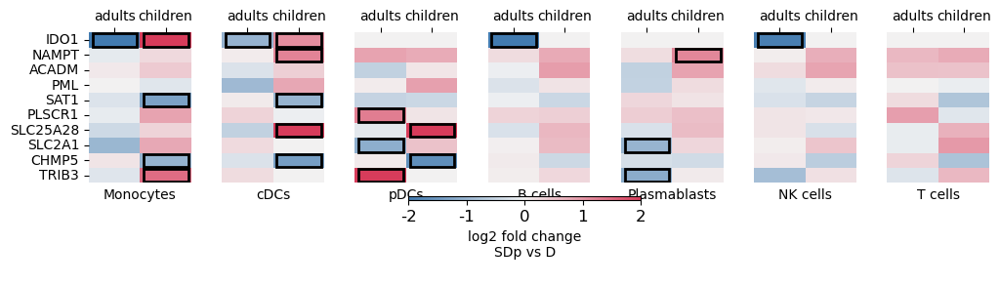

In [36]:
genes_up = ["IDO1", "NAMPT", "ACADM", "PML", "SAT1", "PLSCR1", "SLC25A28", "SLC2A1", "CHMP5", "TRIB3"]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



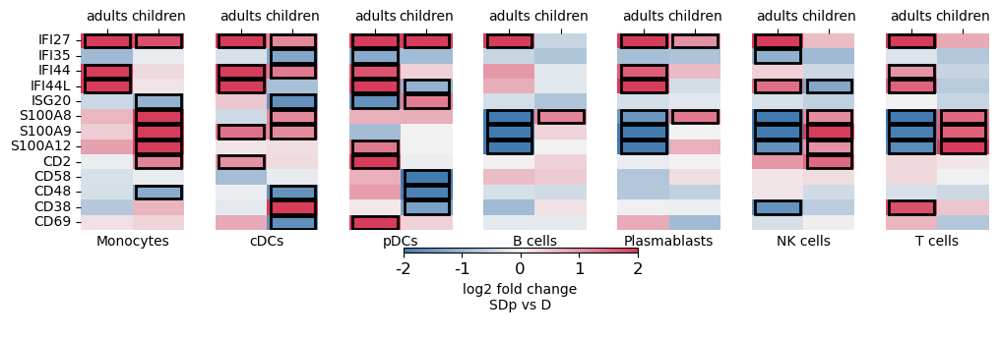

In [37]:
genes_up = ["IFI27", "IFI35", "IFI44", "IFI44L", "ISG20", "S100A8", "S100A9", "S100A12", "CD2", "CD58", "CD48", "CD38", "CD69"]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



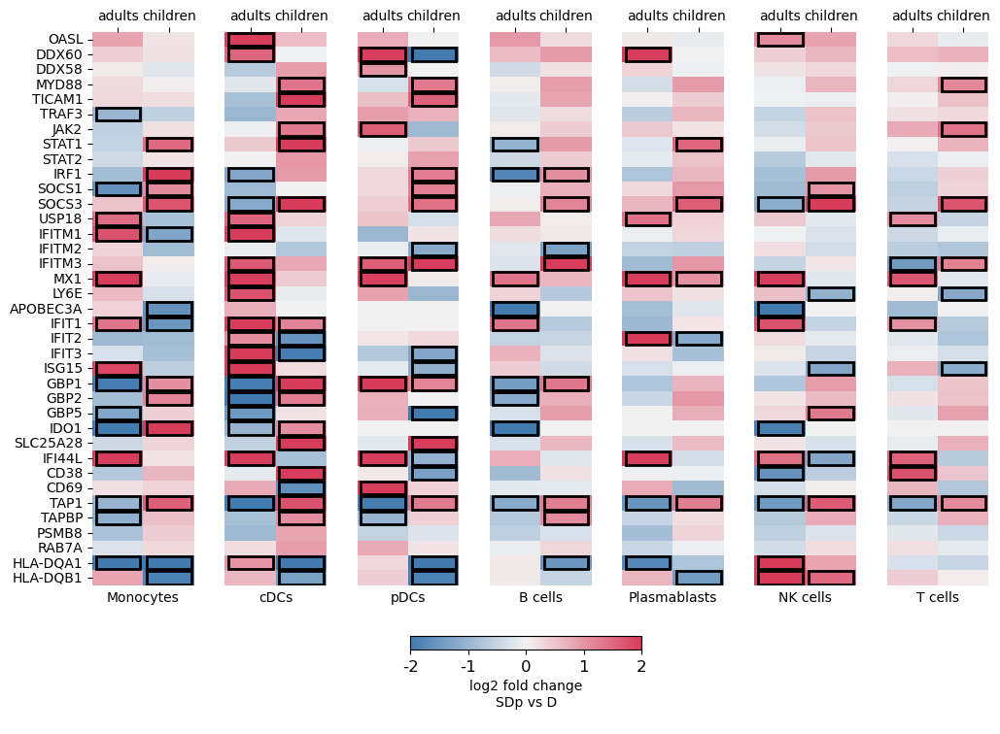

In [38]:
genes_up = ['OASL', 'DDX60', 'DDX58',
'MYD88', 'TICAM1', 'TRAF3', 'JAK2', 'STAT1', 'STAT2', 'IRF1',
'SOCS1', 'SOCS3', 'USP18',
'IFITM1', 'IFITM2', 'IFITM3', 'MX1', 'LY6E', 'APOBEC3A', 'IFIT1', 'IFIT2', 'IFIT3', 'ISG15', 'GBP1', 'GBP2', 'GBP5',
'IDO1', 'SLC25A28',
'IFI44L', 'CD38', 'CD69',
'TAP1', 'TAPBP', 'PSMB8', 'RAB7A', 
'HLA-DQA1', 'HLA-DQB1'
]
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

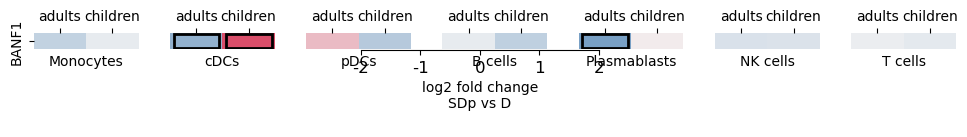

In [51]:
genes_up = ['BANF1']
fig, ax = heatmaps_from_log2FC_2(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))



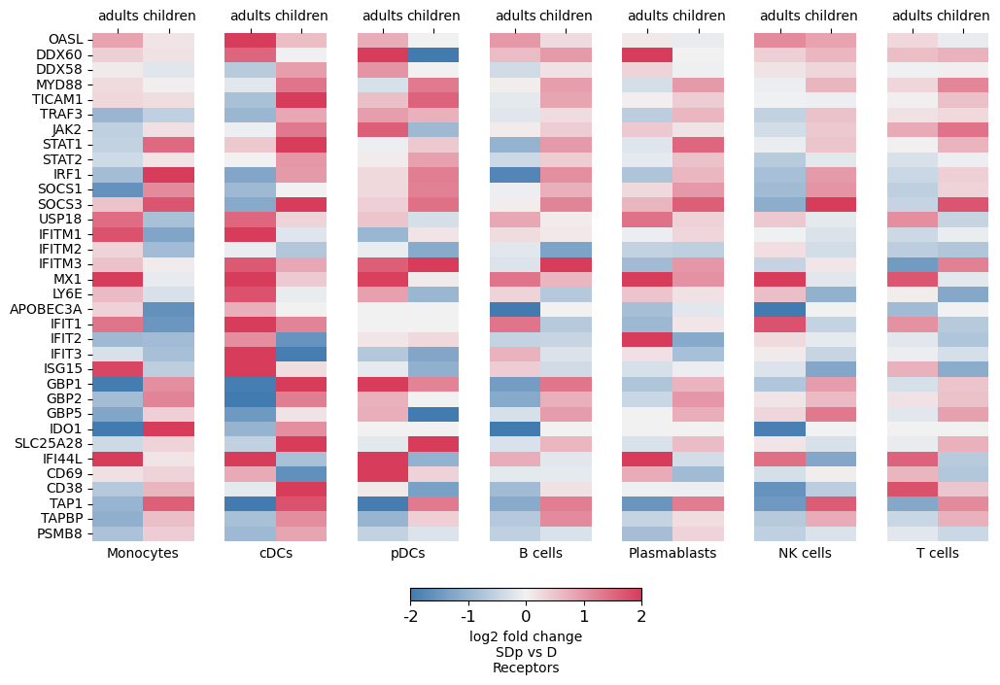

In [8]:
genes = ['OASL', 'DDX60', 'DDX58',
'MYD88', 'TICAM1', 'TRAF3', 'JAK2', 'STAT1', 'STAT2', 'IRF1',
'SOCS1', 'SOCS3', 'USP18',
'IFITM1', 'IFITM2', 'IFITM3', 'MX1', 'LY6E', 'APOBEC3A', 'IFIT1', 'IFIT2', 'IFIT3', 'ISG15', 'GBP1', 'GBP2', 'GBP5',
'IDO1', 'SLC25A28',
'IFI44L', 'CD69', 'CD38', 
'TAP1', 'TAPBP', 'PSMB8',    
]
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\nReceptors', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

df_kid_path=save_tables+'DEGs_SD_vs_D_medpair_children_031325_alternative_1e-3.csv'
df_adult_path=save_tables+'DEGs_SD_vs_D_medpair_adults_031325_alternative_1e-3.csv'
index_col=['cell_type', 'SD', 'D']
df_kid = pd.read_csv(df_kid_path, sep='\t', index_col=index_col)
df_kid = df_kid[df_kid.columns[2:]]
df_adult = pd.read_csv(df_adult_path, sep='\t', index_col=index_col)
df_adult = df_adult[df_adult.columns[2:]]


In [28]:
genes = pd.read_csv(f'{path}ISG_library_members.csv', header=None)
genes = list(genes[0])
genes = [x for x in genes if x in all_stats2.reset_index().gene.unique()]
len(genes)

965

In [8]:
'''
CD26: DPP4
NF-kB: NFKB1
'''
receptors = 'TLR2, TLR3, TLR4, IFNLR1, CD80, CD40, DPP4, CD68, P2RX7, P2RY1, P2RY6, IL1R1, IL6ST, TNFRSF1A, TNFRSF10A, CCR1, CCR4, CX3CL1, CXCL9, CXCL10, CXCL11, CCL5, CCL2, CCL4, CCL19, CD274, HLA-E, HLA-F, HLA-G'
signaling = 'JAK1, JAK2, JAK3, TYK2, STAT1, STAT2, STAT3, STAT4, MAP3K5, MAP3K14, MAP2K6, DUSP5, TNFAIP3, TNFAIP6, TRAF2, TRAF3, TRAF6, AKT3, GTPBP1, GIMAP2, GBP1, GBP2, GBP3, GBP4, GBP5, GBP7, NOD1, NOD2, IRF1, IRF3, IRF7, IRF9, NFE2L3, NFKB1, PRKCD'
effectors = 'ISG15, MX1, IFIT1, IFIT2, IFIT3, IFIT5, IFI6, SAMHD1, GZMB, CASP1, CASP3, CASP4, CASP10, APOBEC3A, APOBEC3B, APOBEC3C, APOBEC3D, APOBEC3F, APOBEC3G, SAMD4A, SAMD9, TRIM21, TRIM22, TRIM25, TRIM34, TRIM38, TRIM56, OAS1, OAS2, OAS3, OASL, AIF1, RAB3GAP1, RAB3IP, RAB27A, RAB27B, RNF138, RNF213, RNF31, UBA7, UBA6, PARP12, PARP14, PARP15, RAB24, GTPBP2'

receptors = receptors.split(', ')
signaling = signaling.split(', ')
effectors = effectors.split(', ')

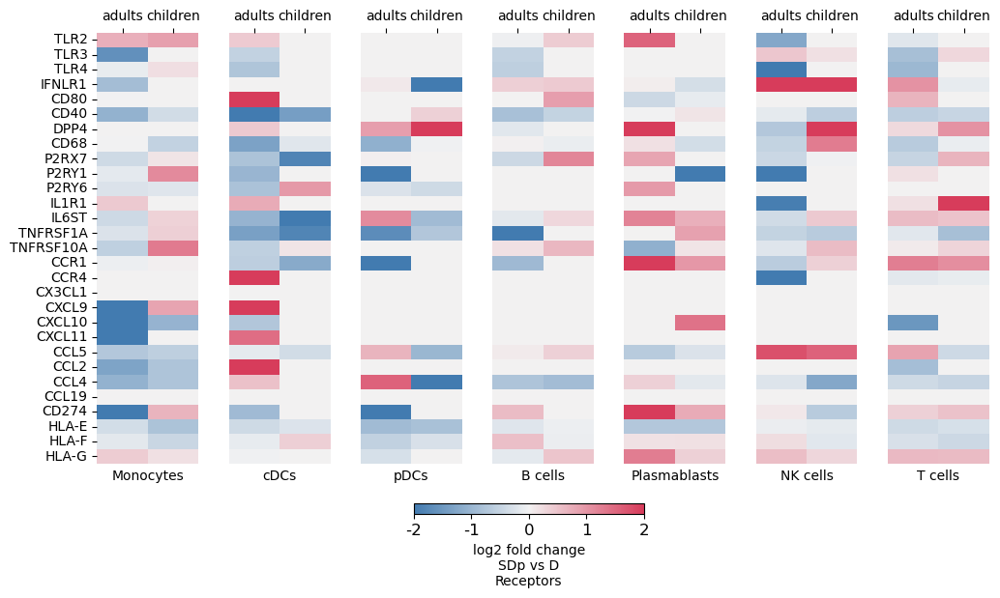

In [9]:
genes = receptors
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\nReceptors', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

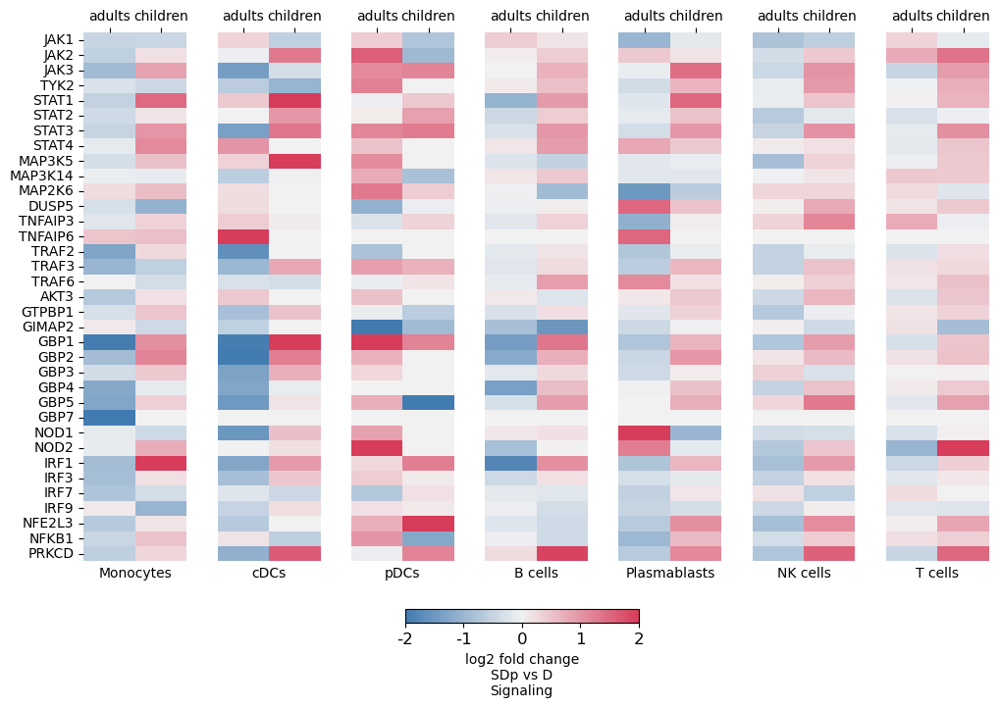

In [10]:
genes = signaling
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\nSignaling', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

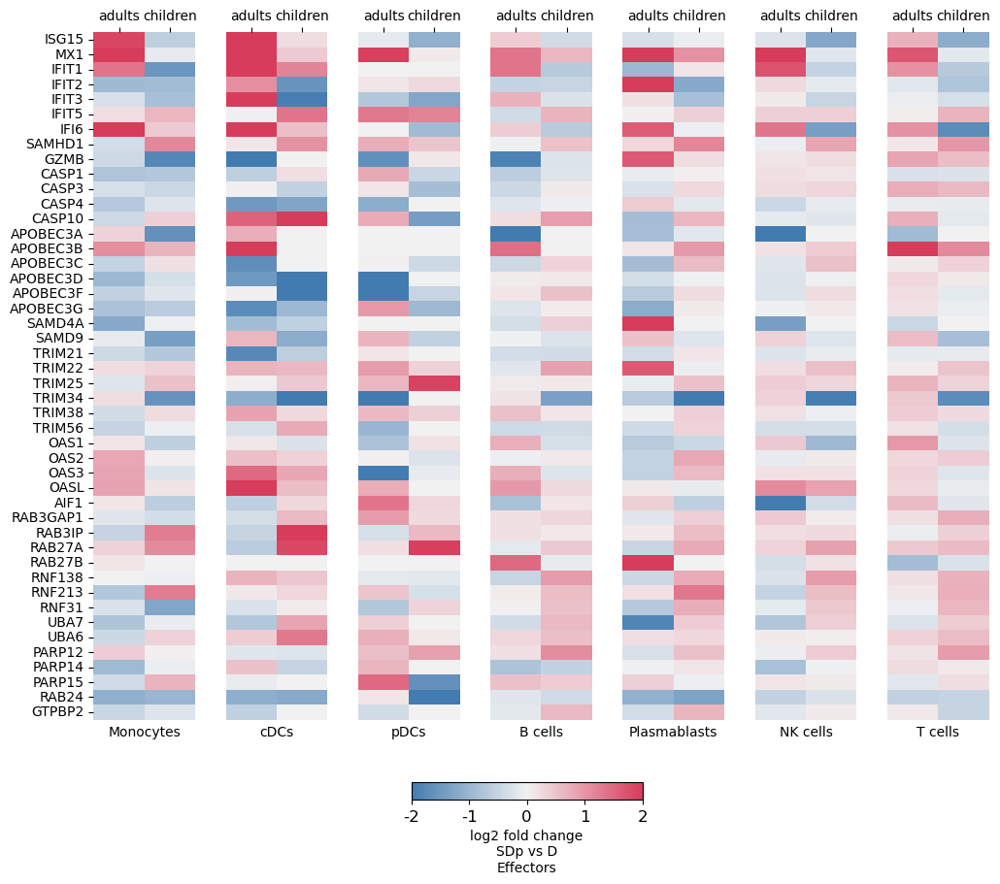

In [11]:
genes = effectors
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\nEffectors', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

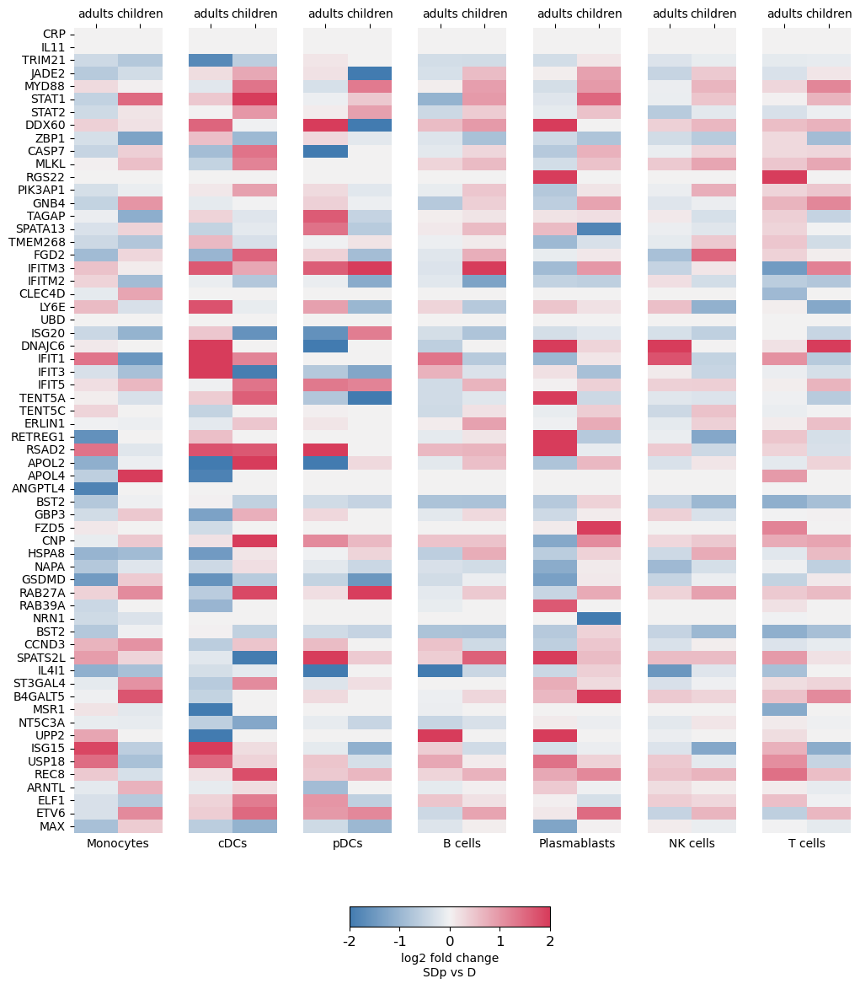

In [28]:
'''
PHF15: JADE2
FAM46A: TENT5A
FAM46C: TENT5C
FAM134B: RETREG1
C9orf91: TMEM268
'''
genes = ['CRP', 'IL11',
         'TRIM21', 'JADE2', 'MYD88', 'STAT1', 'STAT2', 'DDX60', 'ZBP1', 'CASP7', 'MLKL',
         'RGS22', 'PIK3AP1', 'GNB4', 'TAGAP', 'SPATA13', 'TMEM268', 'FGD2',
         'IFITM3', 'IFITM2', 'CLEC4D', 'LY6E', 'UBD', 
         'ISG20', 'DNAJC6', 'IFIT1', 'IFIT3', 'IFIT5', 'TENT5A', 'TENT5C',
         #'FDNC4', 
         'ERLIN1', 'RETREG1', 
         'RSAD2', 'APOL2', 'APOL4', 'ANGPTL4',
         'BST2', 'GBP3', 'FZD5', 'CNP', 'HSPA8', 'NAPA',
         'GSDMD', 'RAB27A', 'RAB39A', 
         'NRN1', 'BST2',
         'CCND3', #'GBA3', 
         'SPATS2L', 
         'IL4I1', 'ST3GAL4', 'B4GALT5', 'MSR1', 'NT5C3A', 'UPP2', 'ISG15', 'USP18',
         'REC8', 'ARNTL', 'ELF1', 'ETV6', 'MAX',
        ]

fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [26]:
all_stats2.reset_index().cell_type.unique()

array(['cDCs', 'pDCs', 'Plasmablasts', 'Monocytes', 'B cells', 'NK cells',
       'T cells'], dtype=object)

In [24]:
all_stats2_copy = all_stats2.copy()

In [29]:
summary = []
for i in all_stats2.index:
    if all_stats2.loc[i]['children'] > 0:
        if all_stats2.loc[i]['adults'] > 0: summary.append('up_up')
        else: summary.append('up_down')
    else:
        if all_stats2.loc[i]['adults'] > 0: summary.append('down_up')
        else: summary.append('down_down')
all_stats2['summary'] = summary
all_stats2


children    adults                   DEG          r  \
cell_type gene                                                             
cDCs      PTCH2    -10.157503 -0.225670  downregulated_either  10.160010   
          FBXL20    -9.771712 -0.458249  downregulated_either   9.782451   
pDCs      PTRH1     -9.751255 -5.008754    downregulated_both  10.962417   
          C1orf122  -9.405309 -0.886794  downregulated_either   9.447023   
cDCs      MFN2      -9.395442  0.091293  downregulated_either   9.395886   
...                       ...       ...                   ...        ...   
          KLHDC7B    9.605623  1.173342      upregulated_both   9.677020   
          EMC1       9.629872  0.040651    upregulated_either   9.629958   
          BCAT1     10.295618 -0.104526    upregulated_either  10.296149   
          PIM1      10.877350 -2.109276               reverse  11.079972   
          NOC2L     11.050701 -1.527760               reverse  11.155808   

                            r2  distance    summary  
cell_type gene                                       
cDCs      PTCH2     103.225794  7.022867  down_down  
          FBXL20     95.696348  6.585613  down_down  
pDCs      PTRH1     120.174588  3.353455  down_down  
          C1orf122   89.246241  6.023500  down_down  
cDCs      MFN2       88.282665  6.708135    down_up  
...                        ...       ...        ...  
          KLHDC7B    93.644725  5.962523      up_up  
          EMC1       92.736087  6.780603      up_up  
          BCAT1     106.010676  7.354012    up_down  
          PIM1      122.765788  9.182931    up_down  
          NOC2L     124.452044  8.894315    up_down  

[221963 rows x 7 columns]

In [43]:
genes1 = all_stats2.loc[['cDCs', 'Monocytes']][abs(all_stats2.loc[['cDCs', 'Monocytes']].children)>1].reset_index().gene.unique()
genes2 = all_stats2.loc[['cDCs', 'Monocytes']][abs(all_stats2.loc[['cDCs', 'Monocytes']].adults)>1].reset_index().gene.unique()
genes_sign = list(set([*genes1, *genes2]))
genes_sign

['COL11A2',
 'EFCAB10',
 'SMIM24',
 'AL450998.2',
 'HPN',
 'AL691432.4',
 'CD320',
 'SCARNA9',
 'MELTF-AS1',
 'Z97055.2',
 'CASTOR3',
 'FAM153B',
 'AC063944.1',
 'AC016866.1',
 'AP003973.4',
 'GINS4',
 'AC022126.1',
 'HES1',
 'GPCPD1',
 'NOD1',
 'LCMT1',
 'EEF2KMT',
 'GPR62',
 'SPCS1',
 'AP001437.1',
 'TCEAL1',
 'DAPL1',
 'ZNF558',
 'SLAMF8',
 'MTHFD1',
 'NUCB1',
 'NR1D1',
 'HIST1H2AM',
 'LZTS2',
 'AC091180.3',
 'PPIP5K1',
 'AC112719.2',
 'AL135838.1',
 'LINC00612',
 'SPART-AS1',
 'ORC3',
 'CTSB',
 'TMEM14C',
 'SCAF1',
 'XDH',
 'PRMT5',
 'AC011444.2',
 'AL390719.3',
 'METTL16',
 'AC011447.3',
 'LINC02828',
 'SDHAF4',
 'MED9',
 'PPIL2',
 'ZC3HAV1L',
 'C9orf43',
 'SMU1',
 'AC025171.1',
 'AC100793.2',
 'AC068025.2',
 'SLC35A2',
 'MVP',
 'GAA',
 'SHKBP1',
 'SLC39A1',
 'AC093459.1',
 'KLLN',
 'BORCS8-MEF2B',
 'LRP4-AS1',
 'HMGA1P4',
 'AP001033.3',
 'FASTKD3',
 'CALCB',
 'AC130324.2',
 'CCR1',
 'CENPF',
 'SNHG4',
 'SLC22A1',
 'RUSC1-AS1',
 'AC016683.1',
 'RNF165',
 'OTOF',
 'AC026471.2',
 'A

In [30]:
genes = pd.read_csv(f'{path}ISG_library_members.csv', header=None)
genes = list(genes[0])
genes = [x for x in genes if x in all_stats2.reset_index().gene.unique()]


In [44]:
genes_sign = [x for x in genes if x in genes_sign]

In [45]:
all_stats2.reset_index().pivot(index='gene', columns='cell_type', values='summary').loc[genes_sign]

cell_type,B cells,Monocytes,NK cells,Plasmablasts,T cells,cDCs,pDCs
gene,,,,,,,
APOBEC3D,up_up,down_down,down_down,down_down,up_up,down_down,down_down
RBMS2,down_down,up_up,down_down,up_up,up_up,up_up,down_up
CIITA,up_up,up_down,down_up,down_down,up_up,up_up,up_down
ELF1,up_up,down_down,up_up,down_up,down_up,up_up,down_up
HLA-DMB,down_up,down_down,up_up,down_down,up_up,down_down,up_up
...,...,...,...,...,...,...,...
C1QB,down_down,down_down,down_down,down_down,down_down,up_down,down_down
FGD2,up_down,up_down,up_down,up_down,up_up,up_down,down_up
CALHM6,down_up,down_up,down_up,down_down,down_up,down_up,down_up


In [46]:
df = all_stats2.reset_index().pivot(index='gene', columns='cell_type', values='summary').loc[genes_sign]
df['common'] = df['Monocytes']+'_'+df['cDCs']
df

cell_type,B cells,Monocytes,NK cells,Plasmablasts,T cells,cDCs,pDCs,common
gene,,,,,,,,
APOBEC3D,up_up,down_down,down_down,down_down,up_up,down_down,down_down,down_down_down_down
RBMS2,down_down,up_up,down_down,up_up,up_up,up_up,down_up,up_up_up_up
CIITA,up_up,up_down,down_up,down_down,up_up,up_up,up_down,up_down_up_up
ELF1,up_up,down_down,up_up,down_up,down_up,up_up,down_up,down_down_up_up
HLA-DMB,down_up,down_down,up_up,down_down,up_up,down_down,up_up,down_down_down_down
...,...,...,...,...,...,...,...,...
C1QB,down_down,down_down,down_down,down_down,down_down,up_down,down_down,down_down_up_down
FGD2,up_down,up_down,up_down,up_down,up_up,up_down,down_up,up_down_up_down
CALHM6,down_up,down_up,down_up,down_down,down_up,down_up,down_up,down_up_down_up


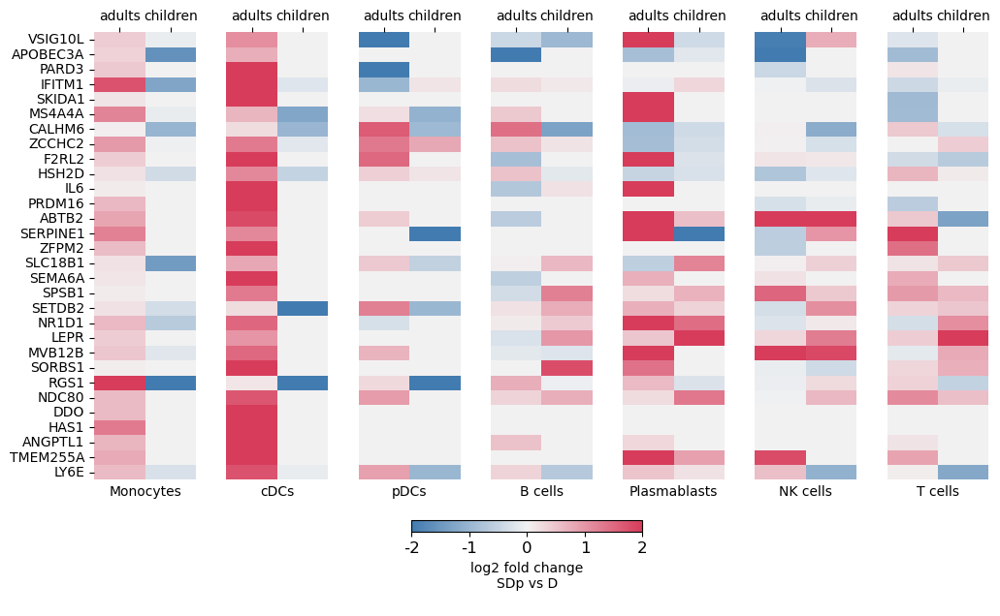

In [47]:
genes_up = df[df.common == 'down_up_down_up'].index.to_list()
genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

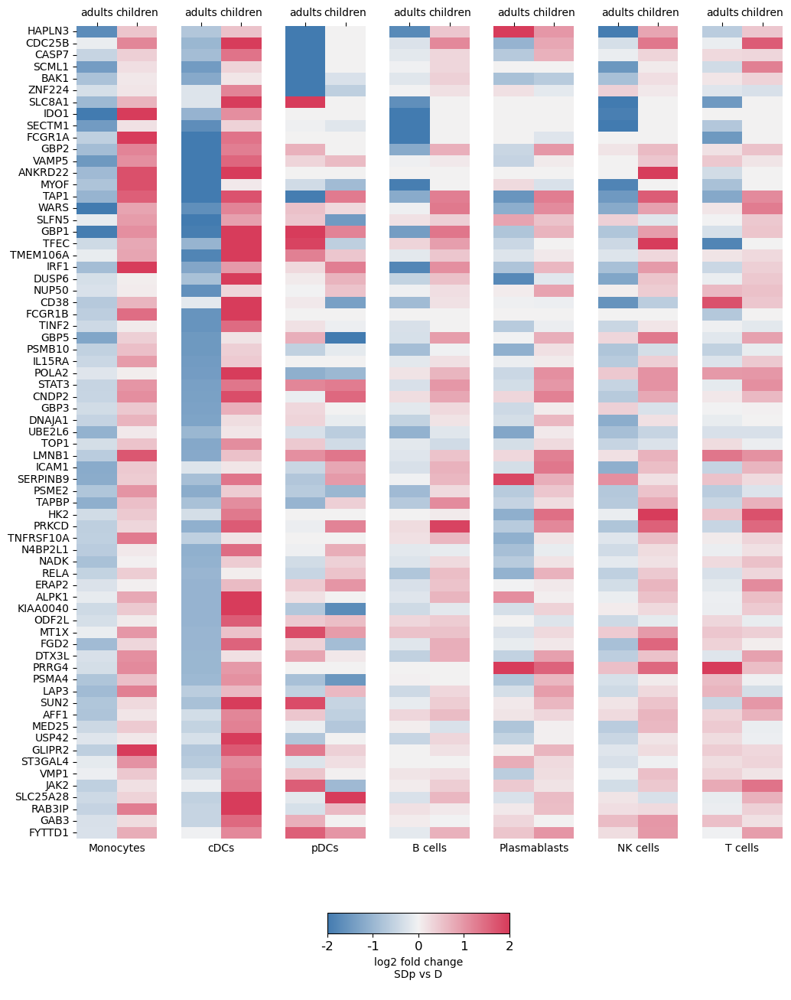

In [48]:
genes_up = df[df.common == 'up_down_up_down'].index.to_list()
genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [50]:
genes_up = df.loc[genes][df.loc[genes].common == 'up_up_up_up'].index.to_list()

In [51]:
df.loc[genes]

cell_type,B cells,Monocytes,NK cells,Plasmablasts,T cells,cDCs,pDCs,common
gene,,,,,,,,
APOBEC3D,up_up,down_down,down_down,down_down,up_up,down_down,down_down,down_down_down_down
RBMS2,down_down,up_up,down_down,up_up,up_up,up_up,down_up,up_up_up_up
CIITA,up_up,up_down,down_up,down_down,up_up,up_up,up_down,up_down_up_up
ELF1,up_up,down_down,up_up,down_up,down_up,up_up,down_up,down_down_up_up
CLEC2B,down_down,down_down,up_up,down_up,down_up,up_up,up_up,down_down_up_up
...,...,...,...,...,...,...,...,...
C1QB,down_down,down_down,down_down,down_down,down_down,up_down,down_down,down_down_up_down
FGD2,up_down,up_down,up_down,up_down,up_up,up_down,down_up,up_down_up_down
CALHM6,down_up,down_up,down_up,down_down,down_up,down_up,down_up,down_up_down_up


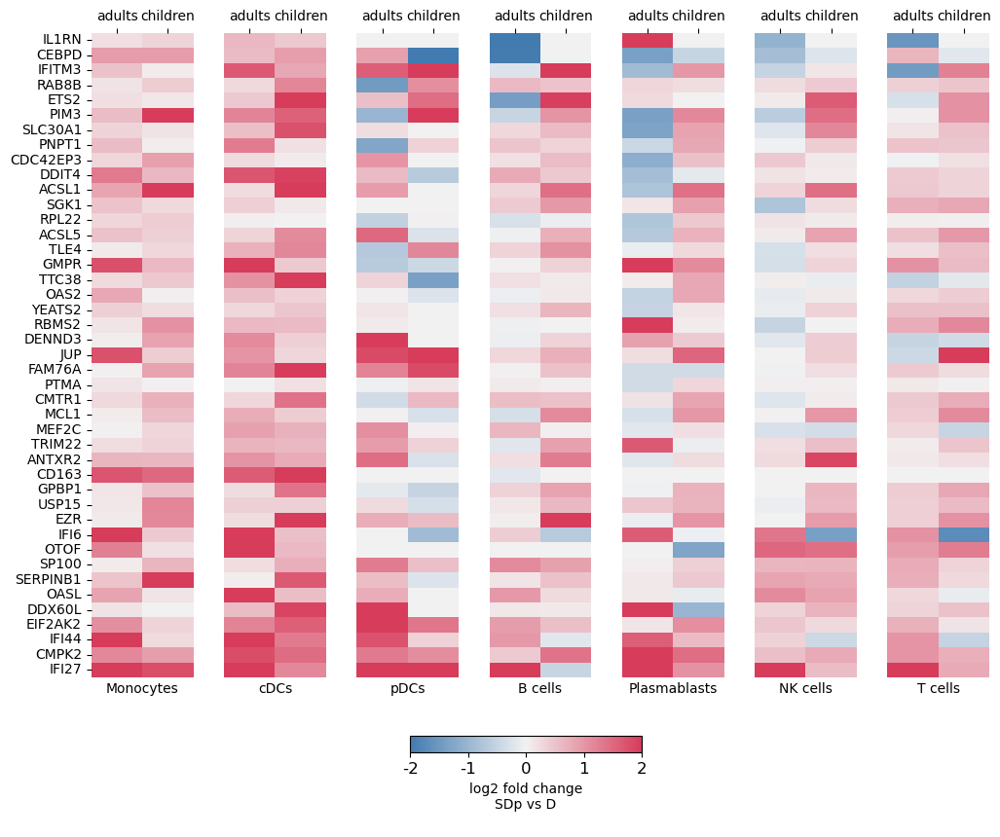

In [61]:
# mono, cDC, children, adults
#'up_up_up_up'

genes_up = df.loc[genes][df.loc[genes].common == 'up_up_up_up'].index.to_list()
genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [57]:
genes_up = df.loc[genes][df.loc[genes].common == 'down_down_down_down'].index.to_list()


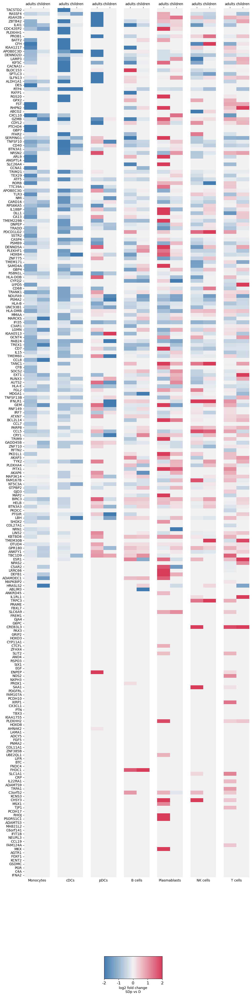

In [60]:
genes_up = df.loc[genes][df.loc[genes].common == 'down_down_down_down'].index.to_list()
genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [63]:
genes_up|


Index(['HAPLN3', 'CDC25B', 'CASP7', 'BAK1', 'ZNF224', 'SLC8A1', 'IDO1',
       'SECTM1', 'FCGR1A', 'GBP2', 'VAMP5', 'ANKRD22', 'MYOF', 'TAP1', 'WARS',
       'SLFN5', 'GBP1', 'TFEC', 'TMEM106A', 'IRF1', 'DUSP6', 'NUP50', 'CD38',
       'FCGR1B', 'TINF2', 'GBP5', 'PSMB10', 'IL15RA', 'POLA2', 'STAT3',
       'CNDP2', 'GBP3', 'DNAJA1', 'IFNGR1', 'UBE2L6', 'TOP1', 'LMNB1', 'ICAM1',
       'SERPINB9', 'PSME2', 'DYNLT1', 'TAPBP', 'HK2', 'PRKCD', 'TNFRSF10A',
       'N4BP2L1', 'NADK', 'RELA', 'ERAP2', 'ALPK1', 'KIAA0040', 'ODF2L',
       'NOD2', 'MT1X', 'FGD2', 'DTX3L', 'PRRG4', 'PSMB8', 'PSMA4', 'CAMK2D',
       'LAP3', 'AIDA', 'ARNTL', 'TRIM69', 'ANXA2R', 'PPP3CC', 'GTPBP1', 'SUN2',
       'SMARCA5', 'MBP', 'AFF1', 'MED25', 'USP42', 'TRIM5', 'GLIPR2',
       'ST3GAL4', 'BAG1', 'SNX27', 'XRN1', 'VMP1', 'NCOA7', 'JAK2', 'SLC25A28',
       'CTNNBL1', 'RAB3IP', 'ERAP1', 'ZNFX1', 'BLVRA', 'FYTTD1', 'RARRES3'],
      dtype='object', name='gene')

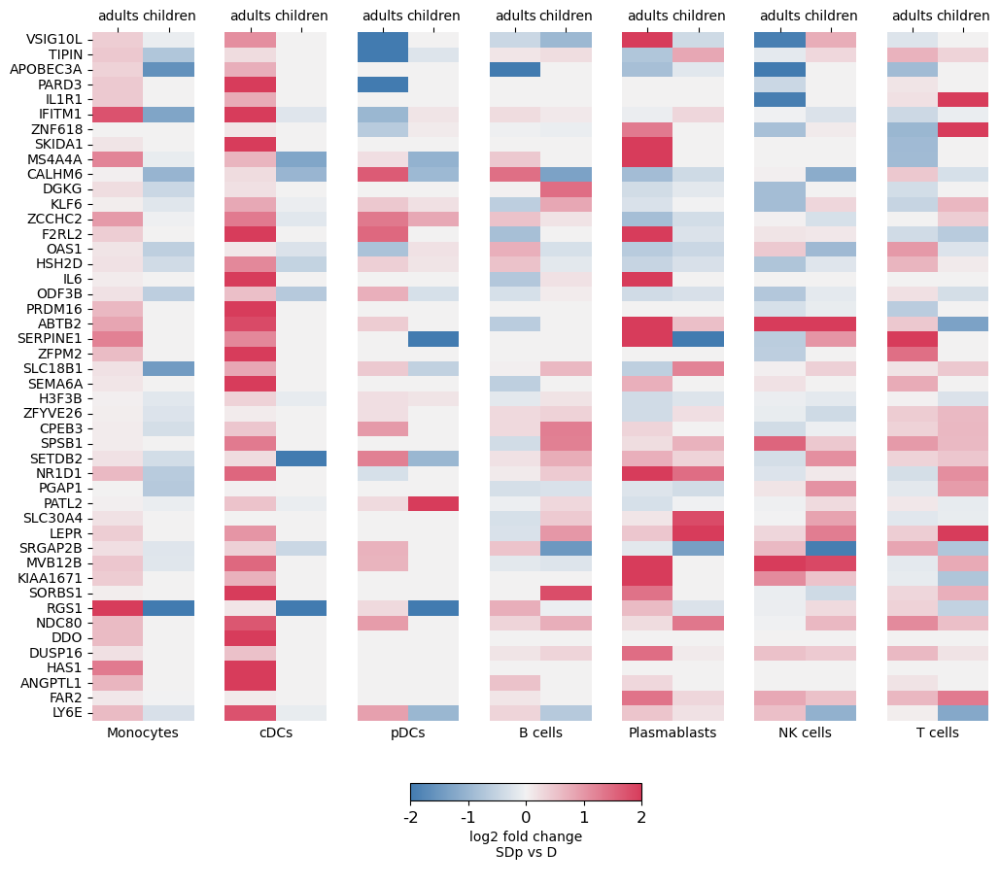

In [64]:
genes_up = df.loc[genes][df.loc[genes].common == 'down_up_down_up'].index.to_list()
genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [23]:
genes_up = ["OASL", "DDX58", "IFIH1", "DHX58", "EIF2AK2", "TLR3", "TLR7", "TLR8", "DDX60", "CGAS", "IFI16", "ZBP1", "AIM2", 
            "CGAS", "NLRC5", "NOD1", "NOD2", "TRIM56"]

genes_up = ["MAVS", "TMEM173", "MYD88", "TICAM1", "TRAF3", "TRAF6", "TBK1", "IKBKE", "JAK1", "JAK2", "TYK2", "RIPK1", "RIPK2", "STAT1", "STAT2", "IRF1", "IRF2", "IRF7", "IRF9", "NFKB1", "RELA", "ELF1", "IRAK1", "IRAK4", "TRADD", "TIRAP", "USP18"]

genes_up = ["TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", "PSME1", "PSME2", "B2M", "HLA-A", "HLA-B", "HLA-C", "HLA-E", "HLA-F", "HLA-G", "CIITA", "HLA-DMB", "HLA-DOB", "CD74", "CTSS",]
genes_up = ["CXCL9", "CXCL10", "CXCL11", "CCL2", "CCL3", "CCL5", "IL15", "IL15RA", "IL18", "IL6", "FAS", "FASLG", "TNFSF10", "CASP1", "CASP4", "CASP5", "CASP8", "BAK1", "BAX", "XAF1", "GSDMD",
            "CD274", "CD80", "CD86", "CD40", "CEACAM1", "SOCS1", "SOCS3", "USP18", "PTPN1", "PTPN2", "TNFAIP3"]

genes_up = ["IFITM1", "IFITM2", "IFITM3", "MX1", "MX2", "CH25H", "LY6E", "ADGRG5", "APOBEC3A", "APOBEC3D", "APOBEC3F", "APOBEC3G", "IFIT1", "IFIT2", "IFIT3", "IFIT5", "ZC3HAV1", "SAMHD1", "TRIM5", "MOV10", "ADAR", "PARP12", "PARP14", "ISG15", "GBP1", "GBP2", "GBP4", "GBP5", "GBP7", "RNASEL", "SLFN11", "SLFN13", "SLFN14", "C19orf66", "RSAD2", "BST2", "HERC5", "HERC6", "TRIM22", "TRIM25", "TRIM34", "LGALS3BP"]

genes_up = ["IDO1", "NAMPT", "ACADM", "PML", "SAT1", "PLSCR1", "SLC25A28", "SLC2A1", "CHMP5", "TRIB3"]

genes_up = ["IFI27", "IFI35", "IFI44", "IFI44L", "ISG20", "S100A8", "S100A9", "S100A12", "CD2", "CD58", "CD48", "CD38", "CD69"]

genes_up = ['OASL', 'DDX60', 'DDX58',
'MYD88', 'TICAM1', 'TRAF3', 'JAK2', 'STAT1', 'STAT2', 'IRF1',
'SOCS1', 'SOCS3', 'USP18',
'IFITM1', 'IFITM2', 'IFITM3', 'MX1', 'LY6E', 'APOBEC3A', 'IFIT1', 'IFIT2', 'IFIT3', 'ISG15', 'GBP1', 'GBP2', 'GBP5',
'IDO1', 'SLC25A28',
'IFI44L', 'CD38', 'CD69',
'TAP1', 'TAPBP', 'PSMB8', 'RAB7A', 
'HLA-DQA1', 'HLA-DQB1'
]


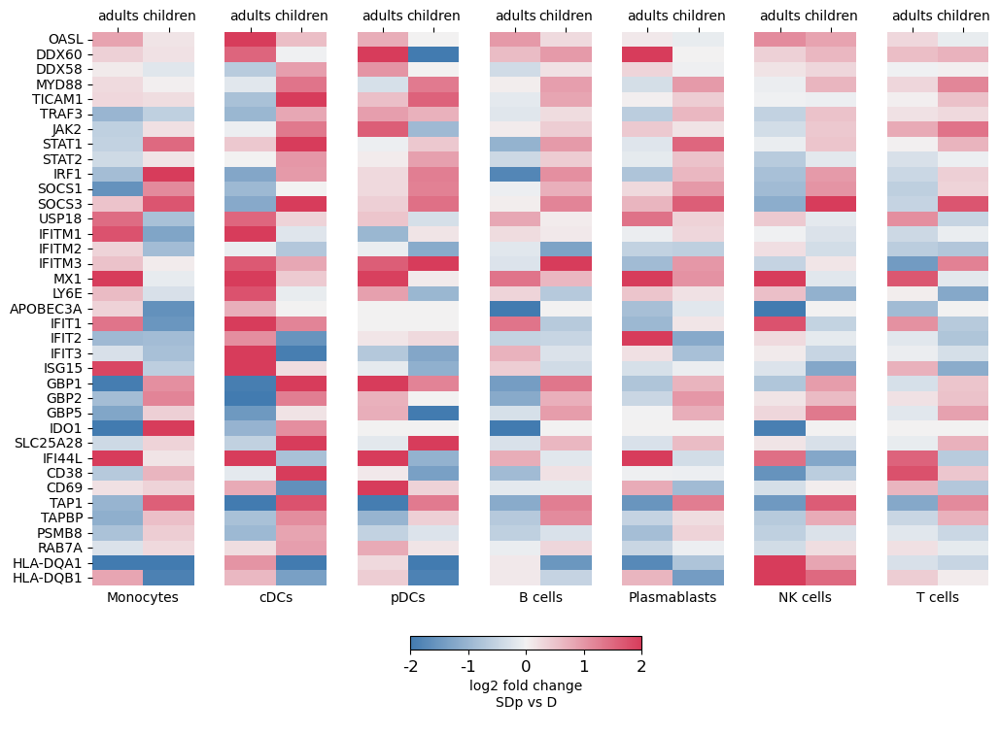

In [24]:
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].index.unique()
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

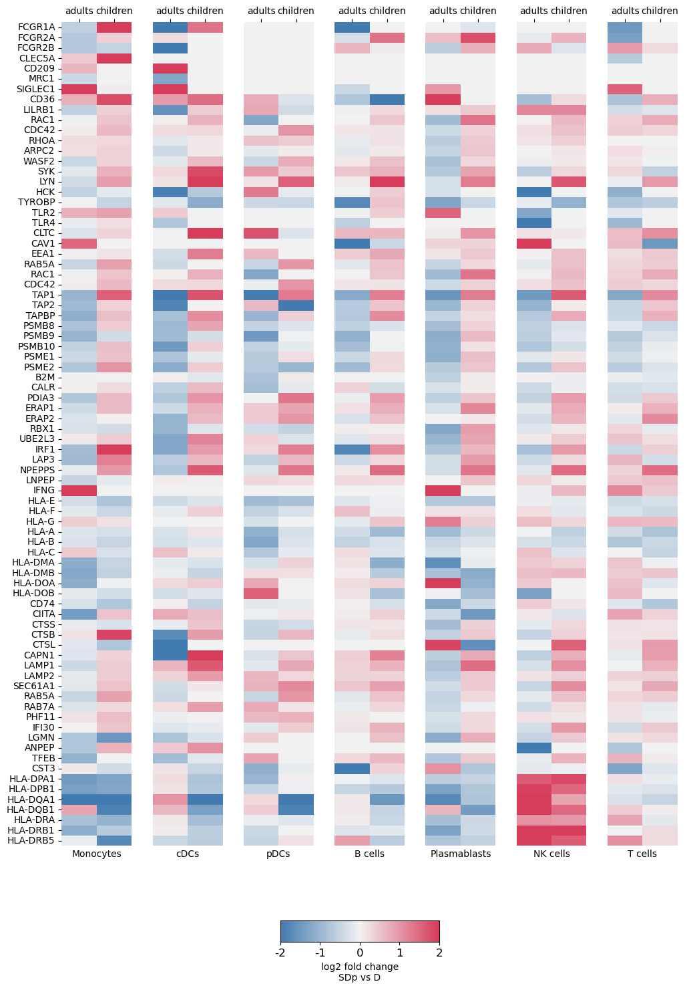

In [53]:
genes_up = [# Receptors for Endocytosis / Phagocytosis
    "FCGR1A", "FCGR2A", "FCGR2B", "CLEC5A", "CD209", "MRC1", "SIGLEC1",
    "CD36", 'LILRB1',
    
    # Actin Cytoskeleton Regulators
    "RAC1", "CDC42", "RHOA", "ARPC2", "WASF2",

    # Adaptor & Signaling Proteins
    "SYK", "LYN", "HCK", "TYROBP", "TLR2", "TLR4",

    # Other / General Vesicular Transport
    "CLTC", "CAV1", "EEA1", "RAB5A",
    
    'RAC1', 'CDC42',
    
    "TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", 
            "PSME1", "PSME2", "B2M",'CALR', "PDIA3", 
    "ERAP1", "ERAP2", 'RBX1', 'UBE2L3', 'IRF1', "LAP3",
    'NPEPPS', "LNPEP", 'IFNG', "HLA-E", "HLA-F", "HLA-G",
            "HLA-A", "HLA-B", "HLA-C", 
            "HLA-DMA", "HLA-DMB", "HLA-DOA", "HLA-DOB", "CD74", 'CIITA',
    'CTSS', 'CTSB', 'CTSL', 'CAPN1', "LAMP1", "LAMP2", 'SEC61A1',
    'RAB5A', 'RAB7A', 'PHF11', "IFI30", "LGMN",
    "ANPEP", "TFEB", "CST3", 
            "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQB1", "HLA-DRA", "HLA-DRB1", "HLA-DRB5", 
           ]
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].index.unique()
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [58]:
all_stats2.loc[['Monocytes', 'cDCs', 'B cells']].reset_index().set_index('gene').loc[genes_up][['cell_type', 'children', 'adults']].to_csv(save_tables+'antigen_presentaiton_fulllist.csv')


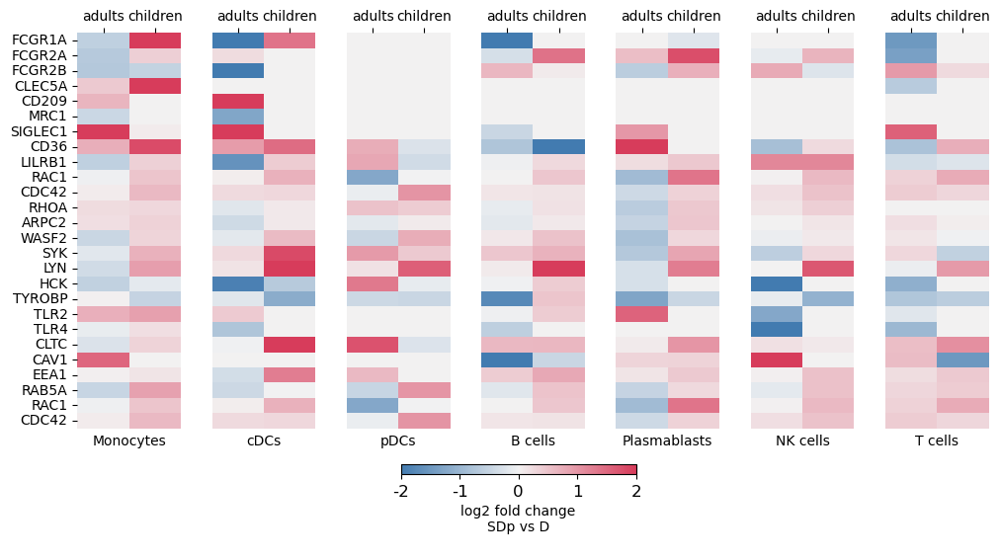

In [49]:
genes_up = [# Receptors for Endocytosis / Phagocytosis
    "FCGR1A", "FCGR2A", "FCGR2B", "CLEC5A", "CD209", "MRC1", "SIGLEC1",
    "CD36", 'LILRB1',
    
    # Actin Cytoskeleton Regulators
    "RAC1", "CDC42", "RHOA", "ARPC2", "WASF2",

    # Adaptor & Signaling Proteins
    "SYK", "LYN", "HCK", "TYROBP", "TLR2", "TLR4",

    # Other / General Vesicular Transport
    "CLTC", "CAV1", "EEA1", "RAB5A",
    
    'RAC1', 'CDC42',           ]
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].index.unique()
#genes_up = all_stats2.reset_index().set_index('gene').loc[genes_up].sort_values(by=['adults', 'children']).index.unique()
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

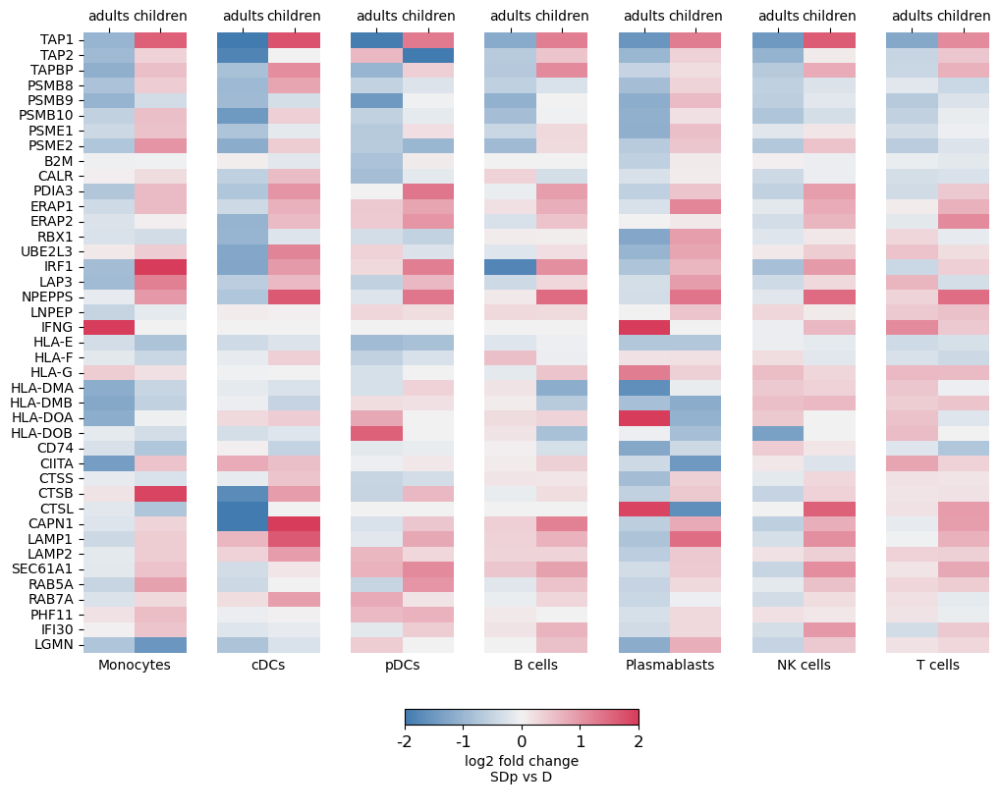

In [51]:
genes_up = ["TAP1", "TAP2", "TAPBP", "PSMB8", "PSMB9", "PSMB10", 
            "PSME1", "PSME2", "B2M",'CALR', "PDIA3", 
    "ERAP1", "ERAP2", 'RBX1', 'UBE2L3', 'IRF1', "LAP3",
    'NPEPPS', "LNPEP", 'IFNG', "HLA-E", "HLA-F", "HLA-G",
            "HLA-DMA", "HLA-DMB", "HLA-DOA", "HLA-DOB", "CD74", 'CIITA',
    'CTSS', 'CTSB', 'CTSL', 'CAPN1', "LAMP1", "LAMP2", 'SEC61A1',
    'RAB5A', 'RAB7A', 'PHF11', "IFI30", "LGMN",
    ]
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

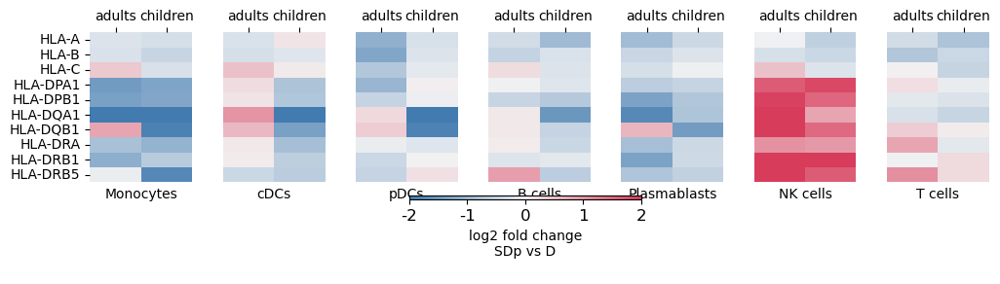

In [52]:
genes_up = ["HLA-A", "HLA-B", "HLA-C", 
    "HLA-DPA1", "HLA-DPB1", "HLA-DQA1", "HLA-DQB1", "HLA-DRA", "HLA-DRB1", "HLA-DRB5", 
]
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes_up,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\n', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [ ]:
fig, ax = heatmaps_from_log2FC(all_stats2, 
                               selected_genes=genes,
                               #selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cbar_label = f'log2 fold change\nSDp vs D\nSignaling', 
                               cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [20]:
'''
Interferome at default settings: Interferome_ISGs_0.txt
Interferome at default settings except only homo sapiens: Interferome_ISGs.txt
Interferome at immune/blood, fc_2: Interferome_ISG_olds.txt

'''
interferome = pd.read_csv(f'{save_tables}Interferome_ISGs_0.txt', header=0, skiprows=19, sep='\t')
interferome['Gene Name'] = [x.upper() for x in interferome['Gene Name'] ]
interferome = interferome[['Inteferome Type', 'Gene Name']].drop_duplicates()
interferome = interferome.sort_values(by='Inteferome Type', ascending=True)
interferome = interferome.set_index('Gene Name')

types = pd.DataFrame([], index=interferome.index.unique(), columns=['Inteferome Type'])
for gene in interferome.index.unique():
    isg_type = interferome['Inteferome Type'][gene]
    if isinstance(isg_type, str): types.loc[gene] = isg_type
    else: types.loc[gene] = ', '.join(interferome['Inteferome Type'][gene])

types.value_counts()

Inteferome Type
I, II              786
I                   70
II                  69
I, II, III          52
dtype: int64

In [9]:
all_stats = all_stats2.reset_index().set_index(['gene']).loc[genes]
all_stats = all_stats.reset_index().set_index(['cell_type', 'gene'])
all_stats['test'] = all_stats['children'] + all_stats['adults']
all_stats = all_stats[all_stats.test!=0]
all_stats

,,children,adults,DEG,r,r2,distance,test
cell_type,gene,,,,,,,
cDCs,APOBEC3D,-6.830921,-1.495075,downregulated_both,6.992619,48.896727,3.773013,-8.325996
Monocytes,APOBEC3D,-0.326829,-0.975755,no,1.029036,1.058915,0.458860,-1.302584
Plasmablasts,APOBEC3D,-0.039796,-0.336236,no,0.338583,0.114638,0.209615,-0.376032
NK cells,APOBEC3D,-0.037387,-0.247705,no,0.250511,0.062756,0.148717,-0.285092
pDCs,APOBEC3D,-0.000000,-4.157846,downregulated_either,4.157846,17.287681,2.940041,-4.157846
...,...,...,...,...,...,...,...,...
Monocytes,TFRC,0.064386,0.222003,no,0.231151,0.053431,0.111452,0.286390
Plasmablasts,TFRC,0.183403,-0.457411,no,0.492810,0.242861,0.453124,-0.274008
NK cells,TFRC,0.422211,0.279742,no,0.506476,0.256518,0.100741,0.701954


In [10]:
types = types.loc[[x for x in types.index if x in all_stats.reset_index().gene.unique()]]
types

,Inteferome Type
Gene Name,
LY6E,"I, II"
NADK,"I, II"
N4BP2L1,"I, II"
N4BP1,"I, II"
MYOF,"I, II"
...,...
PAOX,II
METTL4,II
MIIP,II


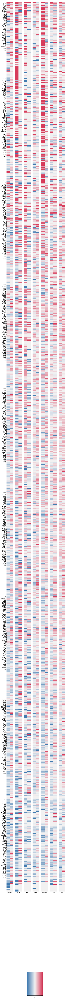

In [11]:
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=all_stats.sort_values(by='adults', ascending=False).reset_index().gene.unique(), 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

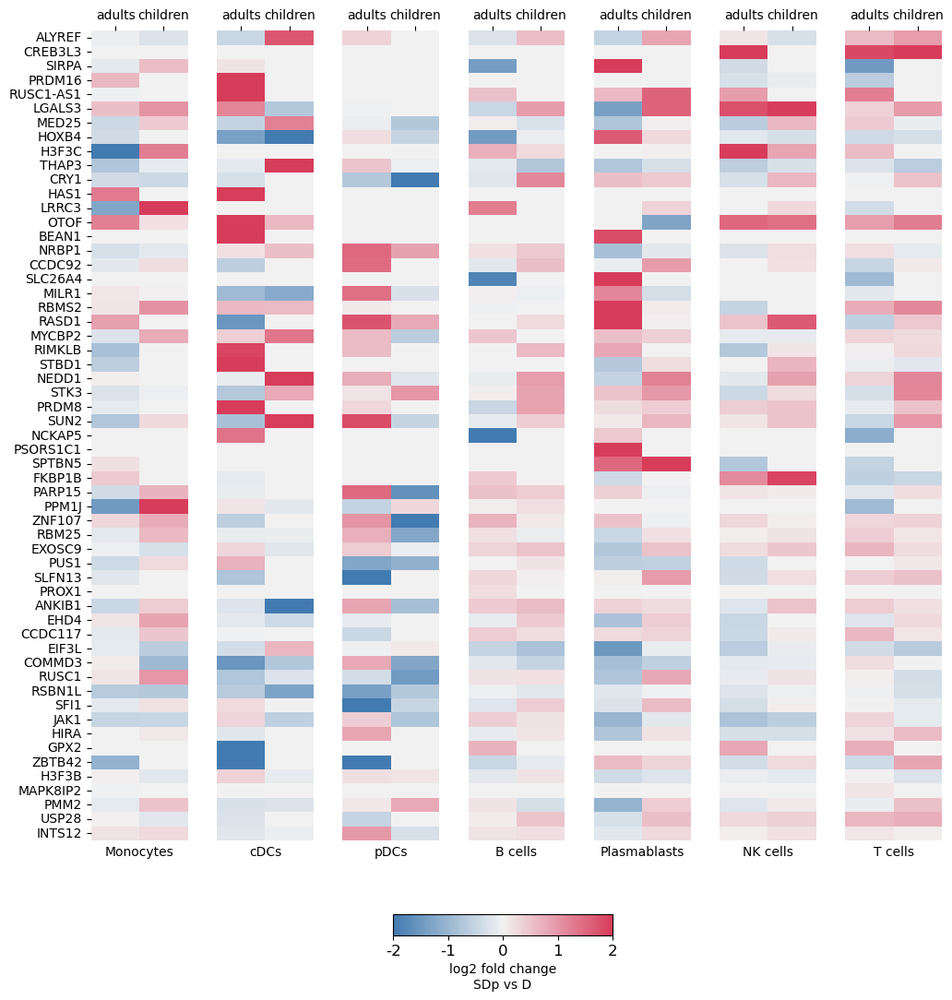

In [12]:
genes = types[types['Inteferome Type']=='I'].index
genes = all_stats.reset_index().set_index('gene').loc[genes].sort_values(by='DEG', ascending=False).index.unique()

fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

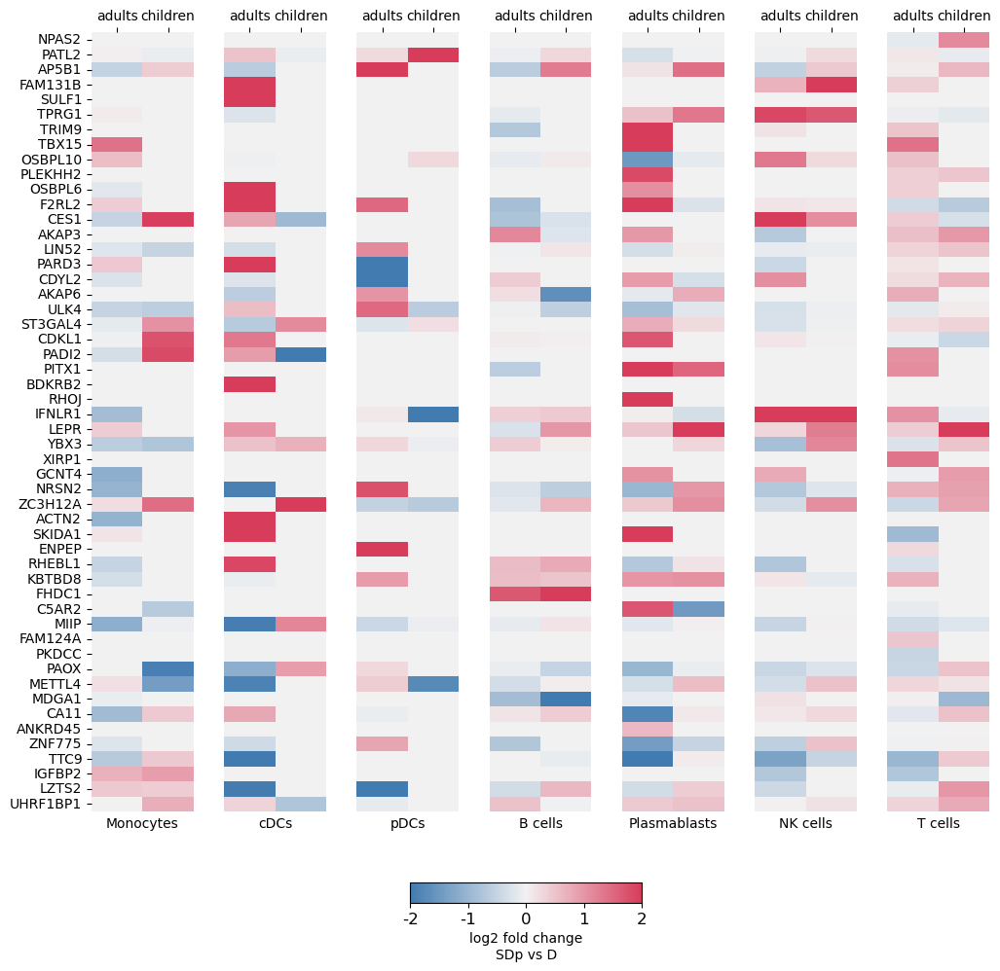

In [13]:
genes = types[types['Inteferome Type']=='II'].index
genes = all_stats.reset_index().set_index('gene').loc[genes].sort_values(by='DEG', ascending=False).index.unique()

fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

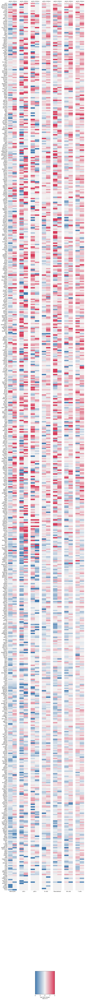

In [14]:
genes = types[types['Inteferome Type']=='I, II'].index
genes = all_stats.reset_index().set_index('gene').loc[genes].sort_values(by='DEG', ascending=False).index.unique()

fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

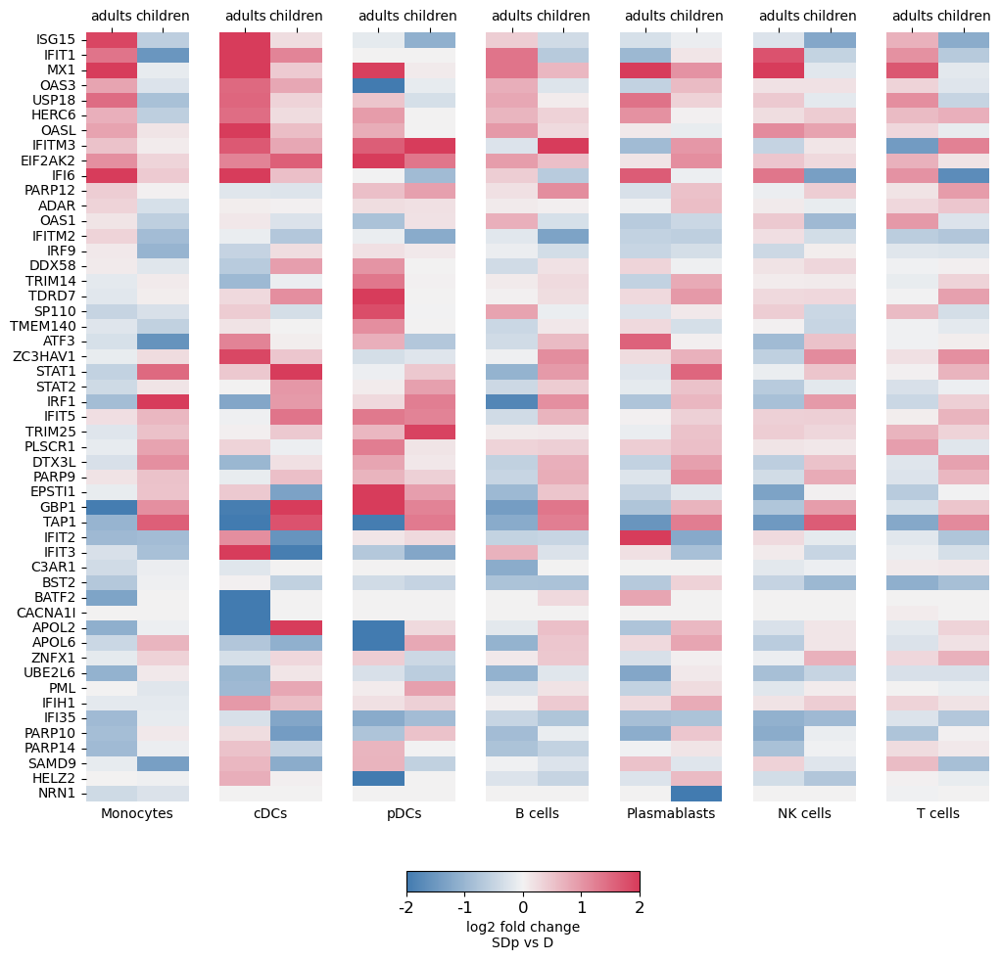

In [15]:
genes = types[types['Inteferome Type']=='I, II, III'].index
genes = all_stats.reset_index().set_index('gene').loc[genes].sort_values(by='DEG', ascending=False).index.unique()

genes = ['ISG15', 'IFIT1', 'MX1', 'OAS3', 'USP18', 'HERC6','OASL','IFITM3', 'EIF2AK2', 'IFI6', 'PARP12',    
         'ADAR', 'OAS1', 'IFITM2', 'IRF9','DDX58', 'TRIM14', 'TDRD7', 'SP110', 'TMEM140', 'ATF3', 'ZC3HAV1',
         'STAT1', 'STAT2',  'IRF1', 'IFIT5', 'TRIM25', 'PLSCR1', 'DTX3L', 'PARP9', 'EPSTI1', 'GBP1', 'TAP1', 
       'IFIT2', 'IFIT3', 'C3AR1', 'BST2', 'BATF2', 'CACNA1I', 'APOL2','APOL6', 'ZNFX1', 'UBE2L6', 
       'PML',  'IFIH1', 'IFI35',  'PARP10', 'PARP14', 'SAMD9', 'HELZ2', 'NRN1', ]

fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, 
                               cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [16]:
selected_genes = all_stats.reset_index().gene.unique()
len(selected_genes)

898

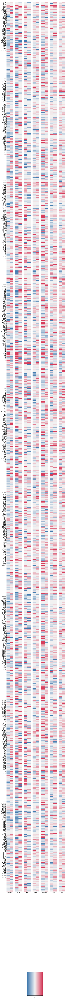

In [37]:
selected_genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2.sort_values(by='adults'), selected_genes=selected_genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [18]:
import gseapy as gp
from gseapy import barplot, dotplot

gp.get_library_name(organism='Human')


['ARCHS4_Cell-lines',
 'ARCHS4_IDG_Coexp',
 'ARCHS4_Kinases_Coexp',
 'ARCHS4_TFs_Coexp',
 'ARCHS4_Tissues',
 'Achilles_fitness_decrease',
 'Achilles_fitness_increase',
 'Aging_Perturbations_from_GEO_down',
 'Aging_Perturbations_from_GEO_up',
 'Allen_Brain_Atlas_10x_scRNA_2021',
 'Allen_Brain_Atlas_down',
 'Allen_Brain_Atlas_up',
 'Azimuth_2023',
 'Azimuth_Cell_Types_2021',
 'BioCarta_2013',
 'BioCarta_2015',
 'BioCarta_2016',
 'BioPlanet_2019',
 'BioPlex_2017',
 'CCLE_Proteomics_2020',
 'CORUM',
 'COVID-19_Related_Gene_Sets',
 'COVID-19_Related_Gene_Sets_2021',
 'Cancer_Cell_Line_Encyclopedia',
 'CellMarker_2024',
 'CellMarker_Augmented_2021',
 'ChEA_2013',
 'ChEA_2015',
 'ChEA_2016',
 'ChEA_2022',
 'Chromosome_Location',
 'Chromosome_Location_hg19',
 'ClinVar_2019',
 'DGIdb_Drug_Targets_2024',
 'DSigDB',
 'Data_Acquisition_Method_Most_Popular_Genes',
 'DepMap_CRISPR_GeneDependency_CellLines_2023',
 'DepMap_WG_CRISPR_Screens_Broad_CellLines_2019',
 'DepMap_WG_CRISPR_Screens_Sanger_Cell

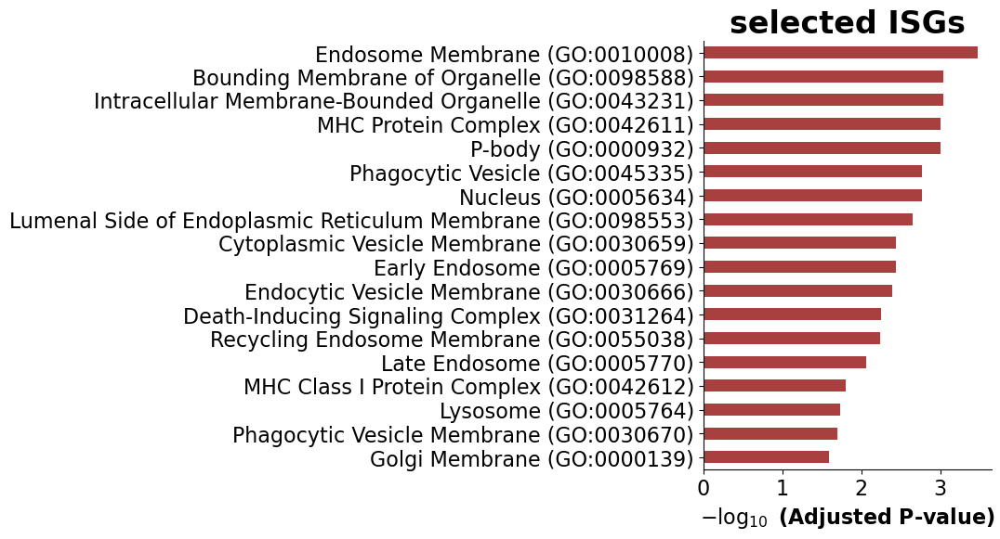

In [31]:
enriched_GO_2021 = gp.enrichr(gene_list=list(selected_genes),
                     gene_sets=['GO_Cellular_Component_2025', 
                                #'GO_Biological_Process_2023', 
                               #'MSigDB_Hallmark_2020', 
                                #'KEGG_2021_Human', 
                               ],
                     cutoff = 0.5)
ax = barplot(enriched_GO_2021.res2d,title=f'selected ISGs', 
             figsize=(4, 6), 
             top_term=50,
             color='darkred')
plt.show()

In [104]:
enriched_GO_2021.results

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Cellular_Component_2025,Endosome Membrane (GO:0010008),40/392,0.000001,0.000335,0,0,2.483312,33.832896,RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;...
1,GO_Cellular_Component_2025,Bounding Membrane of Organelle (GO:0098588),68/881,0.000009,0.000902,0,0,1.843021,21.356894,SCARB2;RET;PI4K2B;PLEKHF1;STEAP4;TFRC;ANTXR2;P...
2,GO_Cellular_Component_2025,Intracellular Membrane-Bounded Organelle (GO:0...,309/5597,0.000010,0.000902,0,0,1.370475,15.810454,ZNF296;TFRC;MT1M;RTCB;AQP9;TESK2;UBE2L6;MT1X;I...
3,GO_Cellular_Component_2025,MHC Protein Complex (GO:0042611),7/20,0.000017,0.000998,0,0,11.536131,126.926431,CD74;HLA-DMB;HLA-B;HLA-C;HLA-F;HLA-DOB;HLA-E
4,GO_Cellular_Component_2025,P-body (GO:0000932),14/83,0.000018,0.000998,0,0,4.368516,47.723016,APOBEC3D;APOBEC3F;APOBEC3G;SAMD4A;PATL1;PNRC1;...
...,...,...,...,...,...,...,...,...,...,...
272,GO_Cellular_Component_2025,cullin-RING Ubiquitin Ligase Complex (GO:0031461),5/219,0.970770,0.984773,0,0,0.494186,0.014660,SOCS2;SPSB1;FBXO6;TRIM21;KBTBD8
273,GO_Cellular_Component_2025,Cilium (GO:0005929),11/402,0.974108,0.984773,0,0,0.593457,0.015568,MARCKS;AKT3;PMM2;MYOF;P2RY1;KIAA1671;PKD1L1;PR...
274,GO_Cellular_Component_2025,Motile Cilium (GO:0031514),1/85,0.980022,0.987150,0,0,0.252402,0.005093,PRKD2
275,GO_Cellular_Component_2025,Mitochondrial Matrix (GO:0005759),10/407,0.988850,0.992432,0,0,0.530584,0.005949,NDUFA9;ARG2;PNPT1;MMAA;PUS1;MTHFD2L;METTL4;PPM...


In [36]:
len(selected_genes)

898

In [53]:
genes = []
for g in enriched_GO_2021.results.Genes:
#for g in enriched_Hallmark.results[enriched_Hallmark.results['Adjusted P-value'] < 0.05].Genes:
    for gene in g.split(';'): 
        if gene not in genes: 
            if gene == 'C15ORF48': genes.append('C15orf48')
            elif gene == 'C3ORF38': genes.append('C3orf38')
            elif gene =='C19ORF12': genes.append('C19orf12')
            else: genes.append(gene)
len(genes)

594

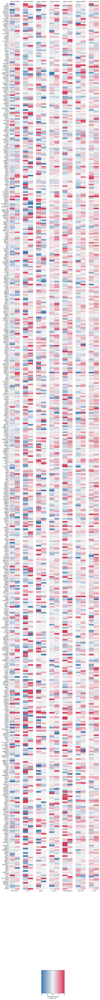

In [54]:
fig, ax = heatmaps_from_log2FC(all_stats2.sort_values(by='adults'), selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True))

In [56]:
df = enriched_GO_2021.results
for i, x in enumerate(df.Term.unique()):
    print(df.Term[i])
    print(df.Genes[i])

Endosome Membrane (GO:0010008)
RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;IFITM2;STEAP4;TFRC;ANTXR2;RAB43;HLA-DMB;LAMP3;MVB12B;ANKFY1;RIPK1;SLC15A3;FCGR1A;LDLR;HLA-DOB;B2M;RAB8B;OSBPL6;FZD5;SLC30A4;HLA-B;HLA-C;TICAM1;HLA-F;HLA-G;HLA-E;EHD4;IRF7;RHOU;CD68;TLR4;OPTN;MYD88;TLR3
Bounding Membrane of Organelle (GO:0098588)
SCARB2;RET;PI4K2B;PLEKHF1;STEAP4;TFRC;ANTXR2;PYCARD;LGALS3;CREB3L3;GLIPR2;ZC3H12A;ANKFY1;B2M;RAB8B;GBP5;SLC30A4;HLA-B;PLA2G4A;HLA-C;TICAM1;HLA-F;HLA-G;TNFRSF1A;TAPBP;HLA-E;IRF7;B3GNT2;RHOU;SLC18B1;TLR4;OPTN;BLZF1;TLR3;TLR2;B4GALT5;CAMK2D;NOTCH1;STX17;UNC93B1;MYCBP2;GCNT1;PKD1L1;FUT4;CACNG8;CHST12;MVB12B;RAB24;ST3GAL4;GCNT4;RIPK1;CHSY3;WHAMM;SLC15A3;GBP2;LDLR;CYTH1;B3GALNT1;MSR1;CD74;CD163;GALNT3;GALNT2;AZIN2;EXT1;FKBP1B;CD9;MYD88
Intracellular Membrane-Bounded Organelle (GO:0043231)
ZNF296;TFRC;MT1M;RTCB;AQP9;TESK2;UBE2L6;MT1X;IFI35;ADARB1;IFI30;LGALS3;MT2A;RPS6KA5;CREB3L3;GPBP1;ZC3H12A;SAP130;ANKFY1;BBX;CYP1B1;TRIM26;LGALS9;CCDC92;TRIM21;TRIM22;IER2;IL15RA;MEF2C;TIPIN

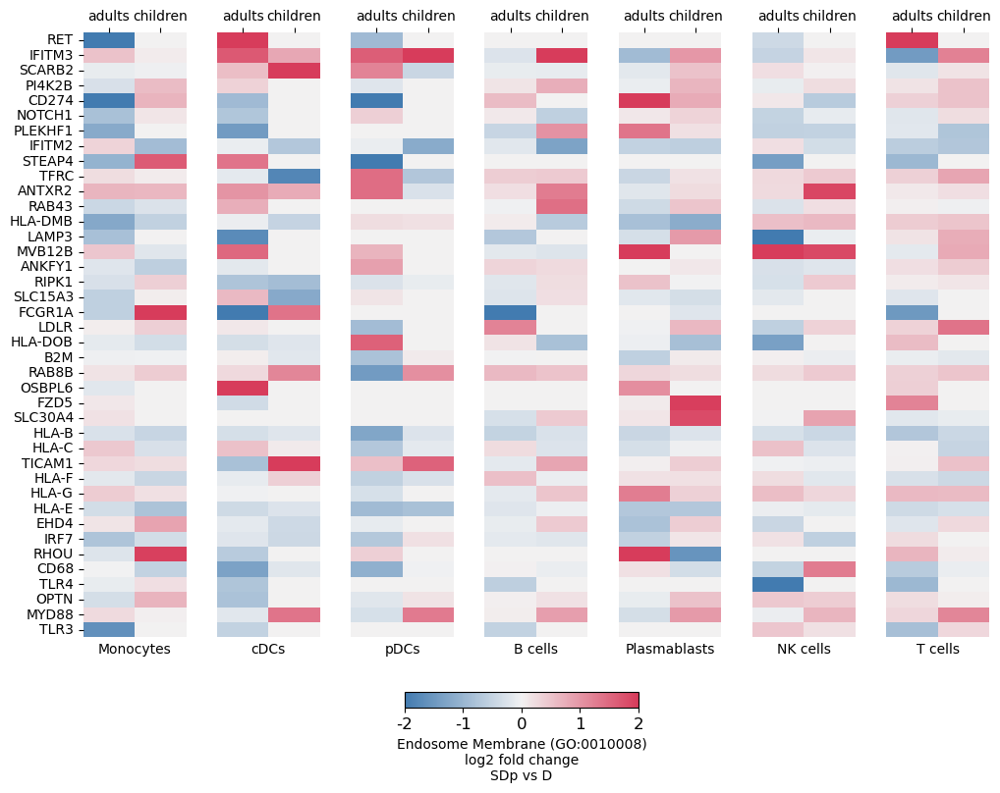

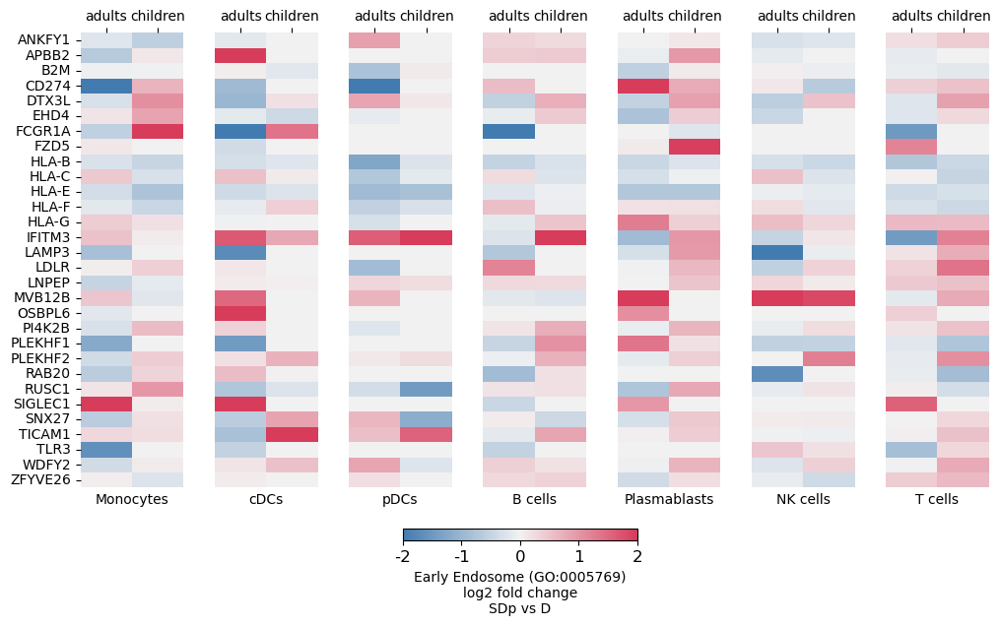

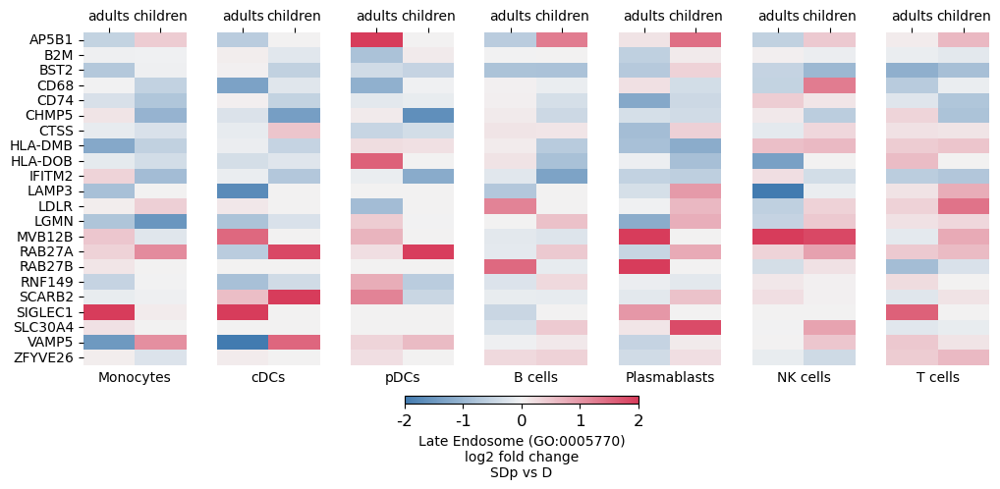

In [118]:
i=0
genes = df.Genes[i].split(';')
fig, ax = heatmaps_from_log2FC(all_stats2.sort_values(by='adults'), selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=8
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=13
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


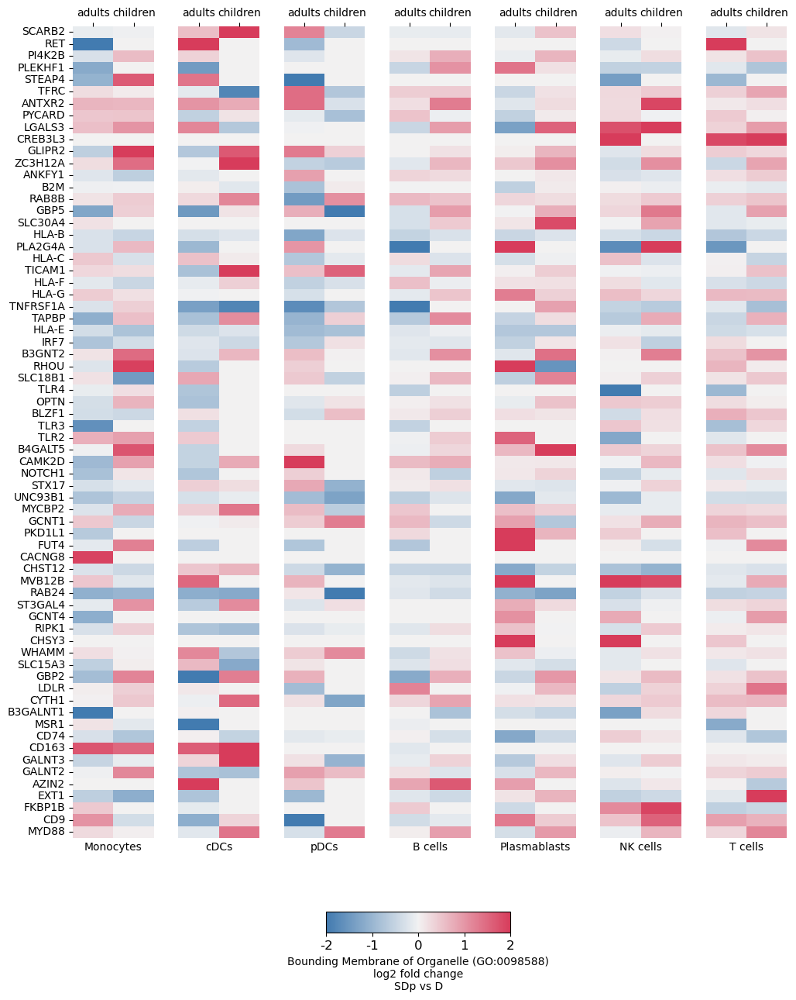

In [64]:
i=1
genes = df.Genes[i].split(';')
fig, ax = heatmaps_from_log2FC(all_stats2.sort_values(by='adults'), selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

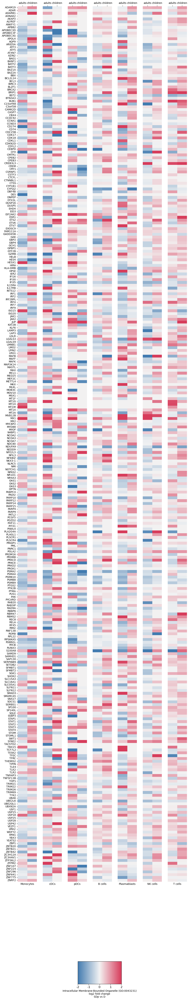

In [77]:
i=2
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

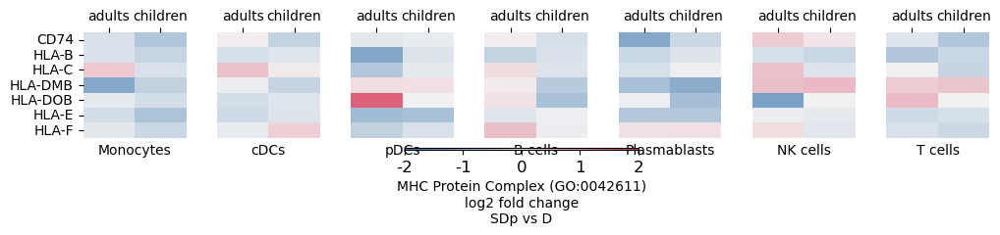

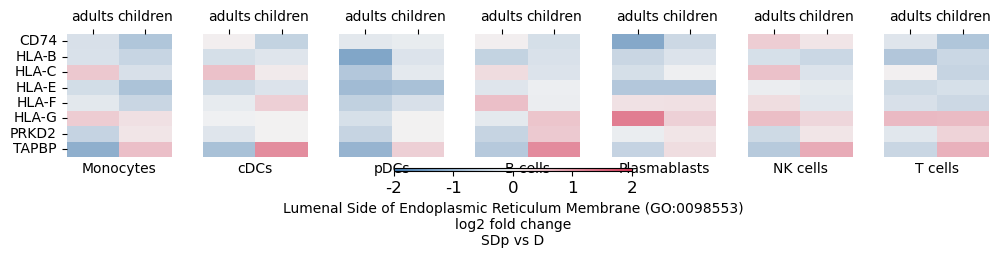

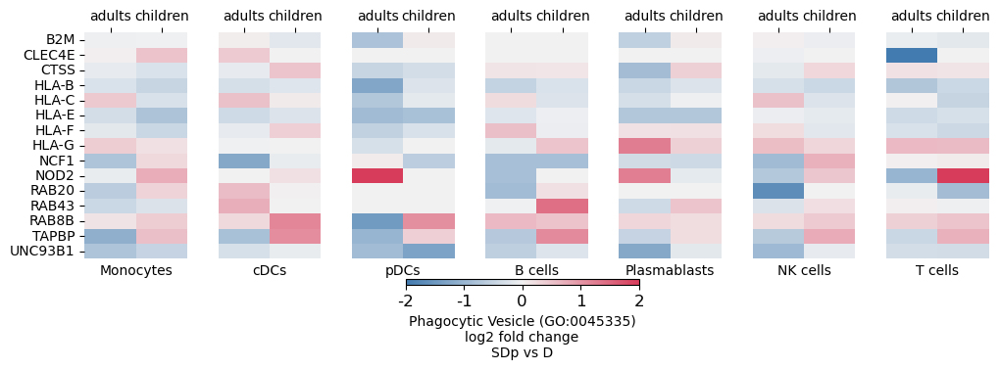

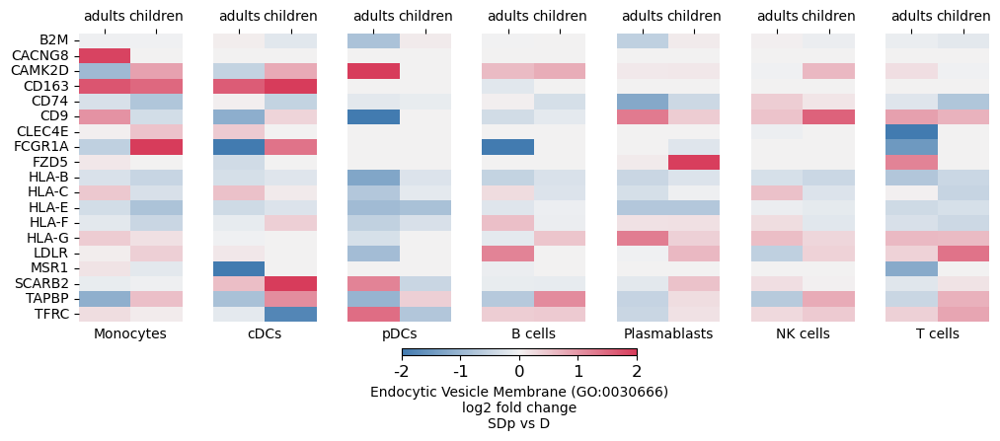

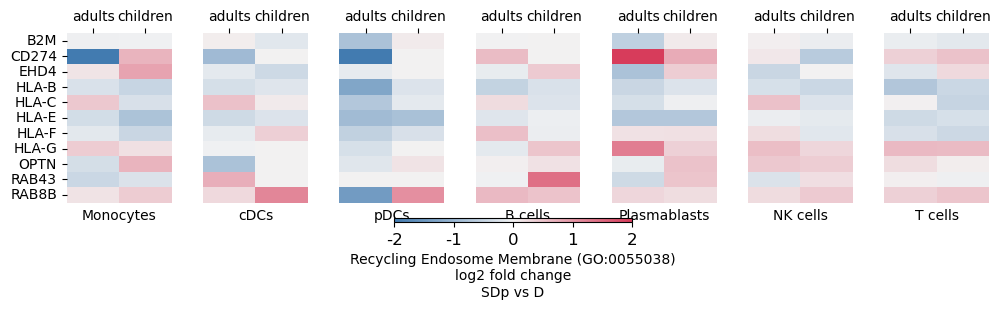

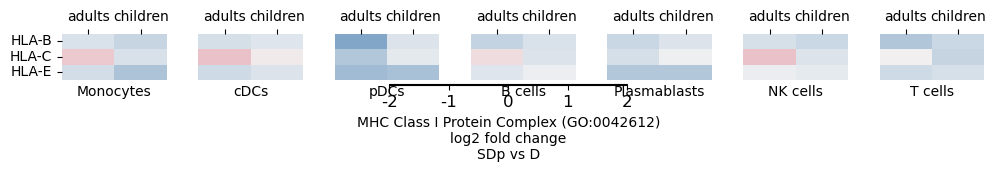

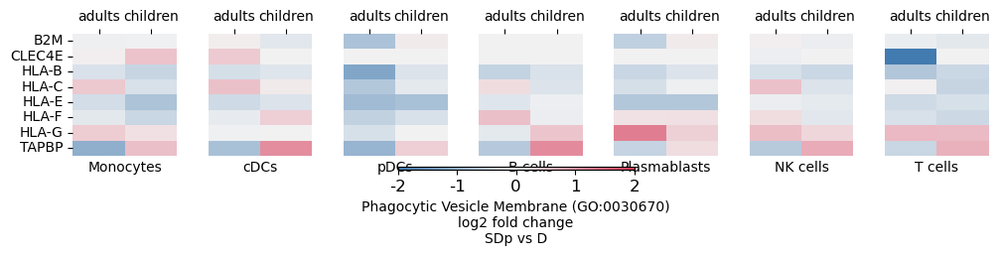

In [96]:
i=3
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=7
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')
i=5
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=10
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=12
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=14
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

i=16
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


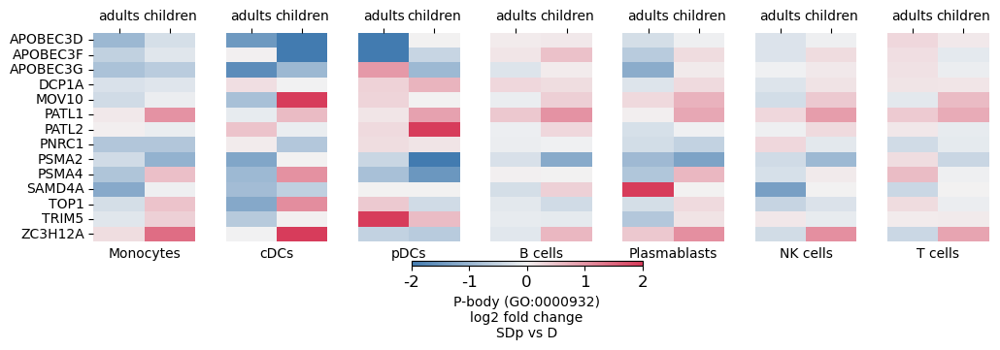

In [79]:
i=4
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

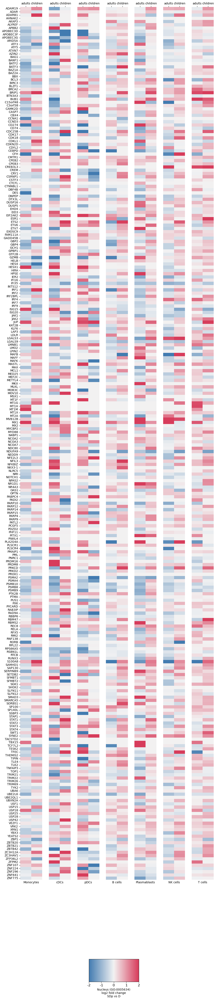

In [81]:
i=6
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

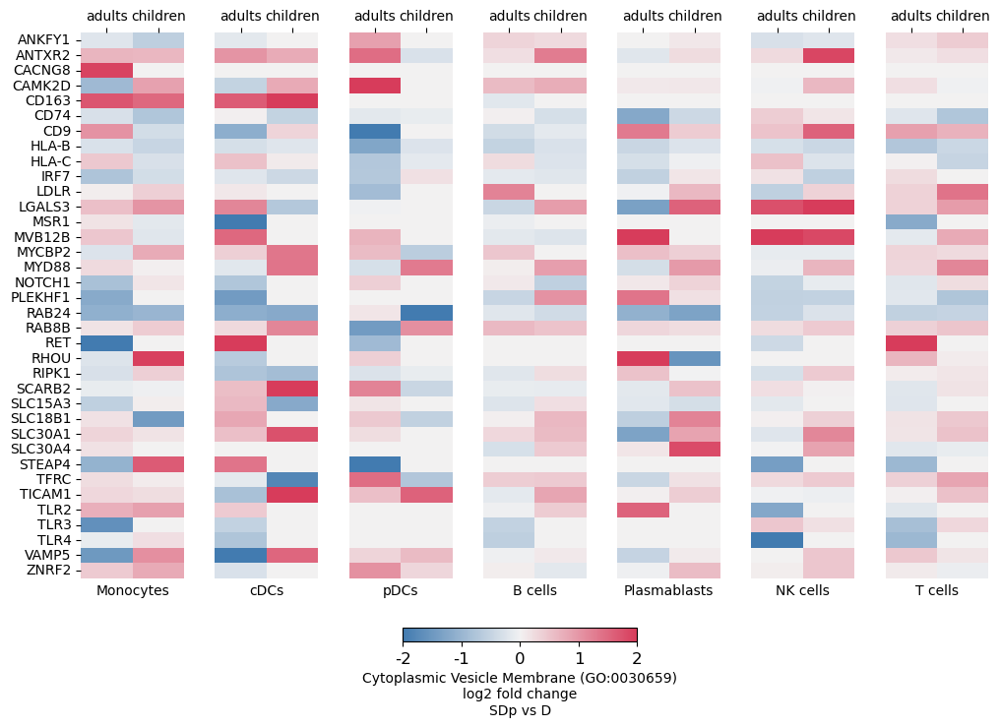

In [85]:
i=9
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


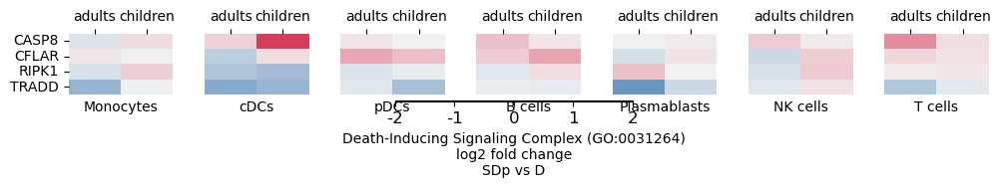

In [88]:
i=11
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


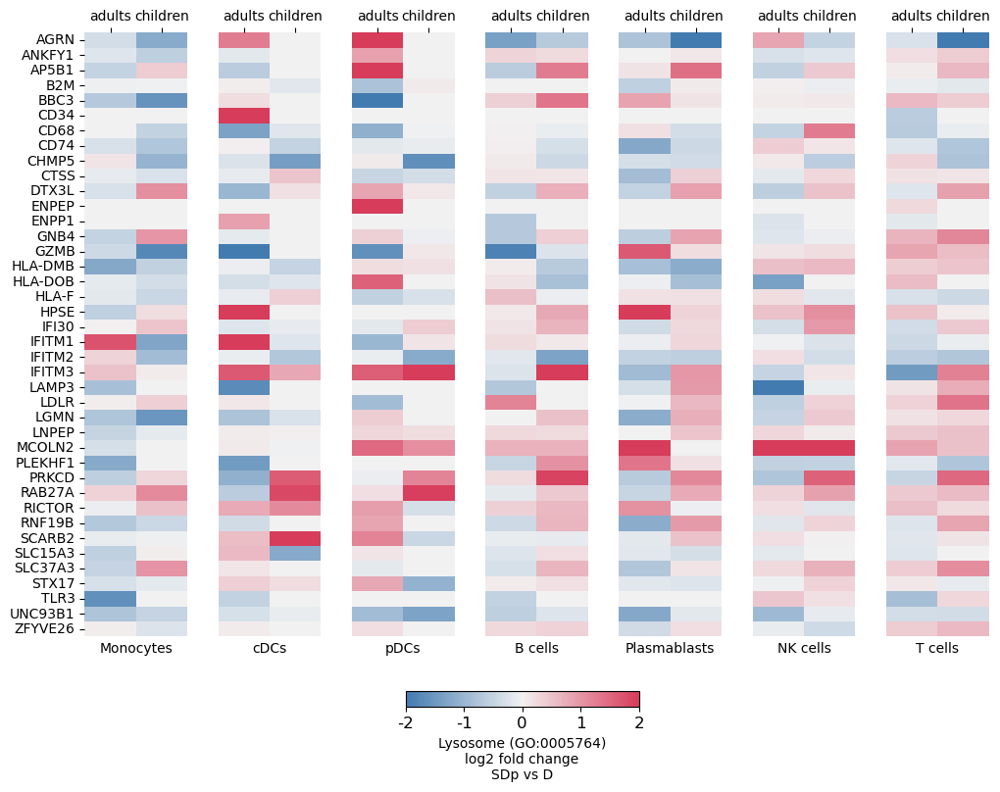

In [93]:
i=15
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


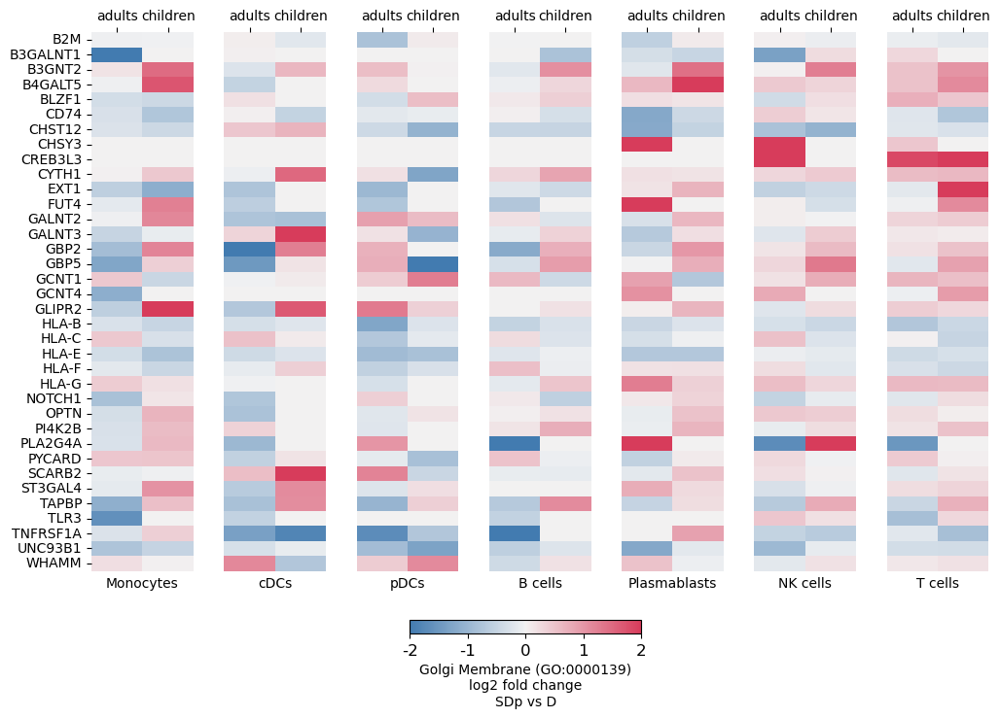

In [95]:
i=17
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


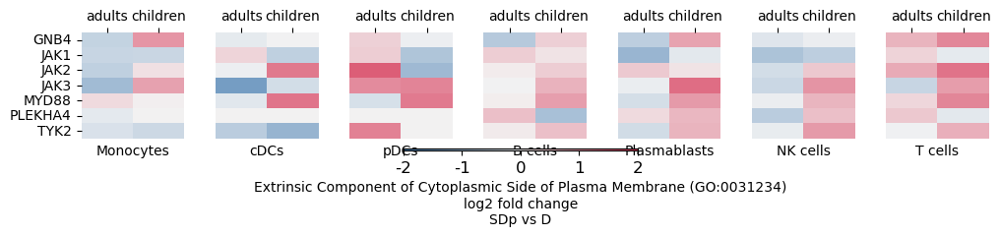

In [97]:
i=18
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')

"""
myd88  downstream of TLR recognition. endosomal compartment
activates ISGs through IRF5/IRF7. 
Up in adults and down in children
JAK/TYK2 on the membrane (inside) activated through IFNAR and activated more ISGs. Need IFNA signal coming from outside.
Down in adults and up in children (only JAK2/3)
"""

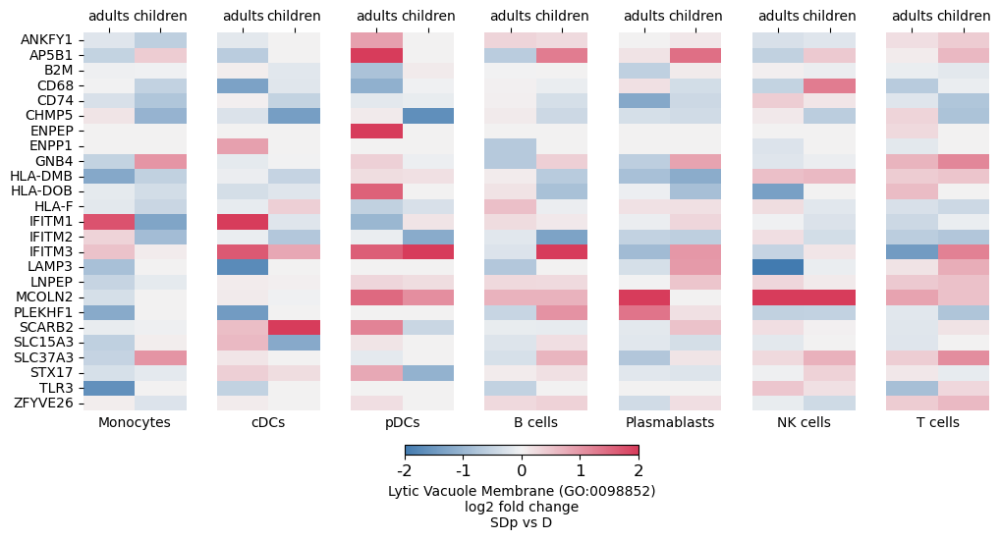

In [102]:
i=19
genes = df.Genes[i].split(';')
genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
genes.sort()
fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


In [117]:
df.head(20)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,n_genes
0,GO_Cellular_Component_2025,Endosome Membrane (GO:0010008),40/392,0.000001,0.000335,0,0,2.483312,33.832896,RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;...,40
1,GO_Cellular_Component_2025,Bounding Membrane of Organelle (GO:0098588),68/881,0.000009,0.000902,0,0,1.843021,21.356894,SCARB2;RET;PI4K2B;PLEKHF1;STEAP4;TFRC;ANTXR2;P...,68
2,GO_Cellular_Component_2025,Intracellular Membrane-Bounded Organelle (GO:0...,309/5597,0.000010,0.000902,0,0,1.370475,15.810454,ZNF296;TFRC;MT1M;RTCB;AQP9;TESK2;UBE2L6;MT1X;I...,309
3,GO_Cellular_Component_2025,MHC Protein Complex (GO:0042611),7/20,0.000017,0.000998,0,0,11.536131,126.926431,CD74;HLA-DMB;HLA-B;HLA-C;HLA-F;HLA-DOB;HLA-E,7
4,GO_Cellular_Component_2025,P-body (GO:0000932),14/83,0.000018,0.000998,0,0,4.368516,47.723016,APOBEC3D;APOBEC3F;APOBEC3G;SAMD4A;PATL1;PNRC1;...,14
5,GO_Cellular_Component_2025,Phagocytic Vesicle (GO:0045335),15/100,0.000039,0.001702,0,0,3.800613,38.620672,NCF1;UNC93B1;HLA-B;HLA-C;NOD2;HLA-F;HLA-G;CTSS...,15
6,GO_Cellular_Component_2025,Nucleus (GO:0005634),270/4879,0.000043,0.001702,0,0,1.351935,13.592357,ZNF296;MT1M;RTCB;TESK2;UBE2L6;MT1X;IFI35;ADARB...,270
7,GO_Cellular_Component_2025,Lumenal Side of Endoplasmic Reticulum Membrane...,8/32,0.000064,0.002228,0,0,7.145318,68.960864,CD74;HLA-B;HLA-C;PRKD2;HLA-F;HLA-G;HLA-E;TAPBP,8
8,GO_Cellular_Component_2025,Early Endosome (GO:0005769),30/320,0.000121,0.003633,0,0,2.242015,20.213889,IFITM3;PLEKHF2;PI4K2B;CD274;PLEKHF1;ZFYVE26;RA...,30
9,GO_Cellular_Component_2025,Cytoplasmic Vesicle Membrane (GO:0030659),36/415,0.000131,0.003633,0,0,2.063153,18.442993,RET;SCARB2;CAMK2D;NOTCH1;PLEKHF1;STEAP4;TFRC;M...,36


In [115]:
df['n_genes'] = [x.split('/')[0] for x in df.Overlap]
df['n_genes'] = df['n_genes'].astype(int)
df

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,n_genes
0,GO_Cellular_Component_2025,Endosome Membrane (GO:0010008),40/392,0.000001,0.000335,0,0,2.483312,33.832896,RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;...,40
1,GO_Cellular_Component_2025,Bounding Membrane of Organelle (GO:0098588),68/881,0.000009,0.000902,0,0,1.843021,21.356894,SCARB2;RET;PI4K2B;PLEKHF1;STEAP4;TFRC;ANTXR2;P...,68
2,GO_Cellular_Component_2025,Intracellular Membrane-Bounded Organelle (GO:0...,309/5597,0.000010,0.000902,0,0,1.370475,15.810454,ZNF296;TFRC;MT1M;RTCB;AQP9;TESK2;UBE2L6;MT1X;I...,309
3,GO_Cellular_Component_2025,MHC Protein Complex (GO:0042611),7/20,0.000017,0.000998,0,0,11.536131,126.926431,CD74;HLA-DMB;HLA-B;HLA-C;HLA-F;HLA-DOB;HLA-E,7
4,GO_Cellular_Component_2025,P-body (GO:0000932),14/83,0.000018,0.000998,0,0,4.368516,47.723016,APOBEC3D;APOBEC3F;APOBEC3G;SAMD4A;PATL1;PNRC1;...,14
...,...,...,...,...,...,...,...,...,...,...,...
272,GO_Cellular_Component_2025,cullin-RING Ubiquitin Ligase Complex (GO:0031461),5/219,0.970770,0.984773,0,0,0.494186,0.014660,SOCS2;SPSB1;FBXO6;TRIM21;KBTBD8,5
273,GO_Cellular_Component_2025,Cilium (GO:0005929),11/402,0.974108,0.984773,0,0,0.593457,0.015568,MARCKS;AKT3;PMM2;MYOF;P2RY1;KIAA1671;PKD1L1;PR...,11
274,GO_Cellular_Component_2025,Motile Cilium (GO:0031514),1/85,0.980022,0.987150,0,0,0.252402,0.005093,PRKD2,1
275,GO_Cellular_Component_2025,Mitochondrial Matrix (GO:0005759),10/407,0.988850,0.992432,0,0,0.530584,0.005949,NDUFA9;ARG2;PNPT1;MMAA;PUS1;MTHFD2L;METTL4;PPM...,10


In [116]:
df.sort_values(by='n_genes', ascending=False).head(20)


,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes,n_genes
2,GO_Cellular_Component_2025,Intracellular Membrane-Bounded Organelle (GO:0...,309/5597,0.000010,0.000902,0,0,1.370475,15.810454,ZNF296;TFRC;MT1M;RTCB;AQP9;TESK2;UBE2L6;MT1X;I...,309
6,GO_Cellular_Component_2025,Nucleus (GO:0005634),270/4879,0.000043,0.001702,0,0,1.351935,13.592357,ZNF296;MT1M;RTCB;TESK2;UBE2L6;MT1X;IFI35;ADARB...,270
1,GO_Cellular_Component_2025,Bounding Membrane of Organelle (GO:0098588),68/881,0.000009,0.000902,0,0,1.843021,21.356894,SCARB2;RET;PI4K2B;PLEKHF1;STEAP4;TFRC;ANTXR2;P...,68
187,GO_Cellular_Component_2025,Intracellular Membraneless Organelle (GO:0043232),59/1310,0.510291,0.739508,0,0,1.003449,0.675094,GTF2B;GIMAP2;ADAR;IFI35;ADARB1;STON2;OASL;PYCA...,59
72,GO_Cellular_Component_2025,Endoplasmic Reticulum Membrane (GO:0005789),47/872,0.111505,0.423107,0,0,1.223543,2.684072,SCARB2;PI4K2B;PGAP1;NOTCH1;STX17;UNC93B1;PTGS2...,47
0,GO_Cellular_Component_2025,Endosome Membrane (GO:0010008),40/392,0.000001,0.000335,0,0,2.483312,33.832896,RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;...,40
15,GO_Cellular_Component_2025,Lysosome (GO:0005764),40/532,0.001053,0.018223,0,0,1.763413,12.090862,IFITM3;SCARB2;ENPEP;IFITM1;PLEKHF1;IFITM2;STX1...,40
227,GO_Cellular_Component_2025,Intracellular Organelle Lumen (GO:0070013),39/912,0.648624,0.788021,0,0,0.948026,0.410402,TNFAIP6;CSF1;FGL2;DEFB1;PPM1K;PTGS2;TSPAN33;CT...,39
85,GO_Cellular_Component_2025,Cytoskeleton (GO:0005856),37/694,0.159290,0.512500,0,0,1.206457,2.216298,CD274;FLT1;KIAA1671;IFIT5;NOD2;DDX60;SYNE2;LIM...,37
180,GO_Cellular_Component_2025,Nuclear Lumen (GO:0031981),37/814,0.493706,0.737812,0,0,1.013495,0.715340,FYTTD1;SP100;BAZ2A;ADAR;IFI35;ADARB1;STON2;REL...,37


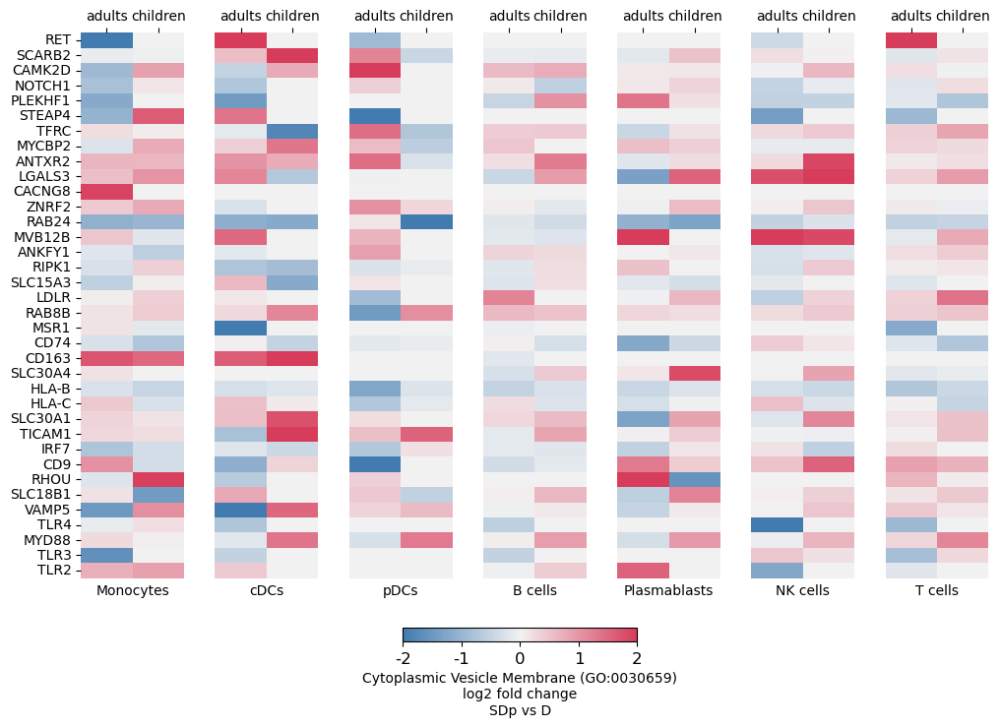

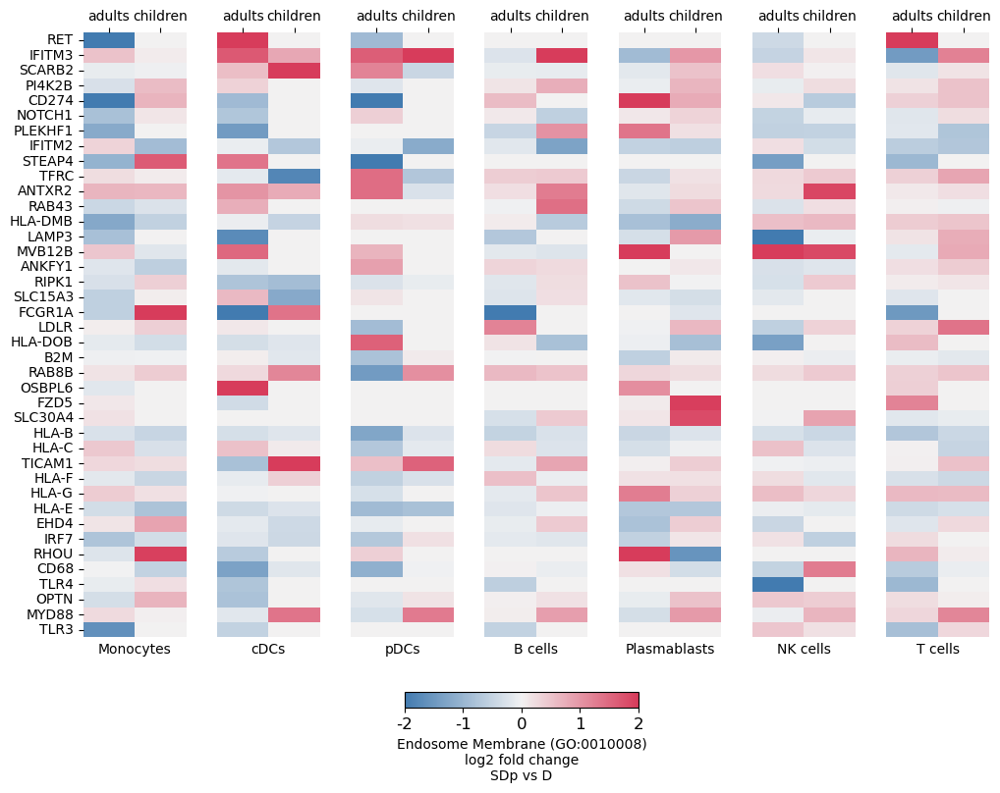

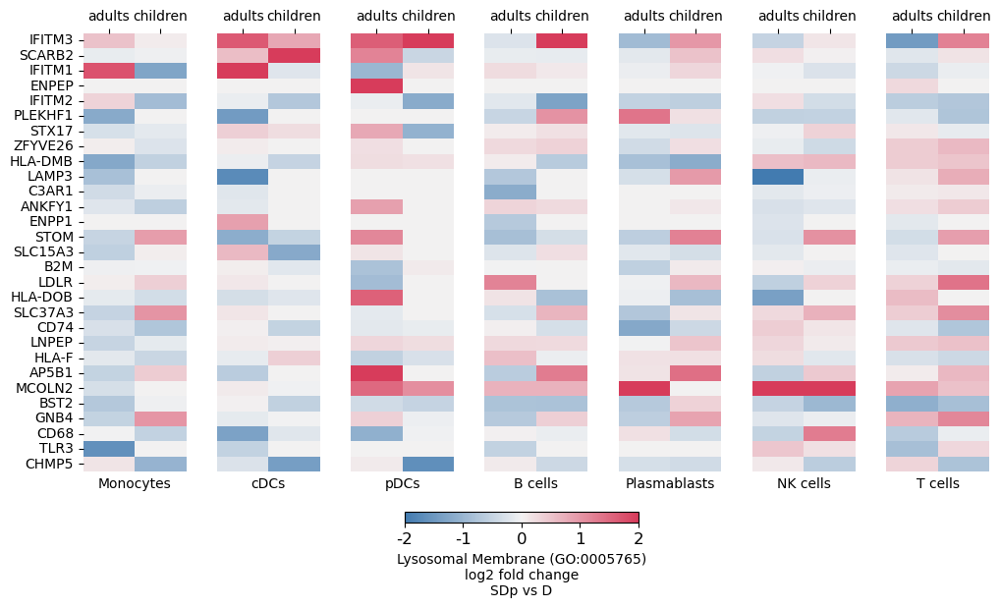

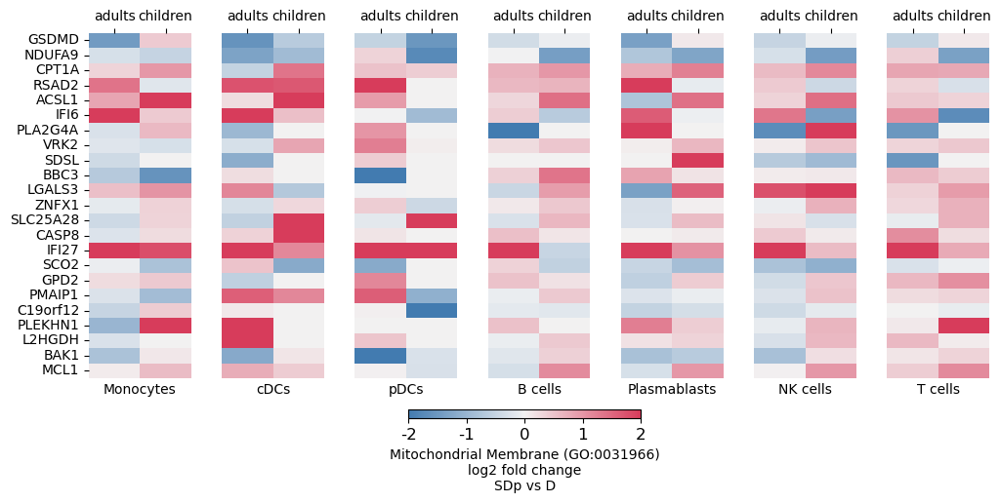

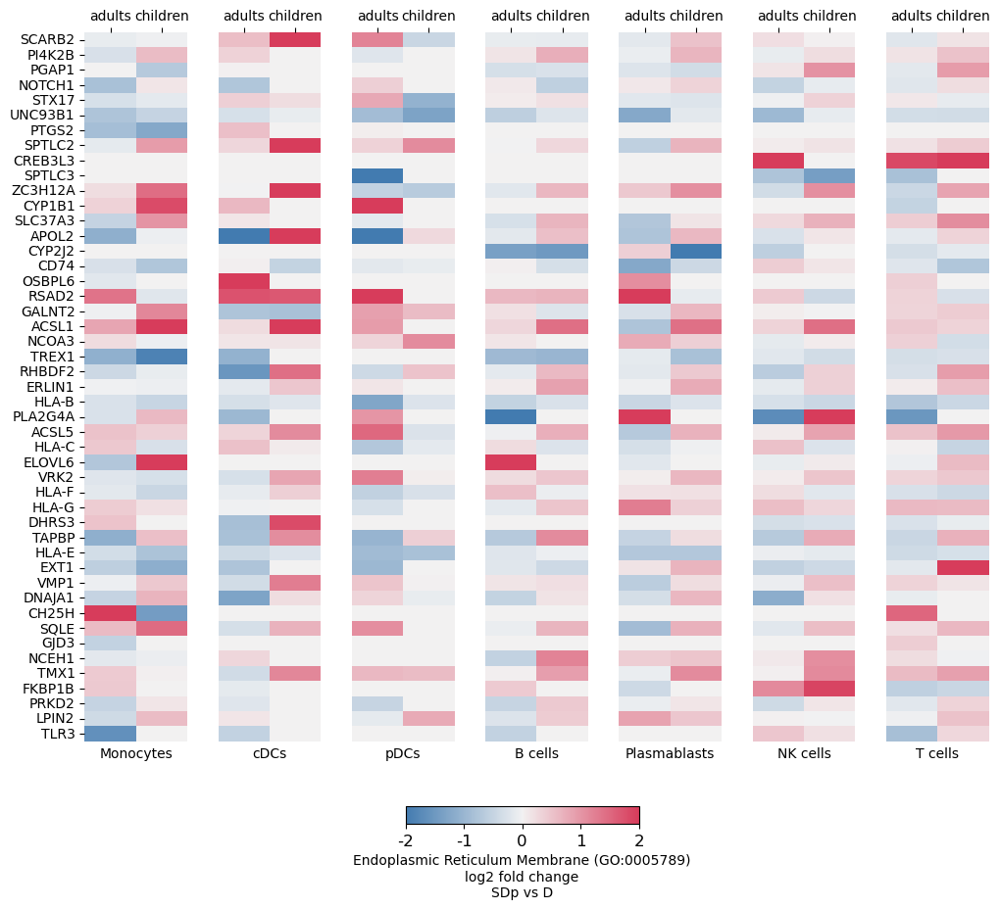

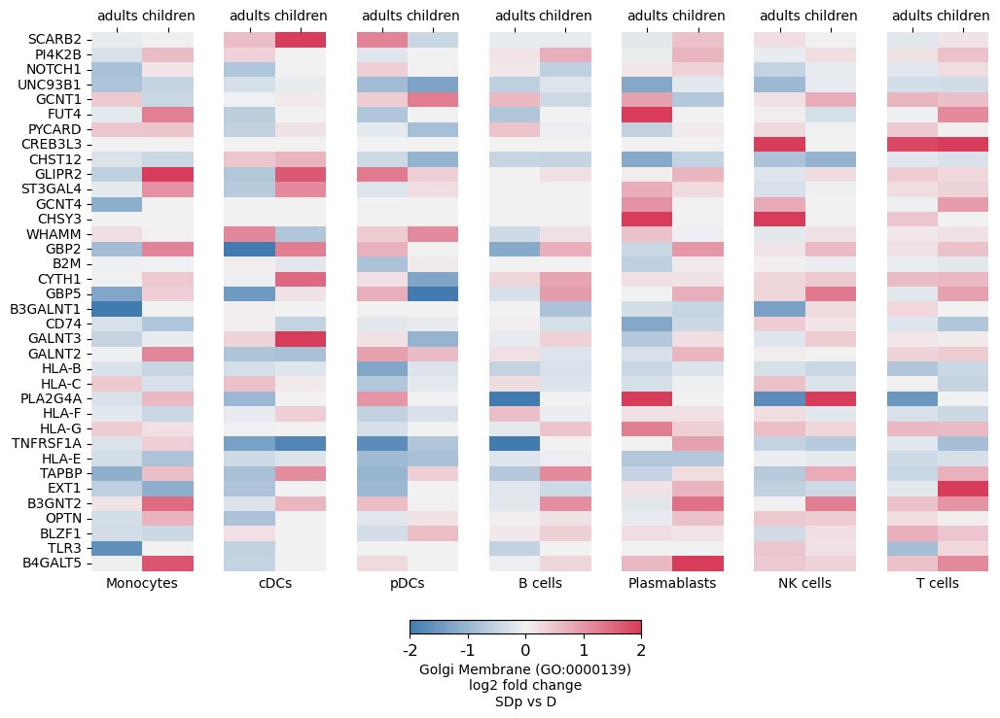

In [120]:
"""
9	GO_Cellular_Component_2025	Cytoplasmic Vesicle Membrane (GO:0030659)	36/415	0.000131	0.003633	0	0	2.063153	18.442993	RET;SCARB2;CAMK2D;NOTCH1;PLEKHF1;STEAP4;TFRC;M...	36
0	GO_Cellular_Component_2025	Endosome Membrane (GO:0010008)	40/392	0.000001	0.000335	0	0	2.483312	33.832896	RET;IFITM3;SCARB2;PI4K2B;CD274;NOTCH1;PLEKHF1;...	40
20	GO_Cellular_Component_2025	Lysosomal Membrane (GO:0005765)	29/383	0.004393	0.057031	0	0	1.767380	9.592800	IFITM3;SCARB2;IFITM1;ENPEP;IFITM2;PLEKHF1;STX1...	29
250	GO_Cellular_Component_2025	Mitochondrial Membrane (GO:0031966)	23/595	0.799414	0.882222	0	0	0.851528	0.190637	GSDMD;NDUFA9;CPT1A;RSAD2;ACSL1;IFI6;PLA2G4A;VR...	23
72	GO_Cellular_Component_2025	Endoplasmic Reticulum Membrane (GO:0005789)	47/872	0.111505	0.423107	0	0	1.223543	2.684072	SCARB2;PI4K2B;PGAP1;NOTCH1;STX17;UNC93B1;PTGS2...	47
17	GO_Cellular_Component_2025	Golgi Membrane (GO:0000139)	36/476	0.001656	0.025492	0	0	1.771335	11.341949	SCARB2;PI4K2B;NOTCH1;UNC93B1;GCNT1;FUT4;PYCARD...	36
"""

for i in [9, 0, 20, 250, 72, 17]:
    genes = df.Genes[i].split(';')
    genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
    #genes.sort()
    fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


In [ ]:
for i in [9, 0, 20, 250, 72, 17]:
    genes = df.Genes[i].split(';')
    genes = [gene if 'ORF' not in gene else 'orf'.join(gene.split('ORF')) for gene in genes ]
    #genes.sort()
    fig, ax = heatmaps_from_log2FC(all_stats2, selected_genes=genes, cols = ['adults', 'children'],
                               cts = ['Monocytes', 'cDCs', 'pDCs', 'B cells', 'Plasmablasts', 'NK cells', 'T cells',  ],
                              cmap = sns.diverging_palette(245, 5, as_cmap=True),
                              cbar_label = f'{df.Term[i]}\nlog2 fold change\nSDp vs D')


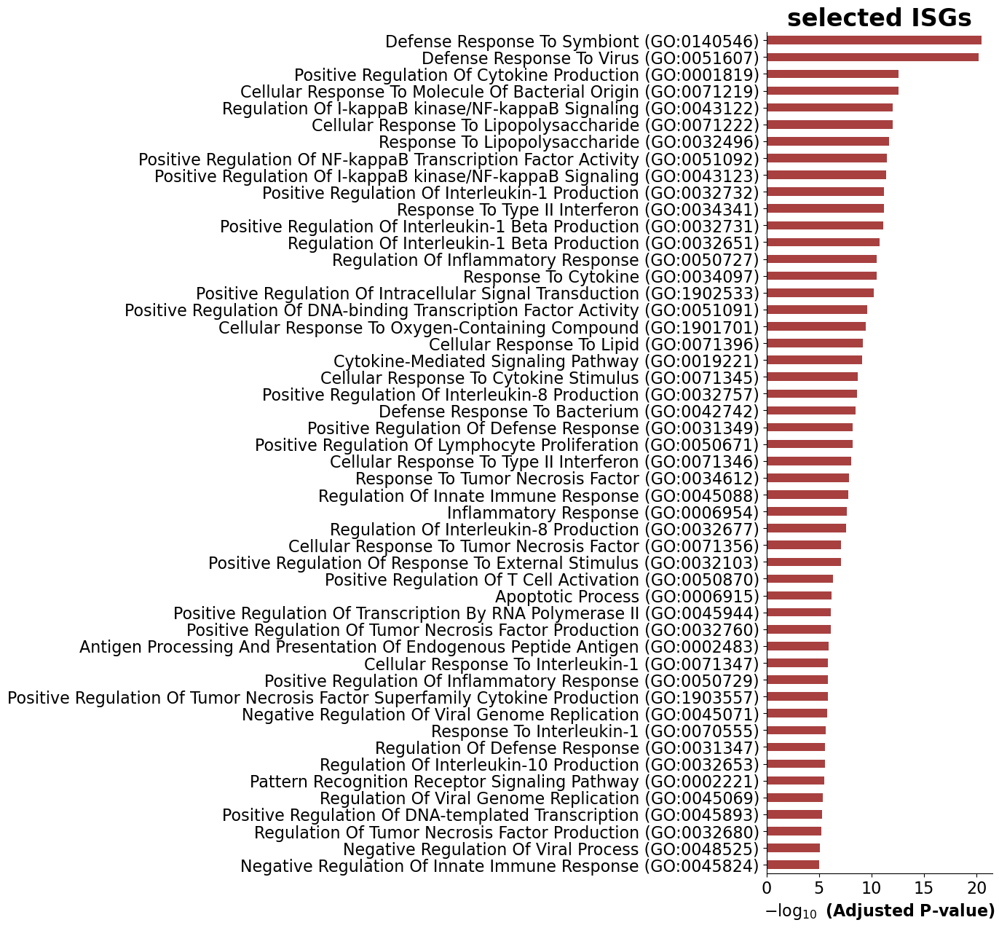

In [42]:
enriched_GO_2021 = gp.enrichr(gene_list=genes.to_list(),
                     gene_sets=['GO_Biological_Process_2023', 
                               #'MSigDB_Hallmark_2020', 
                                #'KEGG_2021_Human', 
                               ],
                     cutoff = 0.5)
ax = barplot(enriched_GO_2021.res2d,title=f'selected ISGs', 
             figsize=(4, 15), 
             top_term=50,
             color='darkred')
plt.show()

In [45]:
enriched_GO_2021.results.head(50)

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Defense Response To Symbiont (GO:0140546),40/148,1.062354e-24,3.381473e-21,0,0,10.837850,598.266176,RTP4;IFITM1;CD40;NLRC5;DDX60L;DDX60;SAMHD1;IFI...
1,GO_Biological_Process_2023,Defense Response To Virus (GO:0051607),44/189,3.750011e-24,5.968142e-21,0,0,8.916818,480.975706,RTP4;IFITM1;CD40;NLRC5;DDX60L;DDX60;SAMHD1;IFI...
2,GO_Biological_Process_2023,Positive Regulation Of Cytokine Production (GO...,46/320,2.640112e-16,2.801158e-13,0,0,4.915104,176.307431,CD274;CD40;CD80;SERPINE1;NOD1;NOD2;PTGS2;RELA;...
3,GO_Biological_Process_2023,Cellular Response To Molecule Of Bacterial Ori...,28/117,3.638574e-16,2.895395e-13,0,0,9.049654,321.713098,CD274;CXCL9;CD80;SERPINE1;TNFAIP3;NOD2;RELA;PY...
4,GO_Biological_Process_2023,Regulation Of I-kappaB kinase/NF-kappaB Signal...,38/232,1.472612e-15,9.374650e-13,0,0,5.688748,194.280618,RNF31;CD40;TFRC;TRADD;SECTM1;TNFAIP3;NOD1;NOD2...
5,GO_Biological_Process_2023,Cellular Response To Lipopolysaccharide (GO:00...,28/124,1.826107e-15,9.687497e-13,0,0,8.386727,284.616901,CD274;CXCL9;CD80;SERPINE1;TNFAIP3;NOD2;RELA;PY...
6,GO_Biological_Process_2023,Response To Lipopolysaccharide (GO:0032496),31/159,4.446729e-15,2.021991e-12,0,0,6.983741,230.788935,CD274;CXCL9;CD80;SERPINE1;TNFAIP3;NOD2;RELA;PY...
7,GO_Biological_Process_2023,Positive Regulation Of NF-kappaB Transcription...,30/152,8.738290e-15,3.476747e-12,0,0,7.082410,229.265141,RNF31;CD40;TFRC;TRADD;NOD1;NOD2;RELA;PYCARD;RP...
8,GO_Biological_Process_2023,Positive Regulation Of I-kappaB kinase/NF-kapp...,32/175,1.081144e-14,3.823647e-12,0,0,6.457494,207.661208,RNF31;CD40;TFRC;TRADD;SECTM1;NOD1;NOD2;RELA;CA...
9,GO_Biological_Process_2023,Response To Type II Interferon (GO:0034341),22/80,2.403688e-14,6.990489e-12,0,0,10.831168,339.656609,GBP5;CD74;CD40;CIITA;IFITM1;SP100;GCH1;CXCL16;...


In [46]:
df = enriched_GO_2021.results[enriched_GO_2021.results['Adjusted P-value']<=0.05]
for i, x in enumerate(df.Term.unique()):
    if 'interferon' in x:
        print(f'{i}: {x}')
        print(df.Term[i])
        print(df.Genes[i])

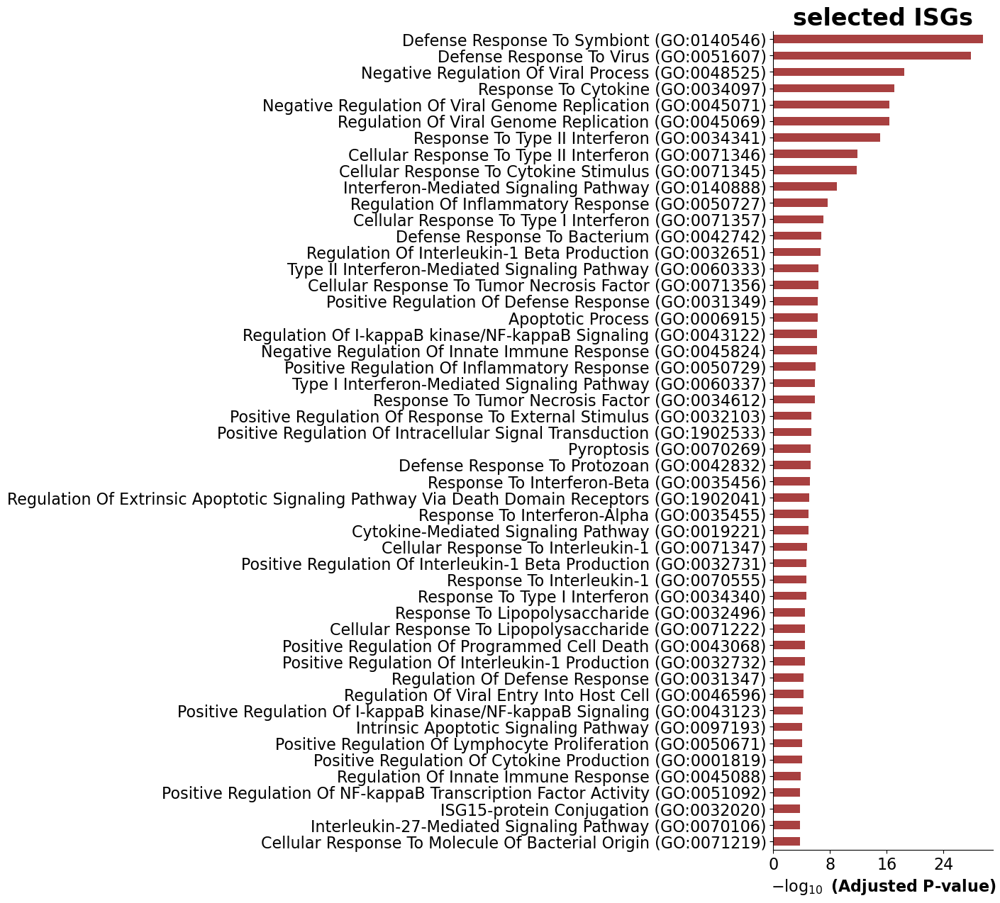

In [67]:
enriched_GO_2023 = gp.enrichr(gene_list=selected_genes,
                     gene_sets=['GO_Biological_Process_2023', 
                               #'MSigDB_Hallmark_2020', 
                                #'KEGG_2021_Human', 
                               ],
                     cutoff = 0.5)
ax = barplot(enriched_GO_2023.res2d,title=f'selected ISGs', 
             figsize=(4, 15), 
             top_term=50,
             color='darkred')
plt.show()

In [69]:
enriched_GO_2023.results[enriched_GO_2023.results['Adjusted P-value']<=0.05]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
0,GO_Biological_Process_2023,Defense Response To Symbiont (GO:0140546),30/148,1.811175e-33,2.794643e-30,0,0,37.131827,2799.417893,IFITM3;IFITM1;CD40;IFITM2;IFI6;DDX60L;IFIT1;SA...
1,GO_Biological_Process_2023,Defense Response To Virus (GO:0051607),31/189,1.538535e-31,1.186980e-28,0,0,28.811024,2044.122195,IFITM3;IFITM1;CD40;IFITM2;IFI6;DDX60L;IFIT1;SA...
2,GO_Biological_Process_2023,Negative Regulation Of Viral Process (GO:0048525),17/61,6.416164e-22,3.300047e-19,0,0,51.665694,2521.185209,IFITM3;IFITM1;IFITM2;APOBEC3G;STAT1;MX1;EIF2AK...
3,GO_Biological_Process_2023,Response To Cytokine (GO:0034097),20/125,2.236660e-20,8.627916e-18,0,0,25.917898,1172.699836,IFITM3;CD74;IFITM1;CD40;SP100;IFITM2;STAT1;MX2...
4,GO_Biological_Process_2023,Negative Regulation Of Viral Genome Replicatio...,15/53,1.390545e-19,4.291222e-17,0,0,52.097368,2262.037567,IFITM3;IFITM1;IFITM2;APOBEC3G;MX1;EIF2AK2;ISG1...
...,...,...,...,...,...,...,...,...,...,...
260,GO_Biological_Process_2023,Carboxylic Acid Biosynthetic Process (GO:0046394),2/17,8.481838e-03,4.938670e-02,0,0,16.212679,77.331692,PYCARD;CASP1
261,GO_Biological_Process_2023,Regulation Of Receptor Signaling Pathway Via S...,2/17,8.481838e-03,4.938670e-02,0,0,16.212679,77.331692,JAK2;JAK3
262,GO_Biological_Process_2023,Regulation Of Single Stranded Viral RNA Replic...,2/17,8.481838e-03,4.938670e-02,0,0,16.212679,77.331692,APOBEC3G;APOBEC3A
263,GO_Biological_Process_2023,Regulation Of Viral Transcription (GO:0046782),2/17,8.481838e-03,4.938670e-02,0,0,16.212679,77.331692,IFITM3;TRIM21


In [73]:
df = enriched_GO_2023.results[enriched_GO_2023.results['Adjusted P-value']<=0.05]
for i, x in enumerate(df.Term.unique()):
    if 'Interferon' in x:
        print(f'{i}: {x}')
        print(df.Term[i])
        print(df.Genes[i])

6: Response To Type II Interferon (GO:0034341)
Response To Type II Interferon (GO:0034341)
IFITM3;GBP5;CD74;CD40;IFITM1;SP100;IFITM2;STAT1;CCL5;CCL4;CASP1;CD47;GBP2;TRIM21;GBP1;GBP4
7: Cellular Response To Type II Interferon (GO:0071346)
Cellular Response To Type II Interferon (GO:0071346)
GBP5;SP100;IFNGR1;STAT1;IRF1;CCL5;CCL4;CASP1;CD47;JAK2;GBP2;GBP1;GBP4
9: Interferon-Mediated Signaling Pathway (GO:0140888)
Interferon-Mediated Signaling Pathway (GO:0140888)
IFITM3;IFITM1;SP100;IFITM2;IFI27;IFNGR1;STAT1;IRF1;JAK2;MYD88
11: Cellular Response To Type I Interferon (GO:0071357)
Cellular Response To Type I Interferon (GO:0071357)
IFITM3;IFITM1;SP100;IFITM2;IFI27;STAT1;IFIT1;MYD88
15: Type II Interferon-Mediated Signaling Pathway (GO:0060333)
Type II Interferon-Mediated Signaling Pathway (GO:0060333)
SP100;IFNGR1;STAT1;IRF1;JAK2
21: Type I Interferon-Mediated Signaling Pathway (GO:0060337)
Type I Interferon-Mediated Signaling Pathway (GO:0060337)
IFITM3;IFITM1;SP100;IFITM2;IFI27;STAT1;MYD

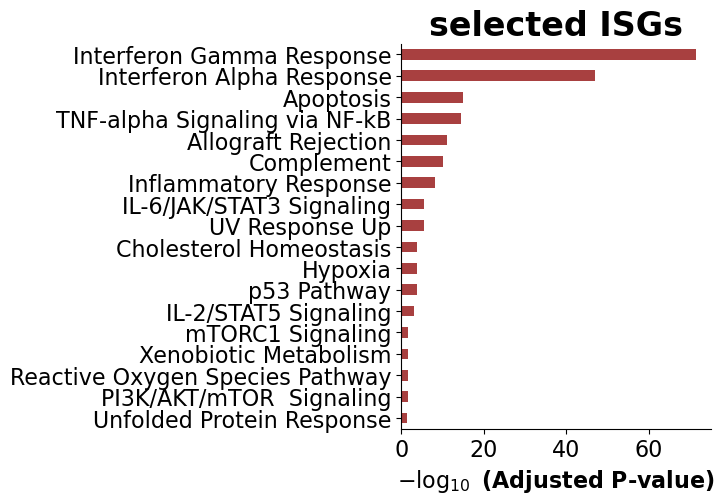

In [35]:
enriched_Hallmarks = gp.enrichr(gene_list=selected_genes,
                     gene_sets=[#'GO_Biological_Process_2021', 
                               'MSigDB_Hallmark_2020', 
                                #'KEGG_2021_Human', 
                               ],
                     cutoff = 0.5)
ax = barplot(enriched_Hallmarks.res2d,title=f'selected ISGs', 
             figsize=(4, 5), 
             top_term=50,
             color='darkred')
plt.show()

In [79]:
df = enriched_Hallmarks.results[enriched_Hallmarks.results['Adjusted P-value']<=0.05]
for i, x in enumerate(df.Term.unique()):
    if 'Interferon' in x:
        print(f'{i}: {x}')
        print(df.Term[i])
        print(df.Genes[i])

0: Interferon Gamma Response
Interferon Gamma Response
IFITM3;OGFR;SAMD9L;CD40;CDKN1A;IFITM2;SECTM1;TNFAIP3;UBE2L6;IFIT1;IFI44L;IFIT3;IFIT2;ICAM1;IL18BP;OASL;MT2A;CASP4;NAMPT;EPSTI1;TNFSF10;CASP1;CD38;JAK2;TRIM21;TAP1;TAPBP;IFI27;PSMA2;IRF1;OAS3;PSME2;CMPK2;TXNIP;LAP3;VAMP5;LY6E;SAMHD1;PSMB10;RNF213;CCL5;FCGR1A;GBP4;CD74;STAT1;MX2;MX1;STAT3;LYSMD2;IFI44;EIF2AK2;ISG15;NMI;PSMB9;ISG20;XAF1;MYD88
1: Interferon Alpha Response
Interferon Alpha Response
IFITM3;OGFR;IFITM1;SAMD9L;IFITM2;UBA7;CNP;SAMD9;UBE2L6;IFIT3;IFI44L;IFIT2;OASL;EPSTI1;CASP1;GBP2;TRIM21;GBP4;CD74;MX1;TAP1;IFI44;EIF2AK2;ISG15;NMI;PSMB9;ISG20;IFI27;IRF1;CMPK2;PSME2;TXNIP;LAP3;CD47;LY6E


In [80]:
ifna = df.Genes[1].split(';')
ifng = df.Genes[0].split(';')

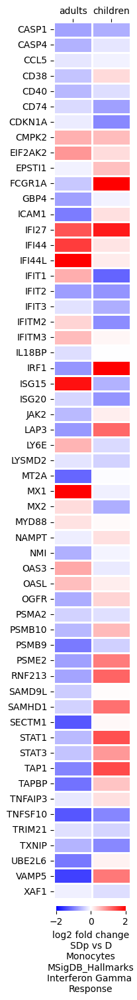

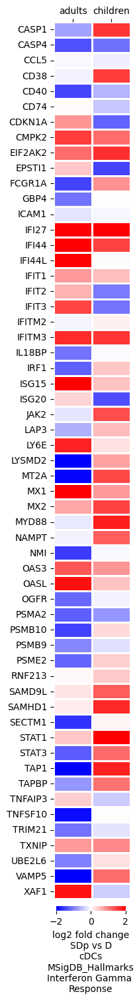

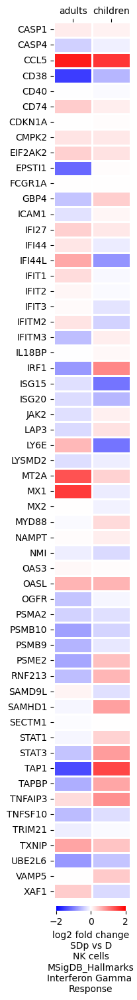

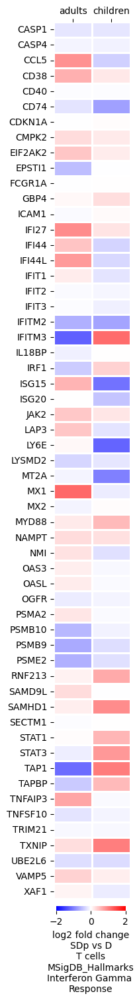

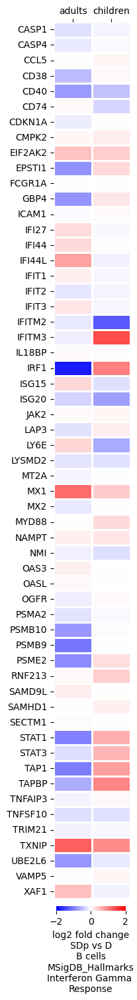

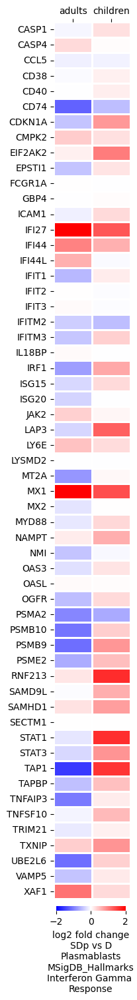

In [82]:
selected_genes = ifng
cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts']
for ct in cts:
    markers_genes = markers_all.reset_index().set_index('variable').loc[selected_genes, :].reset_index().fillna(0)
    markers_tmp = markers_genes[markers_genes['cell_type'].isin([ct])]

    fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,len(selected_genes)*0.3,), gridspec_kw={'wspace':0.4})
    cbar_ax = fig.add_axes([.15, .1, .7, .004])
    tmp = markers_tmp.pivot_table(index='variable', columns='Dataset', values='value')
    sns.heatmap(tmp, cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}\nMSigDB_Hallmarks\nInterferon Gamma \nResponse', 'orientation': 'horizontal'})
    ax.xaxis.tick_top()
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    fig.tight_layout()
    plt.show()


In [14]:
typeIIproduction = ['PYCARD', 'ISG15', #'CD47', 'JAK2'
                   ]
typeII = [#'SP100', 'STAT1', 'JAK2', 
    'IFNGR1', 'IRF1', ]
response2typeII = ['CD47', 'JAK2', 'SP100', 'STAT1', 'IFITM3', 'GBP5',  'CCL5', 'CCL4','CASP1', 'GBP2','GBP1', 'GBP4', 
                   'TRIM21', 'IFITM1', 'IFITM2', 'CD74', 'CD40', ]

typeIproduction_pos = ['DDX3X', 'STAT1', 'IRF1', 'MYD88',]
typeIproduction_neg = ['PYCARD', 'BANF1', 'XAF1', 'TRIM21',]
typeI = ['OAS3', 'ISG15', 'SAMHD1']
response2typeI = ['MX1', 'ISG15', 'IFIT1', 'IFITM3', 'IFITM1', 'SP100', 'IFITM2', 'IFI27', 'STAT1', 'IFIT1', 'MYD88']

infb_go = ['PYCARD', 'DDX3X', 'STAT1', 'IRF1', 'XAF1', 'OAS3', 'ISG15','IFITM1', 'IFITM2', 'IFITM3', ]
infa_go = ['IFITM3', 'IFITM1', 'IFITM2', 'MX2', 'EIF2AK2']




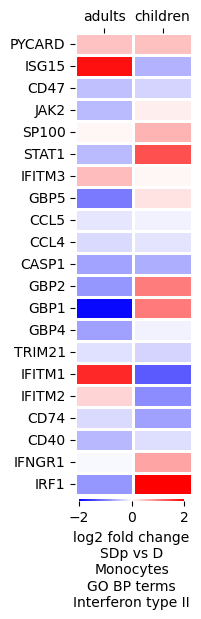

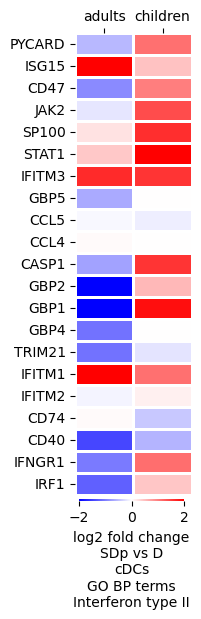

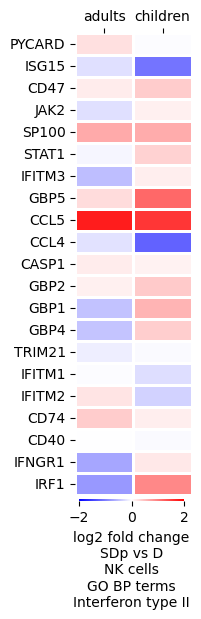

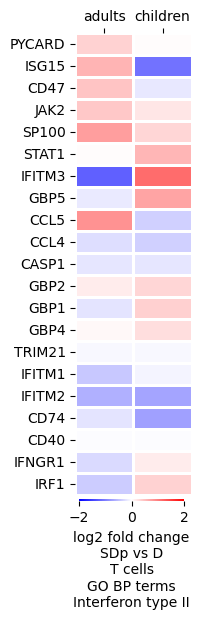

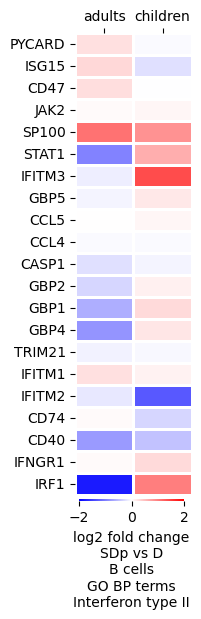

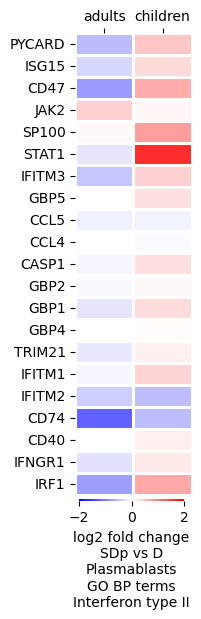

In [15]:
selected_genes = [*typeIIproduction, *response2typeII, *typeII]
cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts']
for ct in cts:
    markers_genes = markers_all.reset_index().set_index('variable').loc[selected_genes, :].reset_index().fillna(0)
    markers_tmp = markers_genes[markers_genes['cell_type'].isin([ct])]

    fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,6,), gridspec_kw={'wspace':0.4})
    cbar_ax = fig.add_axes([.15, .1, .7, .004])
    tmp = markers_tmp.pivot_table(index='variable', columns='Dataset', values='value')
    tmp = tmp.loc[selected_genes]
    sns.heatmap(tmp, cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}\nGO BP terms\nInterferon type II', 'orientation': 'horizontal'})
    ax.xaxis.tick_top()
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    fig.tight_layout()
    plt.show()


In [16]:
typeIproduction_neg = ['PYCARD', 'BANF1', 'XAF1', 'TRIM21',]
typeIproduction_pos = ['DDX3X','IRF1', 'STAT1',  'MYD88',]
response2typeI = ['STAT1', 'MYD88', 'ISG15', 'MX1', 'IFIT1', 'IFITM3', 'IFITM1', 'SP100', 'IFITM2', 'IFI27', 'IFIT1']
typeI = ['OAS3', 'SAMHD1']

infb_go = ['PYCARD', 'DDX3X', 'STAT1', 'IRF1', 'XAF1', 'OAS3', 'ISG15','IFITM1', 'IFITM2', 'IFITM3', ]
infa_go = ['IFITM3', 'IFITM1', 'IFITM2', 'MX2', 'EIF2AK2']


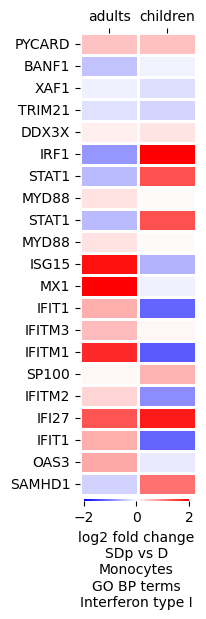

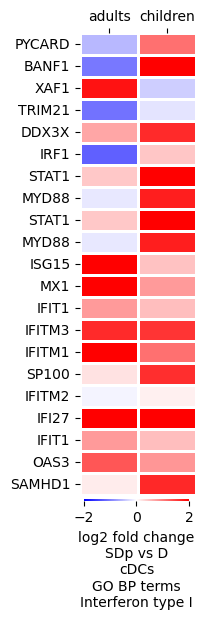

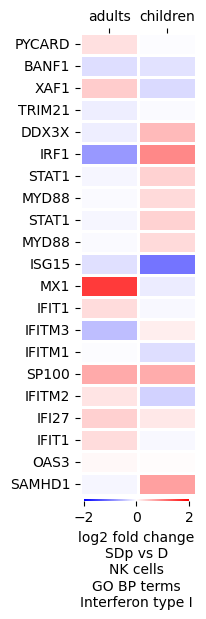

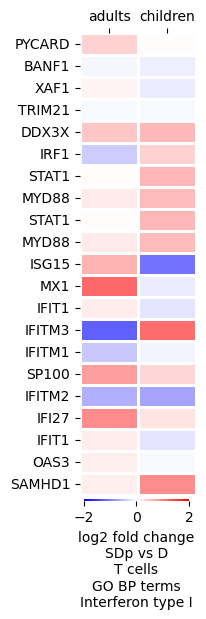

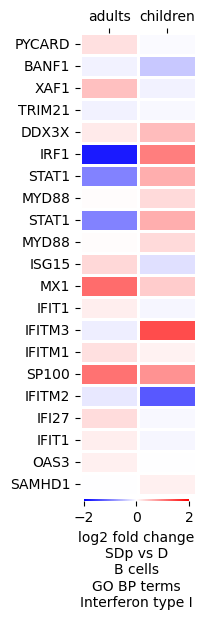

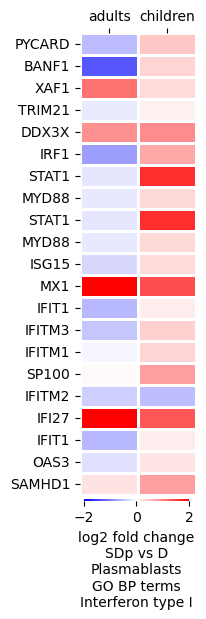

In [17]:
selected_genes = [*typeIproduction_neg, *typeIproduction_pos, *response2typeI, *typeI,]
cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts']
for ct in cts:
    markers_genes = markers_all.reset_index().set_index('variable').loc[selected_genes, :].reset_index().fillna(0)
    markers_tmp = markers_genes[markers_genes['cell_type'].isin([ct])]

    fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,6,), gridspec_kw={'wspace':0.4})
    cbar_ax = fig.add_axes([.15, .1, .7, .004])
    tmp = markers_tmp.pivot_table(index='variable', columns='Dataset', values='value')
    tmp = tmp.loc[selected_genes]
    sns.heatmap(tmp, cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}\nGO BP terms\nInterferon type I', 'orientation': 'horizontal'})
    ax.xaxis.tick_top()
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    fig.tight_layout()
    plt.show()


In [18]:
infb_go = ['PYCARD', 'DDX3X', 'STAT1', 'IRF1', 'XAF1', 'OAS3', 'ISG15',]
infa_go = ['MX2', 'EIF2AK2', 'IFITM1', 'IFITM2', 'IFITM3', ]


In [19]:
tmp.loc[selected_genes]

Dataset,adults,children
variable,,
PYCARD,-0.522470,0.452623
BANF1,-1.327533,0.332001
XAF1,1.106009,0.293212
TRIM21,-0.166520,0.111368
DDX3X,0.868798,0.899507
IRF1,-0.758835,0.681348
STAT1,-0.195099,1.634691
STAT1,-0.195099,1.634691
MYD88,-0.173838,0.302390


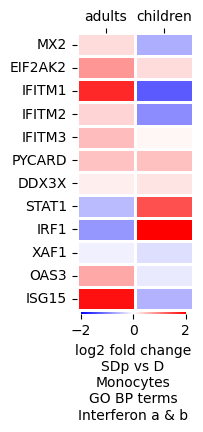

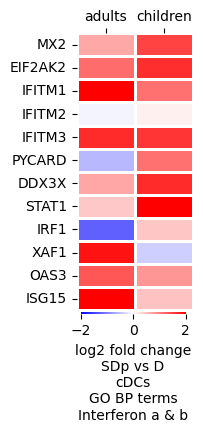

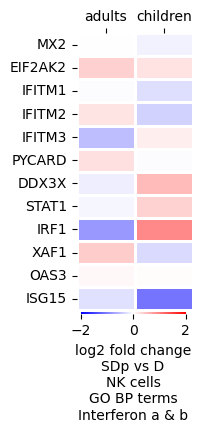

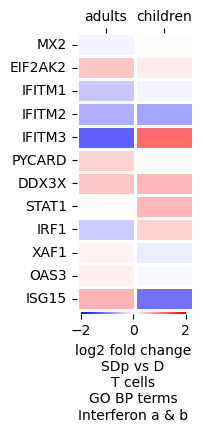

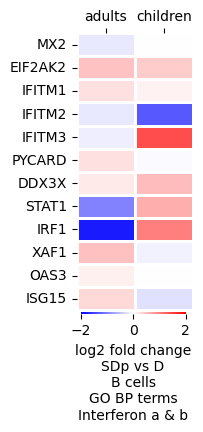

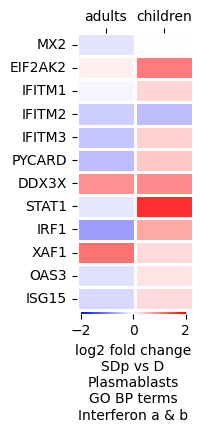

In [20]:
selected_genes = [*infa_go, *infb_go]
cts = ['Monocytes', 'cDCs', 'NK cells', 'T cells', 'B cells', 'Plasmablasts']
for ct in cts:

    markers_genes = markers_all.reset_index().set_index('variable').loc[selected_genes, :].reset_index().fillna(0)
    markers_tmp = markers_genes[markers_genes['cell_type'].isin([ct])]
    fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,3.6,), gridspec_kw={'wspace':0.4})
    cbar_ax = fig.add_axes([.15, .1, .7, .004])
    tmp = markers_tmp.pivot_table(index='variable', columns='Dataset', values='value')
    tmp = tmp.loc[selected_genes]
    sns.heatmap(tmp, cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}\nGO BP terms\nInterferon a & b', 'orientation': 'horizontal'})
    ax.xaxis.tick_top()
    ax.set_title('')
    ax.set_xlabel('')
    ax.set_ylabel('')
    fig.tight_layout()
    plt.show()


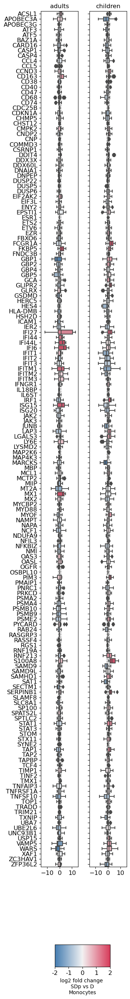

In [37]:
ct='Monocytes'
fig, ax = boxplots_from_log2FC(df.loc[ct][selected_genes], df2.loc[ct][selected_genes], vmin=-2, vmax=2,
                              title=ct, xlim=15,
                              height=30, aspect = 0.1, 
                              cbar_label= f'log2 fold change \nSDp vs D\n{ct}',
                             )
plt.show()


In [53]:
markers_all = df_med.reset_index().melt(id_vars=['cell_type'], value_vars=[*df_med.columns])
n1=markers_all.shape[0]
markers_all = pd.concat([df2_med.reset_index().melt(id_vars=['cell_type'], value_vars=[*df2_med.columns])])
n2 = markers_all.shape[0] - n1

markers_all['Dataset'] = n1*['adults'] + n2*['children']
markers_all

,cell_type,variable,value,Dataset
0,B cells,MIR1302-2HG,-0.000000,adults
1,Monocytes,MIR1302-2HG,-0.000000,adults
2,NK cells,MIR1302-2HG,-0.000000,adults
3,Plasmablasts,MIR1302-2HG,-0.000000,adults
4,T cells,MIR1302-2HG,-0.000000,adults
...,...,...,...,...
130315,Monocytes,ZZEF1,0.014514,children
130316,NK cells,ZZEF1,0.045093,children
130317,Plasmablasts,ZZEF1,0.138119,children
130318,T cells,ZZEF1,0.142024,children


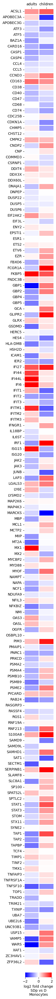

In [105]:
ct = 'Monocytes'
markers_genes = markers_all.reset_index().set_index('variable').loc[selected_genes, :].reset_index().fillna(0)
markers_tmp = markers_genes[markers_genes['cell_type'].isin([ct])]

fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,len(selected_genes)*0.3,), gridspec_kw={'wspace':0.4})
cbar_ax = fig.add_axes([.15, .1, .7, .004])
#cbar_ax = fig.add_axes([.91, .3, .03, .4])
 
tmp = markers_tmp.pivot_table(index='variable', columns='Dataset', values='value')
sns.heatmap(tmp, cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}', 'orientation': 'horizontal'})
ax.xaxis.tick_top()


ax.set_title('')
ax.set_xlabel('')
ax.set_ylabel('')
fig.tight_layout()
plt.show()


In [80]:
tmp['DEG'] = 'no'
sc_col = 'adults'
cy_col = 'children'

tmp.loc[tmp[(tmp[sc_col] > 1) | (tmp[cy_col] > 1)].index, 'DEG'] = 'upregulated_either'
tmp.loc[tmp[(tmp[sc_col] > 1) & (tmp[cy_col] > 1)].index, 'DEG'] = 'upregulated_both'
tmp.loc[tmp[(tmp[sc_col] < -1) | (tmp[cy_col] < -1)].index, 'DEG'] = 'downregulated_either'
tmp.loc[tmp[(tmp[sc_col] < -1) & (tmp[cy_col] < -1)].index, 'DEG'] = 'downregulated_both'
tmp.loc[tmp[(tmp[sc_col] < -1) & (tmp[cy_col] > 1)].index, 'DEG'] = 'reverse'
tmp.loc[tmp[(tmp[sc_col] > 1) & (tmp[cy_col] < -1)].index, 'DEG'] = 'reverse'


tmp = tmp[tmp.DEG != 'no']
tmp['tosort'] = tmp.DEG.replace({'upregulated_both':0, 'upregulated_either':1, 'reverse':2,
                                'downregulated_either':3, 'downregulated_both':4})


tmp = tmp.sort_values(['tosort', 'adults', 'children'], ascending=[True, False, False])
tmp

Dataset,adults,children,DEG,tosort
variable,,,,
FKBP5,1.959625,1.357300,upregulated_both,0
IFI27,1.336810,1.793422,upregulated_both,0
IFI6,3.268317,0.433512,upregulated_either,1
IFI44L,2.580839,0.148314,upregulated_either,1
MX1,2.578465,-0.120987,upregulated_either,1
ISG15,1.859480,-0.601004,upregulated_either,1
IFI44,1.519193,0.207097,upregulated_either,1
CD163,1.140358,0.861690,upregulated_either,1
ACSL1,0.823886,1.276671,upregulated_either,1


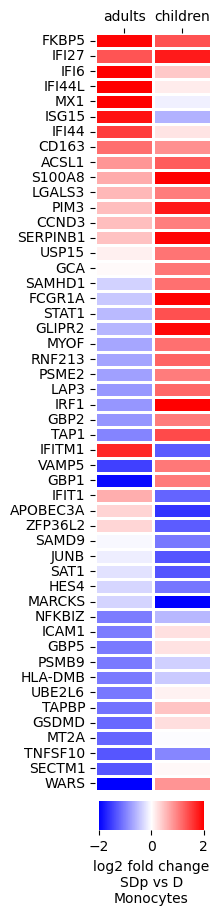

In [82]:
fig, ax = plt.subplots(1, 1, sharex=True, figsize=(1.5,len(selected_genes)*0.06,), gridspec_kw={'wspace':0.4})
cbar_ax = fig.add_axes([.15, .07, .7, .03])
sns.heatmap(tmp[['adults', 'children']], cmap='bwr', vmin=-2, vmax=2, ax=ax, linewidths=1,
            #cbar=i == 0, cbar_ax=None if i else cbar_ax, 
            cbar=True, cbar_ax=cbar_ax, 
            cbar_kws={'label': f'log2 fold change\nSDp vs D\n{ct}', 'orientation': 'horizontal'})

ax.xaxis.tick_top()
ax.set_title('')
ax.set_xlabel('')
ax.set_ylabel('')

fig.tight_layout()
plt.show()


In [107]:
adata = sc.read_h5ad(path + 'data/merged_dengue_and_covid_all.h5ad')

filtered = adata[(adata.obs.Dataset.isin(['Children_viscRNAseq', 'Adults_citeseq'])) & 
                 (adata.obs.cell_quality == 'high')]

filtered = filtered[(filtered.obs.ID.isin(['1-056-01', '1-172-01', '1_003_1', '1_053_01', '1_183_01',
                                          '1_001_1', '1_013_01', '1_026_02', '1_036_02', '5_049_01',
                                           '1_019_01', '6_023_01', '5_030_01', '5_193_01', '5_154_01', 
                                            '6_001_01', '5_041_01', '1_140_01', '1_144_01', '5_044_01', 
                                            '1_002_01', '1_113_01', '5_010_01', '5_130_01'
                                          ]))].copy()

sc.pp.normalize_total(filtered, target_sum=1e6)
sc.pp.log1p(filtered, base=2)
filtered.raw = filtered

del(adata)
#del(filtered.layers['clr'])
filtered.obs.cell_type_new.cat.reorder_categories(['NK cells', 'Monocytes', 'cDCs', 'pDCs', 'T cells', 'B cells', 'Plasmablasts', 'megakaryocytes', 'HSPCs', 'Erythroblasts', 'Doublets', 'unknown', 'unknown2'], inplace=True)
filtered

AnnData object with n_obs × n_vars = 147194 × 42244
    obs: 'Age', 'Condition', 'DENV_minus', 'DENV_plus', 'DENV_reads', 'Gender', 'ID', 'batch', 'cell_quality', 'cell_subtype', 'cell_subtype_2', 'cell_subtype_zhiyuan', 'cell_type', 'cell_type_zhiyuan', 'cell_type_new_2', 'doublets', 'mt_frac', 'n_counts', 'n_genes', 'platform', 'viral_load_nano', 'viral_load_qpcr', 'Dengue_exposure', 'cell_subtype_luca', 'cell_subtype_new', 'cell_type_luca', 'cell_type_new', 'cell_subtype_NK', 'Dataset', 'Admission', 'Sample', 'Stage', 'Experiment', 'Date', 'Date of symptoms onset', 'Days', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'doublet_score', 'predicted_doublets', 'mad_prd', 'n_proteins_by_counts', 'total_counts_adt', 'total_counts_log1p', 'total_counts_adt_log1p', 'rna_quality', 'protein_quality', 'high_quality', 'TCR_umi', 'TCR_umi_log1p', 'TCR_IR_VJ_2_c_call', 'TCR_IR_VDJ_2_c_call', 'TCR_IR_VJ_2_d_call', 'TCR_IR_VDJ_2_d_call', 'TCR_IR_VJ_2_v_call', 'TCR_IR_VDJ_

In [112]:
filtered.obs['bystanders'] = 'D'
filtered.obs.loc[(filtered.obs.Condition=='SD'), 'bystanders'] = 'SDp'
ind = ['CAAGAAAAGACTAAGT-1-9', 'CGATGGCTCAAGATCC-1-9', 'CTTCTCTTCTAACGGT-1-9', 'GACCAATCAATGGATA-1-9', 'GCATGATAGGAGTAGA-1-9', 'GCGCAACCAGTGAGTG-1-9', 'GGTGCGTTCGTCCAGG-1-1', 'TATCTCACATACCATG-1-1', 'TCGTACCTCACGGTTA-1-1', 'CGCTATCTCTTTACGT-1-8', 'GTACTCCGTTGCTCCT-1-8', 'TGCCCTATCAAGGCTT-1-8',]
filtered.obs['bystanders'].loc[ind] = 'VHCs'
filtered.obs['bystanders'].unique()

array(['D', 'SDp', 'VHCs'], dtype=object)

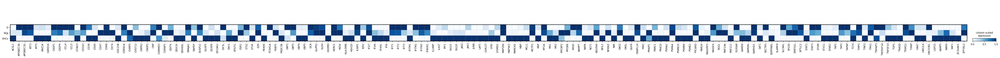

In [113]:
ct = 'B cells'
adata_ct = filtered[filtered.obs.cell_type_new.isin(['B cells'])]
sc.pl.matrixplot(
    adata_ct[(adata_ct.obs.Dataset.isin(['Adults_citeseq']))] ,
    selected_genes,
    "bystanders",
#    dendrogram=True,
    cmap="Blues",
    standard_scale="var",
    colorbar_title="column scaled\nexpression",
)

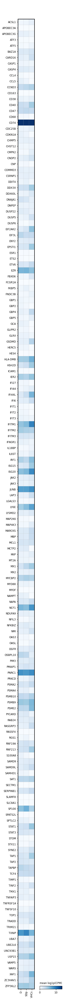

In [114]:
ct = 'B cells'
adata_ct = filtered[filtered.obs.cell_type_new.isin(['B cells'])]
sc.pl.matrixplot(
    adata_ct[(adata_ct.obs.Dataset.isin(['Adults_citeseq']))] ,
    selected_genes,
    "bystanders",
#    dendrogram=True,
    cmap="Blues",
    #standard_scale="var",
    swap_axes=True,
    colorbar_title="mean log1p(CPM)",
)

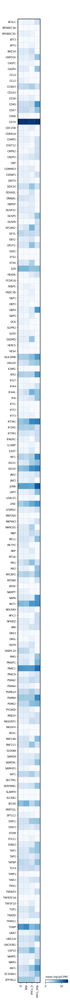

In [115]:
filtered.obs['bystanders'] = 'D'
filtered.obs.loc[(filtered.obs.Condition=='SD'), 'bystanders'] = 'SDp'
ind = ['CAAGAAAAGACTAAGT-1-9', 'CGATGGCTCAAGATCC-1-9', 'CTTCTCTTCTAACGGT-1-9', 'GACCAATCAATGGATA-1-9', 'GCATGATAGGAGTAGA-1-9', 'GCGCAACCAGTGAGTG-1-9', 'GGTGCGTTCGTCCAGG-1-1', 'TATCTCACATACCATG-1-1', 'TCGTACCTCACGGTTA-1-1',] 
filtered.obs['bystanders'].loc[ind] = 'VHCs_D'
ind = ['CGCTATCTCTTTACGT-1-8', 'GTACTCCGTTGCTCCT-1-8', 'TGCCCTATCAAGGCTT-1-8',]
filtered.obs['bystanders'].loc[ind] = 'VHCs_SDp'
#filtered.obs['bystanders'].unique()

ct = 'B cells'
adata_ct = filtered[filtered.obs.cell_type_new.isin(['B cells'])]
sc.pl.matrixplot(
    adata_ct[(adata_ct.obs.Dataset.isin(['Adults_citeseq']))] ,
    selected_genes,
    "bystanders",
#    dendrogram=True,
    cmap="Blues",
    #standard_scale="var",
    swap_axes=True,
    colorbar_title="mean log1p(CPM)",
)

import anndataks
p=2
n=100
dic_1 = {}
for x in np.arange(n):
    # w/o replacement
    from random import sample
    ind_bystander = list(adata_tmp[adata_tmp.obs.loc[:,'bystanders'] == 'zero',].obs.index)
    length_vhc = len(adata_tmp[adata_tmp.obs.loc[:,'bystanders'] == 'high',].obs.index)

    ind_vhc = list(adata_tmp[adata_tmp.obs.loc[:,'bystanders'] == 'high',].obs.index)
    length_bystander = len(adata_tmp[adata_tmp.obs.loc[:,'bystanders'] == 'zero',].obs.index)

    if length_bystander > length_vhc: 
        samplelist2 = sample(ind_bystander, length_vhc)
        samplelist1 = ind_vhc
    else: 
        samplelist1 = sample(ind_vhc, length_bystander)
        samplelist2 = ind_bystander

    adata_1 = adata_tmp[np.in1d(adata_tmp.obs.index, samplelist1),:]
    adata_2 = adata_tmp[np.in1d(adata_tmp.obs.index, samplelist2),:]
    results = anndataks.compare(adata_1, adata_2, log1p=2)
    results_sort = results.sort_values(by = 'statistic', ascending=False)
    results_sort['-log10p'] = pd.Series(-np.log10(results_sort['pvalue']))
    
    dic_1[x] = results_sort

    
    
val = np.empty((len(dic_1), len(genelist)))
for i in range(len(dic_1)):
    val[i] = dic_1[i].loc[genelist]['log2_fold_change'].tolist() 
log2FCs = pd.DataFrame(val, columns=genelist)
log2FCs

height=5
aspect=0.5
fig, ax = plt.subplots(figsize=[height*aspect, height])
cmap = sns.diverging_palette(245, 5, as_cmap=True)
norm = mpl.colors.Normalize(vmin=-1.5, vmax=1.5)

palette = [cmap(norm(x)) for x in np.clip(log2FCs[genelist].median(axis=0), -1.5, 1.5)]
sns.boxplot(data=log2FCs, orient="h", ax=ax, palette=palette)
ax.set_title('all_cell_types')
ax.set_xlim(-2, 2)
ax.set_xticks([-2,-1, 0, 1,2])
for x in [-1, 0, 1]:
    ax.axvline(x, c='black', ls='-.', lw=0.5, zorder=0.5)
    
ax_cb = fig.add_axes([0.25, 0.04, 0.5, 0.02])
cbar = mpl.colorbar.ColorbarBase(ax_cb, norm=norm, cmap=cmap, orientation='horizontal')
cbar.set_ticks([-1, 0, 1])
cbar.set_ticklabels(['-1', '0', '1'])
cbar.ax.tick_params(labelsize=15)
cbar.set_label(f'log2 fold change \n(VHCs vs bystanders)\n{ct}')

#fig.tight_layout()
#data_path = '/Users/busracagirici/Documents/scrnaseq/organ_lung_data/'
#fig.savefig(data_path + 'results/figures/24h_infected_RMC113_box_DEGs_VHCs_autophagy_more_than_3vRNAs.pdf', bbox_inches='tight')

In [15]:
markers_all

,cell_type,variable,value,Dataset
0,B cells,MIR1302-2HG,-0.000000,adults
1,Monocytes,MIR1302-2HG,-0.000000,adults
2,NK cells,MIR1302-2HG,-0.000000,adults
3,Plasmablasts,MIR1302-2HG,-0.000000,adults
4,T cells,MIR1302-2HG,-0.000000,adults
...,...,...,...,...
130315,Monocytes,ZZEF1,0.014514,children
130316,NK cells,ZZEF1,0.045093,children
130317,Plasmablasts,ZZEF1,0.138119,children
130318,T cells,ZZEF1,0.142024,children


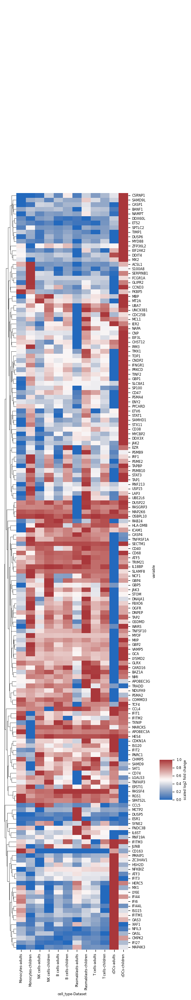

In [36]:
df_all = markers_all.pivot(index='variable', columns=['cell_type', 'Dataset'], values='value')
df_all = df_all[[('Monocytes',   'adults'),
        (   'Monocytes', 'children'),
            (    'NK cells',   'adults'),
        (    'NK cells', 'children'),
    ('B cells', 'adults'),
        (     'B cells', 'children'),
            ('Plasmablasts',   'adults'),
        ('Plasmablasts', 'children'),
            (     'T cells',   'adults'),
        (     'T cells', 'children'),
            (        'cDCs',   'adults'),
            (        'cDCs', 'children')]]
rcParams['font.size']=6
sns.clustermap(
    df_all.loc[selected_genes],
    figsize=(4, 25),
    col_cluster=False,
    row_cluster=True,
    dendrogram_ratio=(.1, .2),
    cbar_pos=(1., .2, .08, .04),
    standard_scale=0,
    cbar_kws={'label': 'scaled log2 fold change'},
    cmap='vlag'
)

In [25]:
selected_genes = list(set([*df_med[abs(df_med[genes]) >= 1].dropna(axis=1, how='all').columns, 
                 *df2_med[abs(df2_med[genes]) >= 1].dropna(axis=1, how='all').columns]))
selected_genes.sort()
len(selected_genes)

165

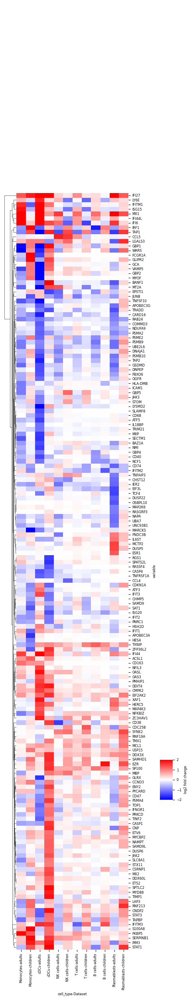

In [26]:
df_all = markers_all.pivot(index='variable', columns=['cell_type', 'Dataset'], values='value')
df_all = df_all[[('Monocytes',   'adults'),
        (   'Monocytes', 'children'),
                 (        'cDCs',   'adults'),
            (        'cDCs', 'children'),
            (    'NK cells',   'adults'),
        (    'NK cells', 'children'),
                 (     'T cells',   'adults'),
        (     'T cells', 'children'),
    ('B cells', 'adults'),
        (     'B cells', 'children'),
            ('Plasmablasts',   'adults'),
        ('Plasmablasts', 'children'),
            ]]
rcParams['font.size']=6
sns.clustermap(
    df_all.loc[selected_genes],
    figsize=(4, 25),
    col_cluster=False,
    row_cluster=True,
    dendrogram_ratio=(.1, .2),
    cbar_pos=(1., .2, .08, .04),
    cbar_kws={'label': 'log2 fold change'},
    #standard_scale=0,
    cmap='bwr',
    vmin=-2, vmax=2
)